In [4]:
from intensity_normalization.normalize import zscore
import nibabel as nib
import SimpleITK as sitk
import matplotlib.pyplot as plt
import subprocess
import os
import csv
import numpy as np
from intensity_normalization.plot import hist
from intensity_normalization.normalize import fcm
import time
from preprocessing import preprocess
from tqdm import tqdm
import pandas as pd
from intensity_normalization.normalize import ravel
import nilearn

## Pipeline del preprocessing:
Come prima cosa, devo aver già fatto lo sull stripping delle immagini (vedere skull_stripping.ipynb e produce come output le maschere e le immagini tagliate nella cartella ROBEX/output<br/>
##### Preprocessing N4
La prima parte della pipeline effettua la correzione n4 usando ants (attenzione: gira solo su pc linux) e crea come output le immagini corrette e le maschere all'interno delle cartelle dei pazienti (cartelle img e mask)
##### Normalizzazione d'intensità
Normalizzo l'intensità delle immagini usando img e mask. L'output è salvato nella cartella ADNI_preprocessed_with_skull
##### Applico le maschere
Applico le maschere che ho creato e salvo le immagini nella cartella /output_ADNI
##### CROP delle immagini
Elimino il bordo nullo che si crea applicando la maschera. Salvo le immagini in output_ADNI_crop
##### registrazione usando plastimatch
Utilizzo plastimatch pe registrare le immagini. gli output hanno tutti la stessa dimensione. salvo il tutto nella cartella ADNI_registrate

In [2]:
img_brain = '/media/fabio/Disco locale/Scaricati/ADNI/'

In [3]:
brain_mask = '/media/fabio/Disco locale/Scaricati/ADNI/ROBEX/output/'

In [4]:
for i, (roots, dirs, files) in enumerate(os.walk(img_brain)):
    if i >=0:

        if ('Mask' not in roots) and len(files)!=0 and ('ROBEX' not in roots):
            for file in files:
                if '.nii' in file:
                    print(roots)
                    print()
                    print(file)
                    for i, (roots_robex, dirs_robex, files_robex) in enumerate(os.walk(brain_mask)):
                        if len(files_robex)!=0:
                            for file_robex in files_robex:
                                #print(file_robex)
                                if file.split('.')[0] in file_robex and 'robex' in file_robex and 'mask' in file_robex:
                                    print(file_robex)
                                    preprocess(roots + '/' + file, roots, roots_robex + '/' +file_robex)

/media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_20_30.0/S13408

ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108.nii
ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-04-18_08_20_30.0/S13408

ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii
ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/002_S_0413/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-02_12_31_52.0/S13893

ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319115331858_S13893_I45117.nii
ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319115331858_S13893_I45117_robex

/media/fabio/Disco locale/Scaricati/ADNI/002_S_1261/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-15_11_02_42.0/S26574

ADNI_002_S_1261_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727130404463_S26574_I62377.nii
ADNI_002_S_1261_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727130404463_S26574_I62377_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/002_S_1268/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-14_07_55_55.0/S26498

ADNI_002_S_1268_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802165115484_S26498_I64037.nii
ADNI_002_S_1268_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802165115484_S26498_I64037_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/002_S_1280/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-13_07_59_35.0/S26453

ADNI_002_S_1280_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070713123810416_S26453_I60056.nii
ADNI_002_S_1280_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070713123810416_S26453_I60056_robex_mask.ni

/media/fabio/Disco locale/Scaricati/ADNI/068_S_0442/MPR-R____N3__Scaled_2/2006-05-09_11_03_17.0/S14128

ADNI_068_S_0442_MR_MPR-R____N3__Scaled_2_Br_20081212150437526_S14128_I130241.nii
ADNI_068_S_0442_MR_MPR-R____N3__Scaled_2_Br_20081212150437526_S14128_I130241_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/068_S_0473/MPR____N3__Scaled/2006-05-03_12_45_12.0/S13925

ADNI_068_S_0473_MR_MPR____N3__Scaled_Br_20090402095548096_S13925_I140334.nii
ADNI_068_S_0473_MR_MPR____N3__Scaled_Br_20090402095548096_S13925_I140334_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/068_S_0476/MPR____N3__Scaled/2006-05-11_10_35_25.0/S14509

ADNI_068_S_0476_MR_MPR____N3__Scaled_Br_20070731181501664_S14509_I63459.nii
ADNI_068_S_0476_MR_MPR____N3__Scaled_Br_20070731181501664_S14509_I63459_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/068_S_0476/MPR____N3__Scaled_2/2006-05-11_10_35_25.0/S14509

ADNI_068_S_0476_MR_MPR____N3__Scaled_2_Br_20081212151202583_S14509_I130246.nii
ADNI_

/media/fabio/Disco locale/Scaricati/ADNI/073_S_0518/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-09-11_14_16_35.0/S18797

ADNI_073_S_0518_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105453633_S18797_I119233.nii
ADNI_073_S_0518_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105453633_S18797_I119233_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/073_S_0565/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-21_14_22_31.0/S15762

ADNI_073_S_0565_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213213329963_S15762_I39919.nii
ADNI_073_S_0565_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213213329963_S15762_I39919_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/073_S_0565/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-06-21_14_22_31.0/S15762

ADNI_073_S_0565_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105531714_S15762_I119234.nii
ADNI_073_S_0565_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105531714_S15762_I1192

/media/fabio/Disco locale/Scaricati/ADNI/023_S_0084/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-01-04_09_01_25.0/S10764

ADNI_023_S_0084_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061201102044695_S10764_I31205.nii
ADNI_023_S_0084_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061201102044695_S10764_I31205_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0084/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-01-04_09_01_25.0/S10764

ADNI_023_S_0084_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002100834283_S10764_I118970.nii
ADNI_023_S_0084_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002100834283_S10764_I118970_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0093/MPR__GradWarp__B1_Correction__N3__Scaled/2006-01-03_08_54_30.0/S10736

ADNI_023_S_0093_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061201134712282_S10736_I31251.nii
ADNI_023_S_0093_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061201134712282_S10736_

/media/fabio/Disco locale/Scaricati/ADNI/114_S_0378/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-04_12_32_57.0/S12760

ADNI_114_S_0378_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080307110459555_S12760_I95688.nii
ADNI_114_S_0378_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080307110459555_S12760_I95688_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/114_S_0410/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_18_41.0/S13289

ADNI_114_S_0410_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213192831089_S13289_I39824.nii
ADNI_114_S_0410_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213192831089_S13289_I39824_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/114_S_0416/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-04-20_14_14_38.0/S13556

ADNI_114_S_0416_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213194404047_S13556_I39836.nii
ADNI_114_S_0416_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213194404047_S13556_I39836_robex_m

/media/fabio/Disco locale/Scaricati/ADNI/033_S_0514/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-18_10_42_19.0/S14663

ADNI_033_S_0514_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120706970_S14663_I119123.nii
ADNI_033_S_0514_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120706970_S14663_I119123_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/033_S_0516/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-22_13_21_54.0/S14818

ADNI_033_S_0516_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302171255157_S14818_I42308.nii
ADNI_033_S_0516_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302171255157_S14818_I42308_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/033_S_0516/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-22_13_21_54.0/S14818

ADNI_033_S_0516_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120907024_S14818_I119125.nii
ADNI_033_S_0516_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120907024_S14818_I1191

/media/fabio/Disco locale/Scaricati/ADNI/033_S_1086/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-06_16_24_03.0/S23547

ADNI_033_S_1086_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070306090420483_S23547_I42785.nii
ADNI_033_S_1086_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070306090420483_S23547_I42785_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/033_S_1098/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-11-21_13_38_28.0/S22792

ADNI_033_S_1098_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070306095352673_S22792_I42832.nii
ADNI_033_S_1098_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070306095352673_S22792_I42832_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/033_S_1116/MPR__GradWarp__B1_Correction__N3__Scaled/2006-11-21_14_12_48.0/S22799

ADNI_033_S_1116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070306101437636_S22799_I42844.nii
ADNI_033_S_1116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070306101437636_S22799_I42844_robex_m

/media/fabio/Disco locale/Scaricati/ADNI/037_S_1078/MPR__GradWarp__N3__Scaled/2006-11-29_12_49_40.0/S23178

ADNI_037_S_1078_MR_MPR__GradWarp__N3__Scaled_Br_20071030173513529_S23178_I79838.nii
/media/fabio/Disco locale/Scaricati/ADNI/041_S_1411/MPR__GradWarp__B1_Correction__N3__Scaled/2007-07-16_10_18_06.0/S35102

ADNI_041_S_1411_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071101164004522_S35102_I80161.nii
ADNI_041_S_1411_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071101164004522_S35102_I80161_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/057_S_1217/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-31_13_26_03.0/S25854

ADNI_057_S_1217_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730190049077_S25854_I62984.nii
ADNI_057_S_1217_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730190049077_S25854_I62984_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/067_S_0607/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-27_09_14_16.0/S15894

ADNI_067_S_0607

/media/fabio/Disco locale/Scaricati/ADNI/013_S_0575/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-08-14_15_09_37.0/S17859

ADNI_013_S_0575_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070426091507319_S17859_I51160.nii
ADNI_013_S_0575_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070426091507319_S17859_I51160_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/013_S_0592/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-17_15_07_00.0/S18419

ADNI_013_S_0592_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071028192251104_S18419_I79144.nii
ADNI_013_S_0592_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071028192251104_S18419_I79144_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/013_S_0699/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-08-28_15_10_05.0/S18366

ADNI_013_S_0699_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727182856171_S18366_I62650.nii
ADNI_013_S_0699_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727182856171_S18366_I62650_r

/media/fabio/Disco locale/Scaricati/ADNI/128_S_0947/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-10-06_16_40_00.0/S19859

ADNI_128_S_0947_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101402951_S19859_I119409.nii
ADNI_128_S_0947_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101402951_S19859_I119409_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/128_S_1043/MPR__GradWarp__B1_Correction__N3__Scaled/2006-11-15_07_24_03.0/S22562

ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070819183343158_S22562_I69091.nii
ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070819183343158_S22562_I69091_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/128_S_1043/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-11-15_07_24_03.0/S22562

ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101437479_S22562_I119410.nii
ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101437479_S22562_I1194

/media/fabio/Disco locale/Scaricati/ADNI/041_S_1425/MPR__GradWarp__B1_Correction__N3__Scaled/2007-08-06_10_28_40.0/S36930

ADNI_041_S_1425_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070917110339248_S36930_I73357.nii
ADNI_041_S_1425_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070917110339248_S36930_I73357_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/041_S_1435/MPR-R__GradWarp__B1_Correction__N3__Scaled/2007-09-07_13_01_14.0/S39186

ADNI_041_S_1435_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071029192425510_S39186_I79636.nii
ADNI_041_S_1435_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071029192425510_S39186_I79636_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/051_S_1040/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-31_15_10_31.0/S21751

ADNI_051_S_1040_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070628170325267_S21751_I58038.nii
ADNI_051_S_1040_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070628170325267_S21751_I58038_r

/media/fabio/Disco locale/Scaricati/ADNI/053_S_0507/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-15_09_36_47.0/S14483

ADNI_053_S_0507_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003140804880_S14483_I119145.nii
ADNI_053_S_0507_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003140804880_S14483_I119145_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/053_S_0621/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-12_16_26_20.0/S15442

ADNI_053_S_0621_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802190848867_S15442_I64189.nii
ADNI_053_S_0621_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802190848867_S15442_I64189_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/053_S_0621/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-06-12_16_26_20.0/S15442

ADNI_053_S_0621_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003141540459_S15442_I119162.nii
ADNI_053_S_0621_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003141540459_S15442_I1191

/media/fabio/Disco locale/Scaricati/ADNI/009_S_0842/MPR__GradWarp__N3__Scaled/2006-09-07_09_36_49.0/S18870

ADNI_009_S_0842_MR_MPR__GradWarp__N3__Scaled_Br_20080206154637186_S18870_I89575.nii
ADNI_009_S_0842_MR_MPR__GradWarp__N3__Scaled_Br_20080206154637186_S18870_I89575_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/009_S_0862/MPR__GradWarp__N3__Scaled/2006-09-19_12_53_39.0/S19358

ADNI_009_S_0862_MR_MPR__GradWarp__N3__Scaled_Br_20081016092132040_S19358_I121228.nii
ADNI_009_S_0862_MR_MPR__GradWarp__N3__Scaled_Br_20081016092132040_S19358_I121228_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/009_S_1030/MPR__GradWarp__N3__Scaled/2006-11-01_07_20_55.0/S21823

ADNI_009_S_1030_MR_MPR__GradWarp__N3__Scaled_Br_20070517121250972_S21823_I54651.nii
ADNI_009_S_1030_MR_MPR__GradWarp__N3__Scaled_Br_20070517121250972_S21823_I54651_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/009_S_1199/MPR-R__GradWarp__N3__Scaled/2007-01-16_10_15_14.0/S25147

ADNI_009_S_1199_MR

/media/fabio/Disco locale/Scaricati/ADNI/011_S_0016/MPR__GradWarp__B1_Correction__N3__Scaled/2005-09-27_11_12_22.0/S9253

ADNI_011_S_0016_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061208143604106_S9253_I32306.nii
ADNI_011_S_0016_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061208143604106_S9253_I32306_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/094_S_1314/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-26_10_50_09.0/S27488

ADNI_094_S_1314_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731122444181_S27488_I63196.nii
ADNI_094_S_1314_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731122444181_S27488_I63196_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/094_S_1330/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-22_15_08_06.0/S27038

ADNI_094_S_1330_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731123920643_S27038_I63206.nii
ADNI_094_S_1330_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731123920643_S27038_I63206_robex_mask.nii.g

/media/fabio/Disco locale/Scaricati/ADNI/099_S_0470/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-10_13_50_44.0/S14222

ADNI_099_S_0470_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228150832731_S14222_I34570.nii
ADNI_099_S_0470_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228150832731_S14222_I34570_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/099_S_0492/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-25_08_01_38.0/S14944

ADNI_099_S_0492_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209170021020_S14944_I38770.nii
ADNI_099_S_0492_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209170021020_S14944_I38770_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/099_S_0533/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-25_07_15_19.0/S14938

ADNI_099_S_0533_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070209171723295_S14938_I38785.nii
ADNI_099_S_0533_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070209171723295_S14938_I38785_r

/media/fabio/Disco locale/Scaricati/ADNI/029_S_0824/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-22_14_54_21.0/S18139

ADNI_029_S_0824_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080308130111462_S18139_I96284.nii
ADNI_029_S_0824_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080308130111462_S18139_I96284_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/029_S_0836/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-23_12_49_43.0/S18151

ADNI_029_S_0836_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806122937449_S18151_I65013.nii
ADNI_029_S_0836_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806122937449_S18151_I65013_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/029_S_0843/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-13_12_19_12.0/S18909

ADNI_029_S_0843_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070810175504250_S18909_I66997.nii
ADNI_029_S_0843_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070810175504250_S18909_I66997_robex_mask.ni

/media/fabio/Disco locale/Scaricati/ADNI/136_S_0873/MPR__GradWarp__N3__Scaled_2/2006-10-02_15_36_18.0/S19616

ADNI_136_S_0873_MR_MPR__GradWarp__N3__Scaled_2_Br_20081008135000633_S19616_I119737.nii
ADNI_136_S_0873_MR_MPR__GradWarp__N3__Scaled_2_Br_20081008135000633_S19616_I119737_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/136_S_0874/MPR__GradWarp__B1_Correction__N3__Scaled/2006-11-06_19_06_29.0/S22234

ADNI_136_S_0874_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215224044149_S22234_I40419.nii
ADNI_136_S_0874_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215224044149_S22234_I40419_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/136_S_1227/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-06_15_41_39.0/S26399

ADNI_136_S_1227_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801194727811_S26399_I63838.nii
ADNI_136_S_1227_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801194727811_S26399_I63838_robex_mask.nii.gz
/media/fabio/Disco locale/Scaric

/media/fabio/Disco locale/Scaricati/ADNI/141_S_0717/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-08-27_14_55_18.0/S18413

ADNI_141_S_0717_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080318145722556_S18413_I98888.nii
ADNI_141_S_0717_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080318145722556_S18413_I98888_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/126_S_0891/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-25_10_08_24.0/S19386

ADNI_126_S_0891_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209210901264_S19386_I39054.nii
ADNI_126_S_0891_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209210901264_S19386_I39054_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/126_S_1077/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-12-06_12_19_15.0/S23496

ADNI_126_S_1077_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070412173430161_S23496_I48880.nii
ADNI_126_S_1077_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070412173430161_S23496_I48880_r

/media/fabio/Disco locale/Scaricati/ADNI/128_S_0135/MPR__GradWarp__N3__Scaled_2/2006-01-26_17_45_23.0/S11200

ADNI_128_S_0135_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007092906298_S11200_I119364.nii
ADNI_128_S_0135_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007092906298_S11200_I119364_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0138/MPR__GradWarp__N3__Scaled/2006-01-25_07_32_01.0/S11204

ADNI_128_S_0138_MR_MPR__GradWarp__N3__Scaled_Br_20080501165513134_S11204_I104521.nii
ADNI_128_S_0138_MR_MPR__GradWarp__N3__Scaled_Br_20080501165513134_S11204_I104521_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0138/MPR__GradWarp__N3__Scaled_2/2006-01-25_07_32_01.0/S11204

ADNI_128_S_0138_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007093105500_S11204_I119366.nii
ADNI_128_S_0138_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007093105500_S11204_I119366_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/018_S_0142/MPR____N3__Scaled/2006-01-19_13_09_59.0/S10989

ADNI_018_S_0

/media/fabio/Disco locale/Scaricati/ADNI/021_S_0159/MPR-R__GradWarp__N3__Scaled/2006-01-30_13_55_29.0/S11314

ADNI_021_S_0159_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217141337814_S11314_I33489.nii
ADNI_021_S_0159_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217141337814_S11314_I33489_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/021_S_0178/MPR__GradWarp__N3__Scaled/2006-02-10_10_40_37.0/S11567

ADNI_021_S_0178_MR_MPR__GradWarp__N3__Scaled_Br_20061219165928291_S11567_I33799.nii
ADNI_021_S_0178_MR_MPR__GradWarp__N3__Scaled_Br_20061219165928291_S11567_I33799_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/021_S_0231/MPR-R__GradWarp__N3__Scaled/2006-02-28_09_14_28.0/S11835

ADNI_021_S_0231_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217142113223_S11835_I33493.nii
ADNI_021_S_0231_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217142113223_S11835_I33493_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/021_S_0273/MPR__GradWarp__N3__Scaled/2006-03-14_10_55_38.0/S12168

ADNI_021_S

/media/fabio/Disco locale/Scaricati/ADNI/057_S_1371/MPR-R__GradWarp__B1_Correction__N3__Scaled/2007-03-21_15_43_48.0/S28667

ADNI_057_S_1371_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070730190858034_S28667_I62998.nii
ADNI_057_S_1371_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070730190858034_S28667_I62998_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/057_S_1373/MPR-R__GradWarp__B1_Correction__N3__Scaled/2007-03-21_17_31_49.0/S28698

ADNI_057_S_1373_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070730191448410_S28698_I63008.nii
ADNI_057_S_1373_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070730191448410_S28698_I63008_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/057_S_1379/MPR__GradWarp__B1_Correction__N3__Scaled/2007-03-21_16_36_57.0/S28761

ADNI_057_S_1379_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730191813596_S28761_I63014.nii
ADNI_057_S_1379_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730191813596_S28761_I63014_r

/media/fabio/Disco locale/Scaricati/ADNI/067_S_0076/MPR__GradWarp__B1_Correction__N3__Scaled/2005-12-06_11_34_31.0/S10468

ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111012139914_S10468_I35911.nii
ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111012139914_S10468_I35911_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/067_S_0076/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-12-06_11_34_31.0/S10468

ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155813843_S10468_I119190.nii
ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155813843_S10468_I119190_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/067_S_0077/MPR-R__GradWarp__B1_Correction__N3__Scaled/2005-12-21_13_46_34.0/S11136

ADNI_067_S_0077_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070816144652057_S11136_I68120.nii
ADNI_067_S_0077_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070816144652057_S11136_I68120

/media/fabio/Disco locale/Scaricati/ADNI/100_S_0006/MPR____N3__Scaled/2005-11-15_12_07_32.0/S10145

ADNI_100_S_0006_MR_MPR____N3__Scaled_Br_20061213150005090_S10145_I33025.nii
ADNI_100_S_0006_MR_MPR____N3__Scaled_Br_20061213150005090_S10145_I33025_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/100_S_0015/MPR-R____N3__Scaled/2005-09-26_11_21_00.0/S9246

ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213154536487_S9246_I33066.nii
ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213154536487_S9246_I33066_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/100_S_0035/MPR____N3__Scaled/2005-10-20_11_03_01.0/S9959

ADNI_100_S_0035_MR_MPR____N3__Scaled_Br_20061213155906774_S9959_I33074.nii
ADNI_100_S_0035_MR_MPR____N3__Scaled_Br_20061213155906774_S9959_I33074_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/100_S_0047/MPR-R____N3__Scaled/2005-11-17_10_30_06.0/S10215

ADNI_100_S_0047_MR_MPR-R____N3__Scaled_Br_20061213161755301_S10215_I33086.nii
ADNI_100_S_0047_MR_MPR

/media/fabio/Disco locale/Scaricati/ADNI/109_S_1114/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-12-27_11_58_17.0/S24702

ADNI_109_S_1114_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131209986_S24702_I119263.nii
ADNI_109_S_1114_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131209986_S24702_I119263_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/109_S_1157/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-03_14_06_52.0/S24711

ADNI_109_S_1157_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808201650854_S24711_I66158.nii
ADNI_109_S_1157_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808201650854_S24711_I66158_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/109_S_1157/MPR__GradWarp__B1_Correction__N3__Scaled_2/2007-01-03_14_06_52.0/S24711

ADNI_109_S_1157_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131328336_S24711_I119265.nii
ADNI_109_S_1157_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131328336_S24711_I1192

/media/fabio/Disco locale/Scaricati/ADNI/133_S_0912/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-10-09_13_10_30.0/S19884

ADNI_133_S_0912_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008094613870_S19884_I119626.nii
ADNI_133_S_0912_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008094613870_S19884_I119626_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/133_S_0913/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-27_13_31_52.0/S24646

ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801192845987_S24646_I63819.nii
ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801192845987_S24646_I63819_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/133_S_0913/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-12-27_13_31_52.0/S24646

ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008095421377_S24646_I119634.nii
ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008095421377_S24646_I1196

/media/fabio/Disco locale/Scaricati/ADNI/136_S_0300/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-09_14_42_37.0/S14136

ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215205110923_S14136_I40328.nii
ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215205110923_S14136_I40328_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/136_S_0300/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-09_14_42_37.0/S14136

ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134134874_S14136_I119728.nii
ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134134874_S14136_I119728_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/082_S_0363/MPR__GradWarp__B1_Correction__N3__Scaled/2006-03-28_13_57_25.0/S13017

ADNI_082_S_0363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213172311370_S13017_I39730.nii
ADNI_082_S_0363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213172311370_S13017_I39730_robex

/media/fabio/Disco locale/Scaricati/ADNI/094_S_0921/MPR__GradWarp__B1_Correction__N3__Scaled/2006-10-02_13_16_04.0/S19582

ADNI_094_S_0921_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070418082931241_S19582_I49510.nii
ADNI_094_S_0921_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070418082931241_S19582_I49510_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/094_S_1015/MPR__GradWarp__B1_Correction__N3__Scaled/2006-10-30_09_23_26.0/S21457

ADNI_094_S_1015_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217014805147_S21457_I40763.nii
ADNI_094_S_1015_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217014805147_S21457_I40763_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/094_S_1027/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-26_15_54_25.0/S21207

ADNI_094_S_1027_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070418084102408_S21207_I49527.nii
ADNI_094_S_1027_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070418084102408_S21207_I49527_robex_m

/media/fabio/Disco locale/Scaricati/ADNI/006_S_0653/MPR__GradWarp__B1_Correction__N3__Scaled/2006-11-14_13_30_47.0/S23255

ADNI_006_S_0653_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070605122642054_S23255_I55948.nii
ADNI_006_S_0653_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070605122642054_S23255_I55948_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/006_S_0675/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-31_10_29_35.0/S18432

ADNI_006_S_0675_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070813140709161_S18432_I67341.nii
ADNI_006_S_0675_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070813140709161_S18432_I67341_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/006_S_0681/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-31_13_42_29.0/S18451

ADNI_006_S_0681_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080224150248153_S18451_I92305.nii
ADNI_006_S_0681_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080224150248153_S18451_I92305_robex_mask.ni

/media/fabio/Disco locale/Scaricati/ADNI/141_S_0810/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-17_16_53_28.0/S20274

ADNI_141_S_0810_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328093111188_S20274_I47314.nii
ADNI_141_S_0810_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328093111188_S20274_I47314_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/141_S_0851/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-26_17_10_16.0/S19364

ADNI_141_S_0851_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403112721109_S19364_I47870.nii
ADNI_141_S_0851_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403112721109_S19364_I47870_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/141_S_0852/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-09-25_15_31_01.0/S19395

ADNI_141_S_0852_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070402180938591_S19395_I47744.nii
ADNI_141_S_0852_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070402180938591_S19395_I47744_r

/media/fabio/Disco locale/Scaricati/ADNI/941_S_1363/MPR__GradWarp__B1_Correction__N3__Scaled/2007-03-12_12_46_38.0/S28008

ADNI_941_S_1363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801202916120_S28008_I63897.nii
ADNI_941_S_1363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801202916120_S28008_I63897_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/031_S_0351/MPR-R__GradWarp__N3__Scaled/2006-04-18_12_14_47.0/S13461

ADNI_031_S_0351_MR_MPR-R__GradWarp__N3__Scaled_Br_20070807100818129_S13461_I65401.nii
ADNI_031_S_0351_MR_MPR-R__GradWarp__N3__Scaled_Br_20070807100818129_S13461_I65401_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/031_S_0554/MPR-R__GradWarp__N3__Scaled/2006-05-23_19_01_11.0/S14904

ADNI_031_S_0554_MR_MPR-R__GradWarp__N3__Scaled_Br_20070804144512116_S14904_I64711.nii
ADNI_031_S_0554_MR_MPR-R__GradWarp__N3__Scaled_Br_20070804144512116_S14904_I64711_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/031_S_0568/MPR__GradWarp__N3__Sc

/media/fabio/Disco locale/Scaricati/ADNI/032_S_1101/MPR____N3__Scaled/2006-11-21_11_41_21.0/S22783

ADNI_032_S_1101_MR_MPR____N3__Scaled_Br_20070731180142730_S22783_I63442.nii
ADNI_032_S_1101_MR_MPR____N3__Scaled_Br_20070731180142730_S22783_I63442_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/032_S_1101/MPR____N3__Scaled_2/2006-11-21_11_41_21.0/S22783

ADNI_032_S_1101_MR_MPR____N3__Scaled_2_Br_20081003104506735_S22783_I119116.nii
ADNI_032_S_1101_MR_MPR____N3__Scaled_2_Br_20081003104506735_S22783_I119116_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/032_S_1169/MPR-R____N3__Scaled/2006-12-21_08_59_25.0/S24442

ADNI_032_S_1169_MR_MPR-R____N3__Scaled_Br_20070806134402523_S24442_I65052.nii
ADNI_032_S_1169_MR_MPR-R____N3__Scaled_Br_20070806134402523_S24442_I65052_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/032_S_1169/MPR-R____N3__Scaled_2/2006-12-21_08_59_25.0/S24442

ADNI_032_S_1169_MR_MPR-R____N3__Scaled_2_Br_20081003104756214_S24442_I119118.nii
ADN

/media/fabio/Disco locale/Scaricati/ADNI/012_S_0803/MPR____N3__Scaled/2006-09-22_07_58_57.0/S19197

ADNI_012_S_0803_MR_MPR____N3__Scaled_Br_20070711172746366_S19197_I59250.nii
ADNI_012_S_0803_MR_MPR____N3__Scaled_Br_20070711172746366_S19197_I59250_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/012_S_0803/MPR____N3__Scaled_2/2006-09-22_07_58_57.0/S19197

ADNI_012_S_0803_MR_MPR____N3__Scaled_2_Br_20081001123507114_S19197_I118716.nii
ADNI_012_S_0803_MR_MPR____N3__Scaled_2_Br_20081001123507114_S19197_I118716_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/012_S_0917/MPR____N3__Scaled/2006-12-01_12_08_38.0/S23404

ADNI_012_S_0917_MR_MPR____N3__Scaled_Br_20070711165737171_S23404_I59207.nii
ADNI_012_S_0917_MR_MPR____N3__Scaled_Br_20070711165737171_S23404_I59207_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/012_S_0917/MPR____N3__Scaled_2/2006-12-01_12_08_38.0/S23404

ADNI_012_S_0917_MR_MPR____N3__Scaled_2_Br_20081001123821611_S23404_I118719.nii
ADNI_012_S_09

/media/fabio/Disco locale/Scaricati/ADNI/123_S_0094/MPR____N3__Scaled_2/2005-12-28_16_05_07.0/S10712

ADNI_123_S_0094_MR_MPR____N3__Scaled_2_Br_20081006155158989_S10712_I119300.nii
ADNI_123_S_0094_MR_MPR____N3__Scaled_2_Br_20081006155158989_S10712_I119300_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/123_S_0106/MPR____N3__Scaled/2006-01-20_13_03_17.0/S11010

ADNI_123_S_0106_MR_MPR____N3__Scaled_Br_20070807114033316_S11010_I65478.nii
ADNI_123_S_0106_MR_MPR____N3__Scaled_Br_20070807114033316_S11010_I65478_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/123_S_0106/MPR____N3__Scaled_2/2006-01-20_13_03_17.0/S11010

ADNI_123_S_0106_MR_MPR____N3__Scaled_2_Br_20081006155611727_S11010_I119307.nii
ADNI_123_S_0106_MR_MPR____N3__Scaled_2_Br_20081006155611727_S11010_I119307_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/123_S_0108/MPR-R____N3__Scaled/2006-02-01_19_00_27.0/S11415

ADNI_123_S_0108_MR_MPR-R____N3__Scaled_Br_20070802221227923_S11415_I64417.nii
ADNI_1

/media/fabio/Disco locale/Scaricati/ADNI/023_S_0926/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-09-27_12_09_35.0/S19390

ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154652646_S19390_I118892.nii
ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154652646_S19390_I118892_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0963/MPR__GradWarp__B1_Correction__N3__Scaled/2006-10-04_16_15_40.0/S19740

ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080206081955454_S19740_I89417.nii
ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080206081955454_S19740_I89417_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0963/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-10-04_16_15_40.0/S19740

ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154900852_S19740_I118903.nii
ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154900852_S19740_I1189

/media/fabio/Disco locale/Scaricati/ADNI/027_S_0074/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-12-09_10_31_57.0/S10605

ADNI_027_S_0074_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002151636821_S10605_I119067.nii
ADNI_027_S_0074_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002151636821_S10605_I119067_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/027_S_0116/MPR__GradWarp__B1_Correction__N3__Scaled/2006-01-27_10_13_22.0/S11442

ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227121133462_S11442_I34325.nii
ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227121133462_S11442_I34325_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/027_S_0116/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-01-27_10_13_22.0/S11442

ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152008458_S11442_I119068.nii
ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152008458_S11442_I1190

/media/fabio/Disco locale/Scaricati/ADNI/128_S_0266/MPR__GradWarp__N3__Scaled/2006-03-22_10_19_35.0/S12381

ADNI_128_S_0266_MR_MPR__GradWarp__N3__Scaled_Br_20070819154701884_S12381_I68898.nii
ADNI_128_S_0266_MR_MPR__GradWarp__N3__Scaled_Br_20070819154701884_S12381_I68898_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0266/MPR__GradWarp__N3__Scaled_2/2006-03-22_10_19_35.0/S12381

ADNI_128_S_0266_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095334102_S12381_I119390.nii
ADNI_128_S_0266_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095334102_S12381_I119390_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0272/MPR__GradWarp__N3__Scaled/2006-03-22_16_56_34.0/S12394

ADNI_128_S_0272_MR_MPR__GradWarp__N3__Scaled_Br_20070819160811308_S12394_I68927.nii
ADNI_128_S_0272_MR_MPR__GradWarp__N3__Scaled_Br_20070819160811308_S12394_I68927_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0272/MPR__GradWarp__N3__Scaled_2/2006-03-22_16_56_34.0/S12394

ADNI_128_S_0

/media/fabio/Disco locale/Scaricati/ADNI/016_S_0702/MPR__GradWarp__B1_Correction__N3__Scaled/2006-07-24_14_24_51.0/S17341

ADNI_016_S_0702_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217021444111_S17341_I40781.nii
ADNI_016_S_0702_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217021444111_S17341_I40781_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/016_S_0769/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-02_14_17_50.0/S17720

ADNI_016_S_0769_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070412172606992_S17720_I48867.nii
ADNI_016_S_0769_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070412172606992_S17720_I48867_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/016_S_0991/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-11-01_14_50_19.0/S21737

ADNI_016_S_0991_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070217023139686_S21737_I40794.nii
ADNI_016_S_0991_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070217023139686_S21737_I40794_robex_m

/media/fabio/Disco locale/Scaricati/ADNI/035_S_0292/MPR__GradWarp__B1_Correction__N3__Scaled/2006-03-22_12_45_11.0/S12408

ADNI_035_S_0292_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212221314426_S12408_I39569.nii
ADNI_035_S_0292_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212221314426_S12408_I39569_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/035_S_0341/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-06_10_28_57.0/S12952

ADNI_035_S_0341_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319175003745_S12952_I45213.nii
ADNI_035_S_0341_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319175003745_S12952_I45213_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/035_S_0555/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-11-14_07_30_48.0/S22440

ADNI_035_S_0555_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070212231251579_S22440_I39614.nii
ADNI_035_S_0555_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070212231251579_S22440_I39614_robex_m

/media/fabio/Disco locale/Scaricati/ADNI/022_S_0129/MPR__GradWarp__B1_Correction__N3__Scaled/2006-02-06_11_54_32.0/S11485

ADNI_022_S_0129_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712152611314_S11485_I59484.nii
ADNI_022_S_0129_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712152611314_S11485_I59484_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/022_S_0130/MPR__GradWarp__B1_Correction__N3__Scaled/2006-01-23_13_33_37.0/S11089

ADNI_022_S_0130_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154033261_S11089_I59524.nii
ADNI_022_S_0130_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154033261_S11089_I59524_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/022_S_0219/MPR__GradWarp__B1_Correction__N3__Scaled/2006-03-17_13_47_47.0/S12375

ADNI_022_S_0219_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154620604_S12375_I59533.nii
ADNI_022_S_0219_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154620604_S12375_I59533_robex_mask.ni

/media/fabio/Disco locale/Scaricati/ADNI/131_S_1301/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-21_11_33_23.0/S26899

ADNI_131_S_1301_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801190324220_S26899_I63793.nii
ADNI_131_S_1301_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801190324220_S26899_I63793_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/131_S_1389/MPR__GradWarp__B1_Correction__N3__Scaled/2007-03-16_12_29_43.0/S28232

ADNI_131_S_1389_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071113183350057_S28232_I81972.nii
ADNI_131_S_1389_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071113183350057_S28232_I81972_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI/132_S_0339/MPR__GradWarp__N3__Scaled/2006-04-27_11_15_24.0/S13850

ADNI_132_S_0339_MR_MPR__GradWarp__N3__Scaled_Br_20080302110655969_S13850_I94847.nii
ADNI_132_S_0339_MR_MPR__GradWarp__N3__Scaled_Br_20080302110655969_S13850_I94847_robex_mask.nii.gz
/media/fabio/Disco locale/Scaricati/ADNI

In [7]:
ravel.ravel_normalize('/media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_20_30.0/S13408/imgs/', '/media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_20_30.0/S13408/masks/', contrast='T1', write_to_disk=True, output_dir='/media/fabio/Disco locale/Scaricati/ADNI_preprocessed_with_skull')

(array([[1.]]), array([[-105.89961243],
        [-105.89961243],
        [-105.89961243],
        ...,
        [-105.89961243],
        [-105.89961243],
        [-105.89961243]]))

In [ ]:
mask = None
roots_mask = None
imgs = None
roots_img = None

for i, (roots, dirs, files) in enumerate(os.walk(img_brain)):
    if 'imgs' in roots or 'masks' in roots:
        if len(files)!=0:
            if 'masks' in roots:
                mask = files
                roots_mask = roots
            if 'imgs' in roots:
                imgs = files
                roots_img = roots
            if mask !=None and imgs!=None:
                img_brain = nib.load(roots_img + '/' + imgs[0])
                brain_mask = nib.load(roots_mask + '/' + mask[0])
                print(mask[0], imgs[0])
                print(roots_img, roots_mask)
                wm_mask = fcm.find_wm_mask(img_brain, brain_mask)
                normalized = fcm.fcm_normalize(img_brain, wm_mask)
                nib.save(normalized, '/media/fabio/Disco locale/Scaricati/ADNI_preprocessed_with_skull/' + imgs[0] +'.gz')
                
                mask = None
                imgs = None
                roots_mask = None
                roots_img = None

ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108_robex_mask.nii.gz ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108.nii
/media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_20_30.0/S13408/imgs /media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_20_30.0/S13408/masks
ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671_robex_mask.nii.gz ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii
/media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-04-18_08_20_30.0/S13408/imgs /media/fabio/Disco locale/Scaricati/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-04-18_08_20_30.0/S13408/masks
ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_002_S_0954_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070217011938920_S19979_I40744_robex_mask.nii.gz ADNI_002_S_0954_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070217011938920_S19979_I40744.nii
/media/fabio/Disco locale/Scaricati/ADNI/002_S_0954/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-10_15_13_04.0/S19979/imgs /media/fabio/Disco locale/Scaricati/ADNI/002_S_0954/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-10_15_13_04.0/S19979/masks
ADNI_002_S_0954_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120143792_S19979_I118688_robex_mask.nii.gz ADNI_002_S_0954_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120143792_S19979_I118688.nii
/media/fabio/Disco locale/Scaricati/ADNI/002_S_0954/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-10-10_15_13_04.0/S19979/imgs /media/fabio/Disco locale/Scaricati/ADNI/002_S_0954/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-10-10_15_13_04.0/S19979/masks
ADNI_002_S_0955_MR_MPR__GradWarp__B1_Cor

ADNI_003_S_1122_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501172757639_S23542_I52799_robex_mask.nii.gz ADNI_003_S_1122_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501172757639_S23542_I52799.nii
/media/fabio/Disco locale/Scaricati/ADNI/003_S_1122/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-06_11_37_39.0/S23542/imgs /media/fabio/Disco locale/Scaricati/ADNI/003_S_1122/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-06_11_37_39.0/S23542/masks
ADNI_003_S_1257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501172255698_S27340_I52790_robex_mask.nii.gz ADNI_003_S_1257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501172255698_S27340_I52790.nii
/media/fabio/Disco locale/Scaricati/ADNI/003_S_1257/MPR__GradWarp__B1_Correction__N3__Scaled/2007-03-01_10_20_36.0/S27340/imgs /media/fabio/Disco locale/Scaricati/ADNI/003_S_1257/MPR__GradWarp__B1_Correction__N3__Scaled/2007-03-01_10_20_36.0/S27340/masks
ADNI_067_S_0812_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_068_S_0802_MR_MPR____N3__Scaled_Br_20090107103341309_S18266_I132915_robex_mask.nii.gz ADNI_068_S_0802_MR_MPR____N3__Scaled_Br_20090107103341309_S18266_I132915.nii
/media/fabio/Disco locale/Scaricati/ADNI/068_S_0802/MPR____N3__Scaled/2006-08-25_14_40_53.0/S18266/imgs /media/fabio/Disco locale/Scaricati/ADNI/068_S_0802/MPR____N3__Scaled/2006-08-25_14_40_53.0/S18266/masks
ADNI_068_S_0872_MR_MPR____N3__Scaled_Br_20090402095655479_S20977_I140335_robex_mask.nii.gz ADNI_068_S_0872_MR_MPR____N3__Scaled_Br_20090402095655479_S20977_I140335.nii
/media/fabio/Disco locale/Scaricati/ADNI/068_S_0872/MPR____N3__Scaled/2006-10-24_13_43_04.0/S20977/imgs /media/fabio/Disco locale/Scaricati/ADNI/068_S_0872/MPR____N3__Scaled/2006-10-24_13_43_04.0/S20977/masks
ADNI_068_S_1075_MR_MPR____N3__Scaled_Br_20080225180204279_S24082_I92554_robex_mask.nii.gz ADNI_068_S_1075_MR_MPR____N3__Scaled_Br_20080225180204279_S24082_I92554.nii
/media/fabio/Disco locale/Scaricati/ADNI/068_S_1075/MPR____N3__Scaled/2006-12-14

ADNI_073_S_0445_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213210245559_S15683_I39899_robex_mask.nii.gz ADNI_073_S_0445_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213210245559_S15683_I39899.nii
/media/fabio/Disco locale/Scaricati/ADNI/073_S_0445/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-19_16_26_25.0/S15683/imgs /media/fabio/Disco locale/Scaricati/ADNI/073_S_0445/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-19_16_26_25.0/S15683/masks
ADNI_073_S_0445_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105413467_S15683_I119232_robex_mask.nii.gz ADNI_073_S_0445_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105413467_S15683_I119232.nii
/media/fabio/Disco locale/Scaricati/ADNI/073_S_0445/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-06-19_16_26_25.0/S15683/imgs /media/fabio/Disco locale/Scaricati/ADNI/073_S_0445/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-06-19_16_26_25.0/S15683/masks
ADNI_073_S_0518_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080605143248460_S10335_I108504_robex_mask.nii.gz ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080605143248460_S10335_I108504.nii
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0058/MPR__GradWarp__B1_Correction__N3__Scaled/2005-11-30_09_36_10.0/S10335/imgs /media/fabio/Disco locale/Scaricati/ADNI/023_S_0058/MPR__GradWarp__B1_Correction__N3__Scaled/2005-11-30_09_36_10.0/S10335/masks
ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001150737723_S10335_I118832_robex_mask.nii.gz ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001150737723_S10335_I118832.nii
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0058/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-11-30_09_36_10.0/S10335/imgs /media/fabio/Disco locale/Scaricati/ADNI/023_S_0058/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-11-30_09_36_10.0/S10335/masks
ADNI_023_S_0061_MR_MPR-R__GradWarp__B1_Correction__N3_

ADNI_023_S_0217_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061201155914899_S11731_I31346_robex_mask.nii.gz ADNI_023_S_0217_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061201155914899_S11731_I31346.nii
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0217/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-02-21_10_09_10.0/S11731/imgs /media/fabio/Disco locale/Scaricati/ADNI/023_S_0217/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-02-21_10_09_10.0/S11731/masks
ADNI_023_S_0217_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002101115159_S11731_I118974_robex_mask.nii.gz ADNI_023_S_0217_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002101115159_S11731_I118974.nii
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0217/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-02-21_10_09_10.0/S11731/imgs /media/fabio/Disco locale/Scaricati/ADNI/023_S_0217/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-02-21_10_09_10.0/S11731/masks
ADNI_023_S_0331_MR_MPR__GradWarp__B1_Cor

ADNI_114_S_0410_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213192831089_S13289_I39824_robex_mask.nii.gz ADNI_114_S_0410_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213192831089_S13289_I39824.nii
/media/fabio/Disco locale/Scaricati/ADNI/114_S_0410/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_18_41.0/S13289/imgs /media/fabio/Disco locale/Scaricati/ADNI/114_S_0410/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-18_08_18_41.0/S13289/masks
ADNI_114_S_0416_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213194404047_S13556_I39836_robex_mask.nii.gz ADNI_114_S_0416_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213194404047_S13556_I39836.nii
/media/fabio/Disco locale/Scaricati/ADNI/114_S_0416/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-04-20_14_14_38.0/S13556/imgs /media/fabio/Disco locale/Scaricati/ADNI/114_S_0416/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-04-20_14_14_38.0/S13556/masks
ADNI_114_S_0458_MR_MPR-R__GradWarp__B1_Correction__N3__Sca

ADNI_116_S_0890_MR_MPR__GradWarp__N3__Scaled_Br_20070713092020474_S25383_I59781_robex_mask.nii.gz ADNI_116_S_0890_MR_MPR__GradWarp__N3__Scaled_Br_20070713092020474_S25383_I59781.nii
/media/fabio/Disco locale/Scaricati/ADNI/116_S_0890/MPR__GradWarp__N3__Scaled/2007-01-22_11_26_03.0/S25383/imgs /media/fabio/Disco locale/Scaricati/ADNI/116_S_0890/MPR__GradWarp__N3__Scaled/2007-01-22_11_26_03.0/S25383/masks
ADNI_116_S_1083_MR_MPR-R__GradWarp__N3__Scaled_Br_20070812150427339_S22374_I67244_robex_mask.nii.gz ADNI_116_S_1083_MR_MPR-R__GradWarp__N3__Scaled_Br_20070812150427339_S22374_I67244.nii
/media/fabio/Disco locale/Scaricati/ADNI/116_S_1083/MPR-R__GradWarp__N3__Scaled/2006-11-09_14_37_36.0/S22374/imgs /media/fabio/Disco locale/Scaricati/ADNI/116_S_1083/MPR-R__GradWarp__N3__Scaled/2006-11-09_14_37_36.0/S22374/masks
ADNI_116_S_1232_MR_MPR__GradWarp__N3__Scaled_Br_20070713080145603_S25756_I59711_robex_mask.nii.gz ADNI_116_S_1232_MR_MPR__GradWarp__N3__Scaled_Br_20070713080145603_S25756_I59711.

ADNI_033_S_0733_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121546031_S16932_I119132_robex_mask.nii.gz ADNI_033_S_0733_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121546031_S16932_I119132.nii
/media/fabio/Disco locale/Scaricati/ADNI/033_S_0733/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-07-18_13_34_59.0/S16932/imgs /media/fabio/Disco locale/Scaricati/ADNI/033_S_0733/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-07-18_13_34_59.0/S16932/masks
ADNI_033_S_0734_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303134608580_S16942_I42434_robex_mask.nii.gz ADNI_033_S_0734_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303134608580_S16942_I42434.nii
/media/fabio/Disco locale/Scaricati/ADNI/033_S_0734/MPR__GradWarp__B1_Correction__N3__Scaled/2006-07-18_14_28_47.0/S16942/imgs /media/fabio/Disco locale/Scaricati/ADNI/033_S_0734/MPR__GradWarp__B1_Correction__N3__Scaled/2006-07-18_14_28_47.0/S16942/masks
ADNI_033_S_0734_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_033_S_1283_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517162231894_S26144_I54785_robex_mask.nii.gz ADNI_033_S_1283_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517162231894_S26144_I54785.nii
/media/fabio/Disco locale/Scaricati/ADNI/033_S_1283/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-07_15_22_20.0/S26144/imgs /media/fabio/Disco locale/Scaricati/ADNI/033_S_1283/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-07_15_22_20.0/S26144/masks
ADNI_005_S_0221_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070910164745994_S11958_I72128_robex_mask.nii.gz ADNI_005_S_0221_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070910164745994_S11958_I72128.nii
/media/fabio/Disco locale/Scaricati/ADNI/005_S_0221/MPR__GradWarp__B1_Correction__N3__Scaled/2006-02-22_09_57_53.0/S11958/imgs /media/fabio/Disco locale/Scaricati/ADNI/005_S_0221/MPR__GradWarp__B1_Correction__N3__Scaled/2006-02-22_09_57_53.0/S11958/masks
ADNI_007_S_0414_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_033_S_1284_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517163057545_S26686_I54799_robex_mask.nii.gz ADNI_033_S_1284_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517163057545_S26686_I54799.nii
/media/fabio/Disco locale/Scaricati/ADNI/033_S_1284/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-12_14_28_30.0/S26686/imgs /media/fabio/Disco locale/Scaricati/ADNI/033_S_1284/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-12_14_28_30.0/S26686/masks
ADNI_036_S_0760_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209144410346_S18264_I38652_robex_mask.nii.gz ADNI_036_S_0760_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209144410346_S18264_I38652.nii
/media/fabio/Disco locale/Scaricati/ADNI/036_S_0760/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-25_11_11_22.0/S18264/imgs /media/fabio/Disco locale/Scaricati/ADNI/036_S_0760/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-25_11_11_22.0/S18264/masks
ADNI_041_S_1411_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_133_S_0433_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007151218924_S13952_I119480_robex_mask.nii.gz ADNI_133_S_0433_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007151218924_S13952_I119480.nii
/media/fabio/Disco locale/Scaricati/ADNI/133_S_0433/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-03_09_44_50.0/S13952/imgs /media/fabio/Disco locale/Scaricati/ADNI/133_S_0433/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-03_09_44_50.0/S13952/masks
ADNI_136_S_0426_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215211810806_S14581_I40356_robex_mask.nii.gz ADNI_136_S_0426_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215211810806_S14581_I40356.nii
/media/fabio/Disco locale/Scaricati/ADNI/136_S_0426/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-16_15_51_24.0/S14581/imgs /media/fabio/Disco locale/Scaricati/ADNI/136_S_0426/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-16_15_51_24.0/S14581/masks
ADNI_136_S_0426_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_013_S_1205_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426173828172_S25024_I51542_robex_mask.nii.gz ADNI_013_S_1205_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426173828172_S25024_I51542.nii
/media/fabio/Disco locale/Scaricati/ADNI/013_S_1205/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-11_13_55_08.0/S25024/imgs /media/fabio/Disco locale/Scaricati/ADNI/013_S_1205/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-11_13_55_08.0/S25024/masks
ADNI_013_S_1275_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727183904208_S27069_I62666_robex_mask.nii.gz ADNI_013_S_1275_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727183904208_S27069_I62666.nii
/media/fabio/Disco locale/Scaricati/ADNI/013_S_1275/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-22_13_58_00.0/S27069/imgs /media/fabio/Disco locale/Scaricati/ADNI/013_S_1275/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-22_13_58_00.0/S27069/masks
ADNI_013_S_1276_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101437479_S22562_I119410_robex_mask.nii.gz ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101437479_S22562_I119410.nii
/media/fabio/Disco locale/Scaricati/ADNI/128_S_1043/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-11-15_07_24_03.0/S22562/imgs /media/fabio/Disco locale/Scaricati/ADNI/128_S_1043/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-11-15_07_24_03.0/S22562/masks
ADNI_128_S_1088_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070819184202735_S23787_I69104_robex_mask.nii.gz ADNI_128_S_1088_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070819184202735_S23787_I69104.nii
/media/fabio/Disco locale/Scaricati/ADNI/128_S_1088/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-12-07_16_00_06.0/S23787/imgs /media/fabio/Disco locale/Scaricati/ADNI/128_S_1088/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-12-07_16_00_06.0/S23787/masks
ADNI_128_S_1148_MR_MPR-R__GradWarp__B1_Correctio

ADNI_130_S_0505_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210210227671_S17292_I39142_robex_mask.nii.gz ADNI_130_S_0505_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210210227671_S17292_I39142.nii
/media/fabio/Disco locale/Scaricati/ADNI/130_S_0505/MPR__GradWarp__B1_Correction__N3__Scaled/2006-07-25_07_56_17.0/S17292/imgs /media/fabio/Disco locale/Scaricati/ADNI/130_S_0505/MPR__GradWarp__B1_Correction__N3__Scaled/2006-07-25_07_56_17.0/S17292/masks
ADNI_041_S_1412_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070910180353288_S34022_I72219_robex_mask.nii.gz ADNI_041_S_1412_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070910180353288_S34022_I72219.nii
/media/fabio/Disco locale/Scaricati/ADNI/041_S_1412/MPR__GradWarp__B1_Correction__N3__Scaled/2007-06-25_11_36_05.0/S34022/imgs /media/fabio/Disco locale/Scaricati/ADNI/041_S_1412/MPR__GradWarp__B1_Correction__N3__Scaled/2007-06-25_11_36_05.0/S34022/masks
ADNI_041_S_1418_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_2

ADNI_052_S_0952_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080207174038836_S20364_I89952_robex_mask.nii.gz ADNI_052_S_0952_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080207174038836_S20364_I89952.nii
/media/fabio/Disco locale/Scaricati/ADNI/052_S_0952/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-19_11_23_14.0/S20364/imgs /media/fabio/Disco locale/Scaricati/ADNI/052_S_0952/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-19_11_23_14.0/S20364/masks
ADNI_052_S_0952_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003130006304_S20364_I119139_robex_mask.nii.gz ADNI_052_S_0952_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003130006304_S20364_I119139.nii
/media/fabio/Disco locale/Scaricati/ADNI/052_S_0952/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-10-19_11_23_14.0/S20364/imgs /media/fabio/Disco locale/Scaricati/ADNI/052_S_0952/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-10-19_11_23_14.0/S20364/masks
ADNI_052_S_0989_MR_MPR__GradWarp__B1_Cor

ADNI_053_S_1044_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003142251021_S21256_I119175_robex_mask.nii.gz ADNI_053_S_1044_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003142251021_S21256_I119175.nii
/media/fabio/Disco locale/Scaricati/ADNI/053_S_1044/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-10-26_15_27_25.0/S21256/imgs /media/fabio/Disco locale/Scaricati/ADNI/053_S_1044/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-10-26_15_27_25.0/S21256/masks
ADNI_057_S_0464_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229151624691_S14736_I34707_robex_mask.nii.gz ADNI_057_S_0464_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229151624691_S14736_I34707.nii
/media/fabio/Disco locale/Scaricati/ADNI/057_S_0464/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-17_14_08_28.0/S14736/imgs /media/fabio/Disco locale/Scaricati/ADNI/057_S_0464/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-17_14_08_28.0/S14736/masks
ADNI_057_S_0474_MR_MPR-R__GradWarp__B1_Correctio

ADNI_009_S_0751_MR_MPR__GradWarp__N3__Scaled_Br_20080408151939286_S17487_I101528_robex_mask.nii.gz ADNI_009_S_0751_MR_MPR__GradWarp__N3__Scaled_Br_20080408151939286_S17487_I101528.nii
/media/fabio/Disco locale/Scaricati/ADNI/009_S_0751/MPR__GradWarp__N3__Scaled/2006-07-25_12_31_19.0/S17487/imgs /media/fabio/Disco locale/Scaricati/ADNI/009_S_0751/MPR__GradWarp__N3__Scaled/2006-07-25_12_31_19.0/S17487/masks
ADNI_009_S_0842_MR_MPR__GradWarp__N3__Scaled_Br_20080206154637186_S18870_I89575_robex_mask.nii.gz ADNI_009_S_0842_MR_MPR__GradWarp__N3__Scaled_Br_20080206154637186_S18870_I89575.nii
/media/fabio/Disco locale/Scaricati/ADNI/009_S_0842/MPR__GradWarp__N3__Scaled/2006-09-07_09_36_49.0/S18870/imgs /media/fabio/Disco locale/Scaricati/ADNI/009_S_0842/MPR__GradWarp__N3__Scaled/2006-09-07_09_36_49.0/S18870/masks
ADNI_009_S_0862_MR_MPR__GradWarp__N3__Scaled_Br_20081016092132040_S19358_I121228_robex_mask.nii.gz ADNI_009_S_0862_MR_MPR__GradWarp__N3__Scaled_Br_20081016092132040_S19358_I121228.nii


ADNI_010_S_0829_MR_MPR____N3__Scaled_Br_20070731163202385_S26117_I63349_robex_mask.nii.gz ADNI_010_S_0829_MR_MPR____N3__Scaled_Br_20070731163202385_S26117_I63349.nii
/media/fabio/Disco locale/Scaricati/ADNI/010_S_0829/MPR____N3__Scaled/2007-02-08_14_25_09.0/S26117/imgs /media/fabio/Disco locale/Scaricati/ADNI/010_S_0829/MPR____N3__Scaled/2007-02-08_14_25_09.0/S26117/masks
ADNI_010_S_0829_MR_MPR____N3__Scaled_2_Br_20081001122514861_S26117_I118707_robex_mask.nii.gz ADNI_010_S_0829_MR_MPR____N3__Scaled_2_Br_20081001122514861_S26117_I118707.nii
/media/fabio/Disco locale/Scaricati/ADNI/010_S_0829/MPR____N3__Scaled_2/2007-02-08_14_25_09.0/S26117/imgs /media/fabio/Disco locale/Scaricati/ADNI/010_S_0829/MPR____N3__Scaled_2/2007-02-08_14_25_09.0/S26117/masks
ADNI_010_S_0904_MR_MPR____N3__Scaled_Br_20070731163807463_S23759_I63357_robex_mask.nii.gz ADNI_010_S_0904_MR_MPR____N3__Scaled_Br_20070731163807463_S23759_I63357.nii
/media/fabio/Disco locale/Scaricati/ADNI/010_S_0904/MPR____N3__Scaled/2006

ADNI_098_S_0172_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807182244575_S11812_I65757_robex_mask.nii.gz ADNI_098_S_0172_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807182244575_S11812_I65757.nii
/media/fabio/Disco locale/Scaricati/ADNI/098_S_0172/MPR__GradWarp__B1_Correction__N3__Scaled/2006-02-26_16_58_06.0/S11812/imgs /media/fabio/Disco locale/Scaricati/ADNI/098_S_0172/MPR__GradWarp__B1_Correction__N3__Scaled/2006-02-26_16_58_06.0/S11812/masks
ADNI_098_S_0269_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806165707400_S11964_I65257_robex_mask.nii.gz ADNI_098_S_0269_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806165707400_S11964_I65257.nii
/media/fabio/Disco locale/Scaricati/ADNI/098_S_0269/MPR__GradWarp__B1_Correction__N3__Scaled/2006-03-04_17_22_56.0/S11964/imgs /media/fabio/Disco locale/Scaricati/ADNI/098_S_0269/MPR__GradWarp__B1_Correction__N3__Scaled/2006-03-04_17_22_56.0/S11964/masks
ADNI_098_S_0288_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_201

ADNI_099_S_0534_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228152059896_S14009_I34578_robex_mask.nii.gz ADNI_099_S_0534_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228152059896_S14009_I34578.nii
/media/fabio/Disco locale/Scaricati/ADNI/099_S_0534/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-04_11_49_21.0/S14009/imgs /media/fabio/Disco locale/Scaricati/ADNI/099_S_0534/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-04_11_49_21.0/S14009/masks
ADNI_099_S_0551_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228153327357_S14645_I34586_robex_mask.nii.gz ADNI_099_S_0551_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228153327357_S14645_I34586.nii
/media/fabio/Disco locale/Scaricati/ADNI/099_S_0551/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-18_07_14_08.0/S14645/imgs /media/fabio/Disco locale/Scaricati/ADNI/099_S_0551/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-18_07_14_08.0/S14645/masks
ADNI_099_S_0880_MR_MPR__GradWarp__B1_Correction__N

ADNI_027_S_1254_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070327165452524_S25764_I47228_robex_mask.nii.gz ADNI_027_S_1254_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070327165452524_S25764_I47228.nii
/media/fabio/Disco locale/Scaricati/ADNI/027_S_1254/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-31_11_15_39.0/S25764/imgs /media/fabio/Disco locale/Scaricati/ADNI/027_S_1254/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-31_11_15_39.0/S25764/masks
ADNI_027_S_1277_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070328083825155_S26408_I47278_robex_mask.nii.gz ADNI_027_S_1277_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070328083825155_S26408_I47278.nii
/media/fabio/Disco locale/Scaricati/ADNI/027_S_1277/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-09_14_02_11.0/S26408/imgs /media/fabio/Disco locale/Scaricati/ADNI/027_S_1277/MPR__GradWarp__B1_Correction__N3__Scaled/2007-02-09_14_02_11.0/S26408/masks
ADNI_027_S_1385_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_029_S_1218_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070813144422893_S25478_I67389_robex_mask.nii.gz ADNI_029_S_1218_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070813144422893_S25478_I67389.nii
/media/fabio/Disco locale/Scaricati/ADNI/029_S_1218/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-23_12_30_19.0/S25478/imgs /media/fabio/Disco locale/Scaricati/ADNI/029_S_1218/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-23_12_30_19.0/S25478/masks
ADNI_029_S_1318_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070718153404161_S26769_I60760_robex_mask.nii.gz ADNI_029_S_1318_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070718153404161_S26769_I60760.nii
/media/fabio/Disco locale/Scaricati/ADNI/029_S_1318/MPR-R__GradWarp__B1_Correction__N3__Scaled/2007-02-17_08_53_16.0/S26769/imgs /media/fabio/Disco locale/Scaricati/ADNI/029_S_1318/MPR-R__GradWarp__B1_Correction__N3__Scaled/2007-02-17_08_53_16.0/S26769/masks
ADNI_029_S_1384_MR_MPR-R__GradWarp__B1_Correction__N3__Sca

ADNI_137_S_0443_MR_MPR__GradWarp__N3__Scaled_Br_20070323163855614_S15548_I46622_robex_mask.nii.gz ADNI_137_S_0443_MR_MPR__GradWarp__N3__Scaled_Br_20070323163855614_S15548_I46622.nii
/media/fabio/Disco locale/Scaricati/ADNI/137_S_0443/MPR__GradWarp__N3__Scaled/2006-06-15_09_57_02.0/S15548/imgs /media/fabio/Disco locale/Scaricati/ADNI/137_S_0443/MPR__GradWarp__N3__Scaled/2006-06-15_09_57_02.0/S15548/masks
ADNI_137_S_0459_MR_MPR__GradWarp__N3__Scaled_Br_20070323165301159_S13737_I46629_robex_mask.nii.gz ADNI_137_S_0459_MR_MPR__GradWarp__N3__Scaled_Br_20070323165301159_S13737_I46629.nii
/media/fabio/Disco locale/Scaricati/ADNI/137_S_0459/MPR__GradWarp__N3__Scaled/2006-04-25_14_00_25.0/S13737/imgs /media/fabio/Disco locale/Scaricati/ADNI/137_S_0459/MPR__GradWarp__N3__Scaled/2006-04-25_14_00_25.0/S13737/masks
ADNI_137_S_0481_MR_MPR-R__GradWarp__N3__Scaled_Br_20070323173638661_S14293_I46647_robex_mask.nii.gz ADNI_137_S_0481_MR_MPR-R__GradWarp__N3__Scaled_Br_20070323173638661_S14293_I46647.nii


ADNI_141_S_0717_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080318145722556_S18413_I98888_robex_mask.nii.gz ADNI_141_S_0717_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080318145722556_S18413_I98888.nii
/media/fabio/Disco locale/Scaricati/ADNI/141_S_0717/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-08-27_14_55_18.0/S18413/imgs /media/fabio/Disco locale/Scaricati/ADNI/141_S_0717/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-08-27_14_55_18.0/S18413/masks
ADNI_126_S_0891_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209210901264_S19386_I39054_robex_mask.nii.gz ADNI_126_S_0891_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209210901264_S19386_I39054.nii
/media/fabio/Disco locale/Scaricati/ADNI/126_S_0891/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-25_10_08_24.0/S19386/imgs /media/fabio/Disco locale/Scaricati/ADNI/126_S_0891/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-25_10_08_24.0/S19386/masks
ADNI_126_S_1077_MR_MPR-R__GradWarp__B1_Correction__N3__Sca

ADNI_127_S_1032_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731205903851_S22259_I63632_robex_mask.nii.gz ADNI_127_S_1032_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731205903851_S22259_I63632.nii
/media/fabio/Disco locale/Scaricati/ADNI/127_S_1032/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-11-08_14_10_18.0/S22259/imgs /media/fabio/Disco locale/Scaricati/ADNI/127_S_1032/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-11-08_14_10_18.0/S22259/masks
ADNI_127_S_1140_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731210348025_S24278_I63637_robex_mask.nii.gz ADNI_127_S_1140_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731210348025_S24278_I63637.nii
/media/fabio/Disco locale/Scaricati/ADNI/127_S_1140/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-14_14_04_12.0/S24278/imgs /media/fabio/Disco locale/Scaricati/ADNI/127_S_1140/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-14_14_04_12.0/S24278/masks
ADNI_127_S_1210_MR_MPR__GradWarp__B1_Correction__N3__Scale

ADNI_018_S_0406_MR_MPR____N3__Scaled_Br_20070123190542509_S13623_I37199_robex_mask.nii.gz ADNI_018_S_0406_MR_MPR____N3__Scaled_Br_20070123190542509_S13623_I37199.nii
/media/fabio/Disco locale/Scaricati/ADNI/018_S_0406/MPR____N3__Scaled/2006-04-20_13_37_22.0/S13623/imgs /media/fabio/Disco locale/Scaricati/ADNI/018_S_0406/MPR____N3__Scaled/2006-04-20_13_37_22.0/S13623/masks
ADNI_018_S_0406_MR_MPR____N3__Scaled_2_Br_20081001133501175_S13623_I118769_robex_mask.nii.gz ADNI_018_S_0406_MR_MPR____N3__Scaled_2_Br_20081001133501175_S13623_I118769.nii
/media/fabio/Disco locale/Scaricati/ADNI/018_S_0406/MPR____N3__Scaled_2/2006-04-20_13_37_22.0/S13623/imgs /media/fabio/Disco locale/Scaricati/ADNI/018_S_0406/MPR____N3__Scaled_2/2006-04-20_13_37_22.0/S13623/masks
ADNI_018_S_0425_MR_MPR____N3__Scaled_Br_20070731165720140_S13585_I63383_robex_mask.nii.gz ADNI_018_S_0425_MR_MPR____N3__Scaled_Br_20070731165720140_S13585_I63383.nii
/media/fabio/Disco locale/Scaricati/ADNI/018_S_0425/MPR____N3__Scaled/2006

ADNI_021_S_0276_MR_MPR__GradWarp__N3__Scaled_Br_20061217123049639_S12260_I33433_robex_mask.nii.gz ADNI_021_S_0276_MR_MPR__GradWarp__N3__Scaled_Br_20061217123049639_S12260_I33433.nii
/media/fabio/Disco locale/Scaricati/ADNI/021_S_0276/MPR__GradWarp__N3__Scaled/2006-03-17_10_43_55.0/S12260/imgs /media/fabio/Disco locale/Scaricati/ADNI/021_S_0276/MPR__GradWarp__N3__Scaled/2006-03-17_10_43_55.0/S12260/masks
ADNI_036_S_0813_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120005430235_S18252_I36979_robex_mask.nii.gz ADNI_036_S_0813_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120005430235_S18252_I36979.nii
/media/fabio/Disco locale/Scaricati/ADNI/036_S_0813/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-25_10_11_42.0/S18252/imgs /media/fabio/Disco locale/Scaricati/ADNI/036_S_0813/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-25_10_11_42.0/S18252/masks
ADNI_036_S_0869_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070120011255669_S21421_I36993_robex_mask.nii.gz ADNI_036_S_

ADNI_037_S_0588_MR_MPR__GradWarp__N3__Scaled_Br_20071030172005902_S23602_I79824_robex_mask.nii.gz ADNI_037_S_0588_MR_MPR__GradWarp__N3__Scaled_Br_20071030172005902_S23602_I79824.nii
/media/fabio/Disco locale/Scaricati/ADNI/037_S_0588/MPR__GradWarp__N3__Scaled/2006-11-28_13_17_17.0/S23602/imgs /media/fabio/Disco locale/Scaricati/ADNI/037_S_0588/MPR__GradWarp__N3__Scaled/2006-11-28_13_17_17.0/S23602/masks
ADNI_037_S_0627_MR_MPR__GradWarp__N3__Scaled_Br_20071030172722998_S16313_I79831_robex_mask.nii.gz ADNI_037_S_0627_MR_MPR__GradWarp__N3__Scaled_Br_20071030172722998_S16313_I79831.nii
/media/fabio/Disco locale/Scaricati/ADNI/037_S_0627/MPR__GradWarp__N3__Scaled/2006-07-06_13_23_59.0/S16313/imgs /media/fabio/Disco locale/Scaricati/ADNI/037_S_0627/MPR__GradWarp__N3__Scaled/2006-07-06_13_23_59.0/S16313/masks
ADNI_057_S_1265_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070821151644968_S25872_I69492_robex_mask.nii.gz ADNI_057_S_1265_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_2007082115

ADNI_067_S_0019_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155009078_S9539_I119178_robex_mask.nii.gz ADNI_067_S_0019_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155009078_S9539_I119178.nii
/media/fabio/Disco locale/Scaricati/ADNI/067_S_0019/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-10-12_10_40_27.0/S9539/imgs /media/fabio/Disco locale/Scaricati/ADNI/067_S_0019/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-10-12_10_40_27.0/S9539/masks
ADNI_067_S_0029_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209160613449_S9904_I38717_robex_mask.nii.gz ADNI_067_S_0029_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209160613449_S9904_I38717.nii
/media/fabio/Disco locale/Scaricati/ADNI/067_S_0029/MPR__GradWarp__B1_Correction__N3__Scaled/2005-10-14_08_56_24.0/S9904/imgs /media/fabio/Disco locale/Scaricati/ADNI/067_S_0029/MPR__GradWarp__B1_Correction__N3__Scaled/2005-10-14_08_56_24.0/S9904/masks
ADNI_067_S_0029_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br

ADNI_067_S_0110_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160054331_S11177_I119194_robex_mask.nii.gz ADNI_067_S_0110_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160054331_S11177_I119194.nii
/media/fabio/Disco locale/Scaricati/ADNI/067_S_0110/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-01-25_09_12_38.0/S11177/imgs /media/fabio/Disco locale/Scaricati/ADNI/067_S_0110/MPR-R__GradWarp__B1_Correction__N3__Scaled_2/2006-01-25_09_12_38.0/S11177/masks
ADNI_067_S_0176_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229173207452_S12799_I34797_robex_mask.nii.gz ADNI_067_S_0176_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229173207452_S12799_I34797.nii
/media/fabio/Disco locale/Scaricati/ADNI/067_S_0176/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-03_10_01_23.0/S12799/imgs /media/fabio/Disco locale/Scaricati/ADNI/067_S_0176/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-03_10_01_23.0/S12799/masks
ADNI_067_S_0176_MR_MPR__GradWarp__B1_Correction_

ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213154536487_S9246_I33066_robex_mask.nii.gz ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213154536487_S9246_I33066.nii
/media/fabio/Disco locale/Scaricati/ADNI/100_S_0015/MPR-R____N3__Scaled/2005-09-26_11_21_00.0/S9246/imgs /media/fabio/Disco locale/Scaricati/ADNI/100_S_0015/MPR-R____N3__Scaled/2005-09-26_11_21_00.0/S9246/masks
ADNI_100_S_0035_MR_MPR____N3__Scaled_Br_20061213155906774_S9959_I33074_robex_mask.nii.gz ADNI_100_S_0035_MR_MPR____N3__Scaled_Br_20061213155906774_S9959_I33074.nii
/media/fabio/Disco locale/Scaricati/ADNI/100_S_0035/MPR____N3__Scaled/2005-10-20_11_03_01.0/S9959/imgs /media/fabio/Disco locale/Scaricati/ADNI/100_S_0035/MPR____N3__Scaled/2005-10-20_11_03_01.0/S9959/masks
ADNI_100_S_0047_MR_MPR-R____N3__Scaled_Br_20061213161755301_S10215_I33086_robex_mask.nii.gz ADNI_100_S_0047_MR_MPR-R____N3__Scaled_Br_20061213161755301_S10215_I33086.nii
/media/fabio/Disco locale/Scaricati/ADNI/100_S_0047/MPR-R____N3__Scaled/2005-11-

ADNI_109_S_1013_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808200953734_S22585_I66149_robex_mask.nii.gz ADNI_109_S_1013_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808200953734_S22585_I66149.nii
/media/fabio/Disco locale/Scaricati/ADNI/109_S_1013/MPR__GradWarp__B1_Correction__N3__Scaled/2006-11-08_14_01_39.0/S22585/imgs /media/fabio/Disco locale/Scaricati/ADNI/109_S_1013/MPR__GradWarp__B1_Correction__N3__Scaled/2006-11-08_14_01_39.0/S22585/masks
ADNI_109_S_1013_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131129103_S22585_I119262_robex_mask.nii.gz ADNI_109_S_1013_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131129103_S22585_I119262.nii
/media/fabio/Disco locale/Scaricati/ADNI/109_S_1013/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-11-08_14_01_39.0/S22585/imgs /media/fabio/Disco locale/Scaricati/ADNI/109_S_1013/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-11-08_14_01_39.0/S22585/masks
ADNI_109_S_1014_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_133_S_0525_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007153255245_S14991_I119510_robex_mask.nii.gz ADNI_133_S_0525_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007153255245_S14991_I119510.nii
/media/fabio/Disco locale/Scaricati/ADNI/133_S_0525/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-30_08_58_53.0/S14991/imgs /media/fabio/Disco locale/Scaricati/ADNI/133_S_0525/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-30_08_58_53.0/S14991/masks
ADNI_133_S_0629_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070219171645270_S15915_I40954_robex_mask.nii.gz ADNI_133_S_0629_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070219171645270_S15915_I40954.nii
/media/fabio/Disco locale/Scaricati/ADNI/133_S_0629/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-06-23_10_31_24.0/S15915/imgs /media/fabio/Disco locale/Scaricati/ADNI/133_S_0629/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-06-23_10_31_24.0/S15915/masks
ADNI_133_S_0629_MR_MPR-R__GradWarp__B1_Correctio

ADNI_133_S_1055_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008100559240_S22386_I119646_robex_mask.nii.gz ADNI_133_S_1055_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008100559240_S22386_I119646.nii
/media/fabio/Disco locale/Scaricati/ADNI/133_S_1055/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-11-13_11_16_21.0/S22386/imgs /media/fabio/Disco locale/Scaricati/ADNI/133_S_1055/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-11-13_11_16_21.0/S22386/masks
ADNI_133_S_1170_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080207174424754_S24674_I89957_robex_mask.nii.gz ADNI_133_S_1170_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080207174424754_S24674_I89957.nii
/media/fabio/Disco locale/Scaricati/ADNI/133_S_1170/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-29_08_32_18.0/S24674/imgs /media/fabio/Disco locale/Scaricati/ADNI/133_S_1170/MPR__GradWarp__B1_Correction__N3__Scaled/2006-12-29_08_32_18.0/S24674/masks
ADNI_133_S_1170_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_136_S_0299_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133944436_S13839_I119726_robex_mask.nii.gz ADNI_136_S_0299_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133944436_S13839_I119726.nii
/media/fabio/Disco locale/Scaricati/ADNI/136_S_0299/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-01_16_13_47.0/S13839/imgs /media/fabio/Disco locale/Scaricati/ADNI/136_S_0299/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-05-01_16_13_47.0/S13839/masks
ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215205110923_S14136_I40328_robex_mask.nii.gz ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215205110923_S14136_I40328.nii
/media/fabio/Disco locale/Scaricati/ADNI/136_S_0300/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-09_14_42_37.0/S14136/imgs /media/fabio/Disco locale/Scaricati/ADNI/136_S_0300/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-09_14_42_37.0/S14136/masks
ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_094_S_0434_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210203043456_S13570_I39122_robex_mask.nii.gz ADNI_094_S_0434_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210203043456_S13570_I39122.nii
/media/fabio/Disco locale/Scaricati/ADNI/094_S_0434/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-20_12_31_10.0/S13570/imgs /media/fabio/Disco locale/Scaricati/ADNI/094_S_0434/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-20_12_31_10.0/S13570/masks
ADNI_094_S_0489_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328085729810_S14121_I47291_robex_mask.nii.gz ADNI_094_S_0489_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328085729810_S14121_I47291.nii
/media/fabio/Disco locale/Scaricati/ADNI/094_S_0489/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-09_15_23_29.0/S14121/imgs /media/fabio/Disco locale/Scaricati/ADNI/094_S_0489/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-05-09_15_23_29.0/S14121/masks
ADNI_094_S_0526_MR_MPR-R__GradWarp__B1_Correction__N3__Sca

ADNI_005_S_0546_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061212105236975_S15566_I32681_robex_mask.nii.gz ADNI_005_S_0546_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061212105236975_S15566_I32681.nii
/media/fabio/Disco locale/Scaricati/ADNI/005_S_0546/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-06-15_09_49_18.0/S15566/imgs /media/fabio/Disco locale/Scaricati/ADNI/005_S_0546/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-06-15_09_49_18.0/S15566/masks
ADNI_005_S_0553_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212094622066_S15527_I32644_robex_mask.nii.gz ADNI_005_S_0553_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212094622066_S15527_I32644.nii
/media/fabio/Disco locale/Scaricati/ADNI/005_S_0553/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-14_08_28_53.0/S15527/imgs /media/fabio/Disco locale/Scaricati/ADNI/005_S_0553/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-14_08_28_53.0/S15527/masks
ADNI_005_S_0572_MR_MPR__GradWarp__B1_Correction__N3__Scale

ADNI_007_S_0041_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114650361_S9994_I118672_robex_mask.nii.gz ADNI_007_S_0041_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114650361_S9994_I118672.nii
/media/fabio/Disco locale/Scaricati/ADNI/007_S_0041/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-10-21_09_06_32.0/S9994/imgs /media/fabio/Disco locale/Scaricati/ADNI/007_S_0041/MPR__GradWarp__B1_Correction__N3__Scaled_2/2005-10-21_09_06_32.0/S9994/masks
ADNI_007_S_0068_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070110221450692_S10356_I35790_robex_mask.nii.gz ADNI_007_S_0068_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070110221450692_S10356_I35790.nii
/media/fabio/Disco locale/Scaricati/ADNI/007_S_0068/MPR-R__GradWarp__B1_Correction__N3__Scaled/2005-11-30_11_37_19.0/S10356/imgs /media/fabio/Disco locale/Scaricati/ADNI/007_S_0068/MPR-R__GradWarp__B1_Correction__N3__Scaled/2005-11-30_11_37_19.0/S10356/masks
ADNI_007_S_0068_MR_MPR-R__GradWarp__B1_Correction__N

ADNI_141_S_0790_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220165919265_S18766_I91253_robex_mask.nii.gz ADNI_141_S_0790_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220165919265_S18766_I91253.nii
/media/fabio/Disco locale/Scaricati/ADNI/141_S_0790/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-10_15_48_15.0/S18766/imgs /media/fabio/Disco locale/Scaricati/ADNI/141_S_0790/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-10_15_48_15.0/S18766/masks
ADNI_141_S_0810_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328093111188_S20274_I47314_robex_mask.nii.gz ADNI_141_S_0810_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328093111188_S20274_I47314.nii
/media/fabio/Disco locale/Scaricati/ADNI/141_S_0810/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-17_16_53_28.0/S20274/imgs /media/fabio/Disco locale/Scaricati/ADNI/141_S_0810/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-17_16_53_28.0/S20274/masks
ADNI_141_S_0851_MR_MPR__GradWarp__B1_Correction__N3__Scale

ADNI_141_S_1378_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220171807860_S28927_I91304_robex_mask.nii.gz ADNI_141_S_1378_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220171807860_S28927_I91304.nii
/media/fabio/Disco locale/Scaricati/ADNI/141_S_1378/MPR__GradWarp__B1_Correction__N3__Scaled/2007-03-26_13_18_18.0/S28927/imgs /media/fabio/Disco locale/Scaricati/ADNI/141_S_1378/MPR__GradWarp__B1_Correction__N3__Scaled/2007-03-26_13_18_18.0/S28927/masks
ADNI_941_S_1194_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801195551880_S25323_I63847_robex_mask.nii.gz ADNI_941_S_1194_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801195551880_S25323_I63847.nii
/media/fabio/Disco locale/Scaricati/ADNI/941_S_1194/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-20_13_14_30.0/S25323/imgs /media/fabio/Disco locale/Scaricati/ADNI/941_S_1194/MPR__GradWarp__B1_Correction__N3__Scaled/2007-01-20_13_14_30.0/S25323/masks
ADNI_941_S_1195_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_2

ADNI_032_S_0095_MR_MPR____N3__Scaled_2_Br_20081003095810245_S10729_I119076_robex_mask.nii.gz ADNI_032_S_0095_MR_MPR____N3__Scaled_2_Br_20081003095810245_S10729_I119076.nii
/media/fabio/Disco locale/Scaricati/ADNI/032_S_0095/MPR____N3__Scaled_2/2005-12-22_09_58_24.0/S10729/imgs /media/fabio/Disco locale/Scaricati/ADNI/032_S_0095/MPR____N3__Scaled_2/2005-12-22_09_58_24.0/S10729/masks
ADNI_032_S_0147_MR_MPR____N3__Scaled_Br_20070123192754258_S11186_I37210_robex_mask.nii.gz ADNI_032_S_0147_MR_MPR____N3__Scaled_Br_20070123192754258_S11186_I37210.nii
/media/fabio/Disco locale/Scaricati/ADNI/032_S_0147/MPR____N3__Scaled/2006-01-26_11_40_52.0/S11186/imgs /media/fabio/Disco locale/Scaricati/ADNI/032_S_0147/MPR____N3__Scaled/2006-01-26_11_40_52.0/S11186/masks
ADNI_032_S_0147_MR_MPR____N3__Scaled_2_Br_20081003100226549_S11186_I119079_robex_mask.nii.gz ADNI_032_S_0147_MR_MPR____N3__Scaled_2_Br_20081003100226549_S11186_I119079.nii
/media/fabio/Disco locale/Scaricati/ADNI/032_S_0147/MPR____N3__Scale

ADNI_032_S_1169_MR_MPR-R____N3__Scaled_2_Br_20081003104756214_S24442_I119118_robex_mask.nii.gz ADNI_032_S_1169_MR_MPR-R____N3__Scaled_2_Br_20081003104756214_S24442_I119118.nii
/media/fabio/Disco locale/Scaricati/ADNI/032_S_1169/MPR-R____N3__Scaled_2/2006-12-21_08_59_25.0/S24442/imgs /media/fabio/Disco locale/Scaricati/ADNI/032_S_1169/MPR-R____N3__Scaled_2/2006-12-21_08_59_25.0/S24442/masks
ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302151219556_S15101_I42240_robex_mask.nii.gz ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302151219556_S15101_I42240.nii
/media/fabio/Disco locale/Scaricati/ADNI/033_S_0511/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-01_08_53_01.0/S15101/imgs /media/fabio/Disco locale/Scaricati/ADNI/033_S_0511/MPR__GradWarp__B1_Correction__N3__Scaled/2006-06-01_08_53_01.0/S15101/masks
ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120513744_S15101_I119121_robex_mask.nii.gz ADNI_033_S_0511_MR_MPR__

ADNI_012_S_0689_MR_MPR-R____N3__Scaled_2_Br_20081001123144447_S16392_I118713_robex_mask.nii.gz ADNI_012_S_0689_MR_MPR-R____N3__Scaled_2_Br_20081001123144447_S16392_I118713.nii
/media/fabio/Disco locale/Scaricati/ADNI/012_S_0689/MPR-R____N3__Scaled_2/2006-07-05_11_58_32.0/S16392/imgs /media/fabio/Disco locale/Scaricati/ADNI/012_S_0689/MPR-R____N3__Scaled_2/2006-07-05_11_58_32.0/S16392/masks
ADNI_012_S_0712_MR_MPR____N3__Scaled_Br_20080225093529482_S16704_I92401_robex_mask.nii.gz ADNI_012_S_0712_MR_MPR____N3__Scaled_Br_20080225093529482_S16704_I92401.nii
/media/fabio/Disco locale/Scaricati/ADNI/012_S_0712/MPR____N3__Scaled/2006-06-29_12_56_37.0/S16704/imgs /media/fabio/Disco locale/Scaricati/ADNI/012_S_0712/MPR____N3__Scaled/2006-06-29_12_56_37.0/S16704/masks
ADNI_012_S_0712_MR_MPR____N3__Scaled_2_Br_20081001123034709_S16704_I118712_robex_mask.nii.gz ADNI_012_S_0712_MR_MPR____N3__Scaled_2_Br_20081001123034709_S16704_I118712.nii
/media/fabio/Disco locale/Scaricati/ADNI/012_S_0712/MPR____N

ADNI_012_S_1212_MR_MPR____N3__Scaled_2_Br_20081001125242417_S25005_I118742_robex_mask.nii.gz ADNI_012_S_1212_MR_MPR____N3__Scaled_2_Br_20081001125242417_S25005_I118742.nii
/media/fabio/Disco locale/Scaricati/ADNI/012_S_1212/MPR____N3__Scaled_2/2007-01-12_08_09_47.0/S25005/imgs /media/fabio/Disco locale/Scaricati/ADNI/012_S_1212/MPR____N3__Scaled_2/2007-01-12_08_09_47.0/S25005/masks
ADNI_121_S_1322_MR_MPR____N3__Scaled_Br_20070808203731870_S27376_I66185_robex_mask.nii.gz ADNI_121_S_1322_MR_MPR____N3__Scaled_Br_20070808203731870_S27376_I66185.nii
/media/fabio/Disco locale/Scaricati/ADNI/121_S_1322/MPR____N3__Scaled/2007-03-02_09_22_42.0/S27376/imgs /media/fabio/Disco locale/Scaricati/ADNI/121_S_1322/MPR____N3__Scaled/2007-03-02_09_22_42.0/S27376/masks
ADNI_121_S_1322_MR_MPR____N3__Scaled_2_Br_20081006133607742_S27376_I119268_robex_mask.nii.gz ADNI_121_S_1322_MR_MPR____N3__Scaled_2_Br_20081006133607742_S27376_I119268.nii
/media/fabio/Disco locale/Scaricati/ADNI/121_S_1322/MPR____N3__Scale

ADNI_123_S_0162_MR_MPR-R____N3__Scaled_2_Br_20081006160808952_S11551_I119325_robex_mask.nii.gz ADNI_123_S_0162_MR_MPR-R____N3__Scaled_2_Br_20081006160808952_S11551_I119325.nii
/media/fabio/Disco locale/Scaricati/ADNI/123_S_0162/MPR-R____N3__Scaled_2/2006-02-08_15_27_32.0/S11551/imgs /media/fabio/Disco locale/Scaricati/ADNI/123_S_0162/MPR-R____N3__Scaled_2/2006-02-08_15_27_32.0/S11551/masks
ADNI_123_S_0298_MR_MPR-R____N3__Scaled_Br_20070802222338555_S13153_I64427_robex_mask.nii.gz ADNI_123_S_0298_MR_MPR-R____N3__Scaled_Br_20070802222338555_S13153_I64427.nii
/media/fabio/Disco locale/Scaricati/ADNI/123_S_0298/MPR-R____N3__Scaled/2006-04-11_15_08_54.0/S13153/imgs /media/fabio/Disco locale/Scaricati/ADNI/123_S_0298/MPR-R____N3__Scaled/2006-04-11_15_08_54.0/S13153/masks
ADNI_123_S_0298_MR_MPR-R____N3__Scaled_2_Br_20081006161209365_S13153_I119328_robex_mask.nii.gz ADNI_123_S_0298_MR_MPR-R____N3__Scaled_2_Br_20081006161209365_S13153_I119328.nii
/media/fabio/Disco locale/Scaricati/ADNI/123_S_0

ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203145312272_S19390_I31547_robex_mask.nii.gz ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203145312272_S19390_I31547.nii
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0926/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-27_12_09_35.0/S19390/imgs /media/fabio/Disco locale/Scaricati/ADNI/023_S_0926/MPR__GradWarp__B1_Correction__N3__Scaled/2006-09-27_12_09_35.0/S19390/masks
ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154652646_S19390_I118892_robex_mask.nii.gz ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154652646_S19390_I118892.nii
/media/fabio/Disco locale/Scaricati/ADNI/023_S_0926/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-09-27_12_09_35.0/S19390/imgs /media/fabio/Disco locale/Scaricati/ADNI/023_S_0926/MPR__GradWarp__B1_Correction__N3__Scaled_2/2006-09-27_12_09_35.0/S19390/masks
ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3__Sca

ADNI_023_S_1306_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001160659176_S26604_I118927_robex_mask.nii.gz ADNI_023_S_1306_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001160659176_S26604_I118927.nii
/media/fabio/Disco locale/Scaricati/ADNI/023_S_1306/MPR__GradWarp__B1_Correction__N3__Scaled_2/2007-02-16_08_05_58.0/S26604/imgs /media/fabio/Disco locale/Scaricati/ADNI/023_S_1306/MPR__GradWarp__B1_Correction__N3__Scaled_2/2007-02-16_08_05_58.0/S26604/masks
ADNI_024_S_0985_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727191736159_S21112_I62715_robex_mask.nii.gz ADNI_024_S_0985_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727191736159_S21112_I62715.nii
/media/fabio/Disco locale/Scaricati/ADNI/024_S_0985/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-20_16_27_28.0/S21112/imgs /media/fabio/Disco locale/Scaricati/ADNI/024_S_0985/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-20_16_27_28.0/S21112/masks
ADNI_024_S_1063_MR_MPR-R__GradWarp__B1_Correctio

ADNI_128_S_0200_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007093543850_S11638_I119371_robex_mask.nii.gz ADNI_128_S_0200_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007093543850_S11638_I119371.nii
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0200/MPR__GradWarp__N3__Scaled_2/2006-02-13_14_32_31.0/S11638/imgs /media/fabio/Disco locale/Scaricati/ADNI/128_S_0200/MPR__GradWarp__N3__Scaled_2/2006-02-13_14_32_31.0/S11638/masks
ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_Br_20070819143554114_S11578_I68813_robex_mask.nii.gz ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_Br_20070819143554114_S11578_I68813.nii
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0205/MPR-R__GradWarp__N3__Scaled/2006-02-10_06_52_16.0/S11578/imgs /media/fabio/Disco locale/Scaricati/ADNI/128_S_0205/MPR-R__GradWarp__N3__Scaled/2006-02-10_06_52_16.0/S11578/masks
ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007093745015_S11578_I119373_robex_mask.nii.gz ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_2_Br_2008100709374

ADNI_128_S_0310_MR_MPR__GradWarp__N3__Scaled_Br_20070819162315993_S12468_I68944_robex_mask.nii.gz ADNI_128_S_0310_MR_MPR__GradWarp__N3__Scaled_Br_20070819162315993_S12468_I68944.nii
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0310/MPR__GradWarp__N3__Scaled/2006-03-24_11_26_50.0/S12468/imgs /media/fabio/Disco locale/Scaricati/ADNI/128_S_0310/MPR__GradWarp__N3__Scaled/2006-03-24_11_26_50.0/S12468/masks
ADNI_128_S_0310_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095729372_S12468_I119395_robex_mask.nii.gz ADNI_128_S_0310_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095729372_S12468_I119395.nii
/media/fabio/Disco locale/Scaricati/ADNI/128_S_0310/MPR__GradWarp__N3__Scaled_2/2006-03-24_11_26_50.0/S12468/imgs /media/fabio/Disco locale/Scaricati/ADNI/128_S_0310/MPR__GradWarp__N3__Scaled_2/2006-03-24_11_26_50.0/S12468/masks
ADNI_128_S_0500_MR_MPR__GradWarp__N3__Scaled_Br_20070828140210571_S14513_I70814_robex_mask.nii.gz ADNI_128_S_0500_MR_MPR__GradWarp__N3__Scaled_Br_20070828140210571_S14513_I7081

ADNI_016_S_0354_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080225190402189_S14080_I92669_robex_mask.nii.gz ADNI_016_S_0354_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080225190402189_S14080_I92669.nii
/media/fabio/Disco locale/Scaricati/ADNI/016_S_0354/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-05_10_42_59.0/S14080/imgs /media/fabio/Disco locale/Scaricati/ADNI/016_S_0354/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-05_10_42_59.0/S14080/masks
ADNI_016_S_0359_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080308122209967_S13000_I96221_robex_mask.nii.gz ADNI_016_S_0359_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080308122209967_S13000_I96221.nii
/media/fabio/Disco locale/Scaricati/ADNI/016_S_0359/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-06_09_06_17.0/S13000/imgs /media/fabio/Disco locale/Scaricati/ADNI/016_S_0359/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-06_09_06_17.0/S13000/masks
ADNI_016_S_0538_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_018_S_0080_MR_MPR____N3__Scaled_Br_20080124144345215_S10722_I88356_robex_mask.nii.gz ADNI_018_S_0080_MR_MPR____N3__Scaled_Br_20080124144345215_S10722_I88356.nii
/media/fabio/Disco locale/Scaricati/ADNI/018_S_0080/MPR____N3__Scaled/2005-12-29_13_17_32.0/S10722/imgs /media/fabio/Disco locale/Scaricati/ADNI/018_S_0080/MPR____N3__Scaled/2005-12-29_13_17_32.0/S10722/masks
ADNI_018_S_0080_MR_MPR____N3__Scaled_2_Br_20081001150046859_S10722_I118825_robex_mask.nii.gz ADNI_018_S_0080_MR_MPR____N3__Scaled_2_Br_20081001150046859_S10722_I118825.nii
/media/fabio/Disco locale/Scaricati/ADNI/018_S_0080/MPR____N3__Scaled_2/2005-12-29_13_17_32.0/S10722/imgs /media/fabio/Disco locale/Scaricati/ADNI/018_S_0080/MPR____N3__Scaled_2/2005-12-29_13_17_32.0/S10722/masks
ADNI_018_S_0087_MR_MPR____N3__Scaled_Br_20070118010954116_S10687_I36504_robex_mask.nii.gz ADNI_018_S_0087_MR_MPR____N3__Scaled_Br_20070118010954116_S10687_I36504.nii
/media/fabio/Disco locale/Scaricati/ADNI/018_S_0087/MPR____N3__Scaled/2005

ADNI_036_S_0673_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120001203137_S17157_I36949_robex_mask.nii.gz ADNI_036_S_0673_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120001203137_S17157_I36949.nii
/media/fabio/Disco locale/Scaricati/ADNI/036_S_0673/MPR__GradWarp__B1_Correction__N3__Scaled/2006-07-21_08_45_17.0/S17157/imgs /media/fabio/Disco locale/Scaricati/ADNI/036_S_0673/MPR__GradWarp__B1_Correction__N3__Scaled/2006-07-21_08_45_17.0/S17157/masks
ADNI_036_S_0748_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120002555015_S17705_I36959_robex_mask.nii.gz ADNI_036_S_0748_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120002555015_S17705_I36959.nii
/media/fabio/Disco locale/Scaricati/ADNI/036_S_0748/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-10_12_14_49.0/S17705/imgs /media/fabio/Disco locale/Scaricati/ADNI/036_S_0748/MPR__GradWarp__B1_Correction__N3__Scaled/2006-08-10_12_14_49.0/S17705/masks
ADNI_036_S_0759_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_022_S_0130_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154033261_S11089_I59524_robex_mask.nii.gz ADNI_022_S_0130_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154033261_S11089_I59524.nii
/media/fabio/Disco locale/Scaricati/ADNI/022_S_0130/MPR__GradWarp__B1_Correction__N3__Scaled/2006-01-23_13_33_37.0/S11089/imgs /media/fabio/Disco locale/Scaricati/ADNI/022_S_0130/MPR__GradWarp__B1_Correction__N3__Scaled/2006-01-23_13_33_37.0/S11089/masks
ADNI_022_S_0219_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154620604_S12375_I59533_robex_mask.nii.gz ADNI_022_S_0219_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154620604_S12375_I59533.nii
/media/fabio/Disco locale/Scaricati/ADNI/022_S_0219/MPR__GradWarp__B1_Correction__N3__Scaled/2006-03-17_13_47_47.0/S12375/imgs /media/fabio/Disco locale/Scaricati/ADNI/022_S_0219/MPR__GradWarp__B1_Correction__N3__Scaled/2006-03-17_13_47_47.0/S12375/masks
ADNI_022_S_0543_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

ADNI_131_S_0409_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403133533500_S13775_I48011_robex_mask.nii.gz ADNI_131_S_0409_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403133533500_S13775_I48011.nii
/media/fabio/Disco locale/Scaricati/ADNI/131_S_0409/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-25_10_34_19.0/S13775/imgs /media/fabio/Disco locale/Scaricati/ADNI/131_S_0409/MPR__GradWarp__B1_Correction__N3__Scaled/2006-04-25_10_34_19.0/S13775/masks
ADNI_131_S_0436_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403134615723_S14710_I48020_robex_mask.nii.gz ADNI_131_S_0436_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403134615723_S14710_I48020.nii
/media/fabio/Disco locale/Scaricati/ADNI/131_S_0436/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-17_14_53_12.0/S14710/imgs /media/fabio/Disco locale/Scaricati/ADNI/131_S_0436/MPR__GradWarp__B1_Correction__N3__Scaled/2006-05-17_14_53_12.0/S14710/masks
ADNI_131_S_0441_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200

In [4]:
from intensity_normalization.plot import hist

In [5]:
os.chdir('/media/fabio/Disco locale/Scaricati/ADNI_preprocessed_with_skull/')

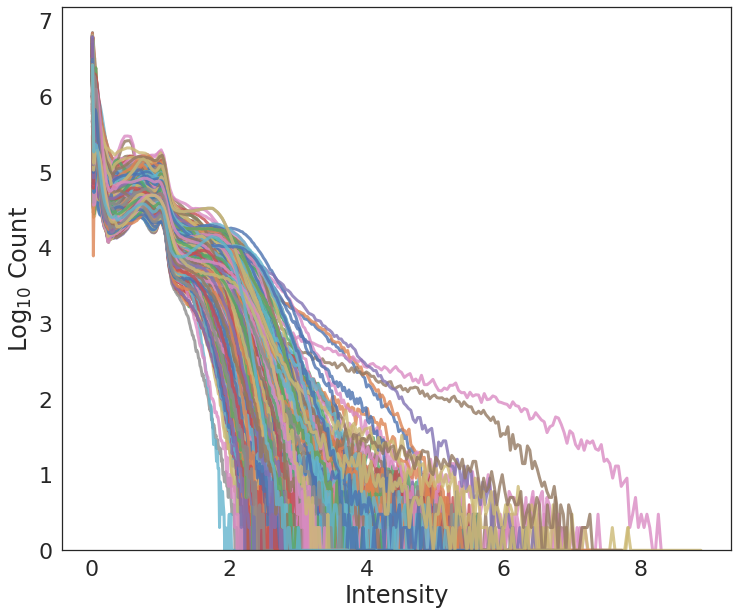

In [6]:
hist.all_hists(os.getcwd())

In [19]:
mask = None
roots_mask = None
imgs = None
roots_img = None
for i, (roots, dirs, files) in enumerate(os.walk(img_brain)):
    if 'masks' in roots:
        if len(files)!=0:
            name = ('_'.join(files[0].split('.')[0].split('_')[:-2]))
            #print(name)
            mask = files[0]
            roots_mask = roots
            
            for i, (roots_out, dirs_out, files_out) in enumerate(os.walk('/media/fabio/Disco locale/Scaricati/ADNI_preprocessed_with_skull/')):
                for file_out in files_out:
                    
                    if name in file_out:
                        imgs = file_out
                        print(imgs)
                        roots_img = roots_out
                        MRI_Real = sitk.ReadImage(roots_img + '/'+ imgs)
                        mask_brain = sitk.ReadImage(roots_mask + '/' + mask)
                        mask_brain = sitk.Cast(mask_brain, sitk.sitkInt8)
                        masked = sitk.MaskImageFilter()
                        mask = masked.Execute(MRI_Real, mask_brain)
                        sitk.WriteImage(mask, '/media/fabio/Disco locale/Scaricati/output_ADNI/'+ imgs)
        print()
                    

ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108.nii.gz

ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz

ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319115331858_S13893_I45117.nii.gz

ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114742166_S13893_I118673.nii.gz

ADNI_002_S_0559_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070216234409231_S14875_I40674.nii.gz

ADNI_002_S_0559_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115028407_S14875_I118676.nii.gz

ADNI_002_S_0619_MR_MPR-R__GradWarp__N3__Scaled_Br_20070411125458928_S15145_I48617.nii.gz

ADNI_002_S_0619_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081001115218896_S15145_I118678.nii.gz

ADNI_002_S_0685_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070216235850690_S16309_I40683.nii.gz

ADNI_002_S_0685_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115434324_S163


ADNI_073_S_1357_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731113305761_S29544_I63135.nii.gz

ADNI_022_S_1366_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070812135649006_S29196_I67165.nii.gz

ADNI_022_S_1394_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070816140829464_S34317_I68082.nii.gz

ADNI_023_S_0030_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061204155608167_S9441_I31631.nii.gz

ADNI_023_S_0030_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001130228972_S9441_I118750.nii.gz

ADNI_023_S_0031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070821182618561_S9785_I69612.nii.gz

ADNI_023_S_0031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001151656758_S9785_I118843.nii.gz

ADNI_023_S_0042_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061130173634563_S8852_I31084.nii.gz

ADNI_023_S_0042_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001152151617_S8852_I118850.nii.gz

ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_


ADNI_033_S_0725_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121348635_S17092_I119130.nii.gz

ADNI_033_S_0733_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303133222445_S16932_I42425.nii.gz

ADNI_033_S_0733_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121546031_S16932_I119132.nii.gz

ADNI_033_S_0734_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303134608580_S16942_I42434.nii.gz

ADNI_033_S_0734_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121738846_S16942_I119134.nii.gz

ADNI_033_S_0739_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070304110859078_S16956_I42441.nii.gz

ADNI_033_S_0739_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121834902_S16956_I119135.nii.gz

ADNI_033_S_0741_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070304112300306_S17006_I42450.nii.gz

ADNI_033_S_0741_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121931589_S17006_I119136.nii.gz

ADNI_033_S_0889_MR_MPR-R__GradWarp__B1_Correction__N3__Sc


ADNI_014_S_0519_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213000538637_S14488_I39647.nii.gz

ADNI_014_S_0520_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213002755949_S14473_I39660.nii.gz

ADNI_014_S_0548_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213003619175_S14921_I39665.nii.gz

ADNI_014_S_0557_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213005125862_S15094_I39674.nii.gz

ADNI_014_S_0558_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213010603779_S15789_I39683.nii.gz

ADNI_128_S_0770_MR_MPR__GradWarp__N3__Scaled_Br_20070828145118743_S17428_I70859.nii.gz

ADNI_128_S_0770_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007101205313_S17428_I119407.nii.gz

ADNI_128_S_0863_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080318145032239_S19272_I98875.nii.gz

ADNI_128_S_0863_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101325128_S19272_I119408.nii.gz

ADNI_128_S_0947_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070819182244177_S19859_I69073


ADNI_007_S_1222_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070713120847216_S25402_I60003.nii.gz

ADNI_007_S_1248_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070713113209876_S25568_I59950.nii.gz

ADNI_007_S_1304_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070713111105724_S26475_I59910.nii.gz

ADNI_007_S_1339_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070607134807952_S27414_I56319.nii.gz

ADNI_009_S_0751_MR_MPR__GradWarp__N3__Scaled_Br_20080408151939286_S17487_I101528.nii.gz

ADNI_009_S_0842_MR_MPR__GradWarp__N3__Scaled_Br_20080206154637186_S18870_I89575.nii.gz

ADNI_009_S_0862_MR_MPR__GradWarp__N3__Scaled_Br_20081016092132040_S19358_I121228.nii.gz

ADNI_009_S_1030_MR_MPR__GradWarp__N3__Scaled_Br_20070517121250972_S21823_I54651.nii.gz

ADNI_009_S_1199_MR_MPR-R__GradWarp__N3__Scaled_Br_20070501175234132_S25147_I52836.nii.gz

ADNI_009_S_1334_MR_MPR-R__GradWarp__N3__Scaled_Br_20070717182244238_S27423_I60434.nii.gz

ADNI_009_S_1354_MR_MPR__GradWarp__N3__Scaled_Br_2


ADNI_029_S_0824_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080308130111462_S18139_I96284.nii.gz

ADNI_029_S_0836_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806122937449_S18151_I65013.nii.gz

ADNI_029_S_0843_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070810175504250_S18909_I66997.nii.gz

ADNI_029_S_0845_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070805141431549_S18829_I64867.nii.gz

ADNI_029_S_0866_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807154846672_S18917_I65611.nii.gz

ADNI_029_S_0871_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070718145134172_S24246_I60719.nii.gz

ADNI_029_S_0878_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070805142357853_S18986_I64876.nii.gz

ADNI_029_S_0914_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20081101211348245_S24287_I124879.nii.gz

ADNI_029_S_0999_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070805144703422_S23248_I64898.nii.gz

ADNI_029_S_1038_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_2007


ADNI_018_S_0155_MR_MPR____N3__Scaled_2_Br_20081001135448954_S11767_I118789.nii.gz

ADNI_018_S_0286_MR_MPR____N3__Scaled_Br_20070120013124801_S12435_I37007.nii.gz

ADNI_018_S_0286_MR_MPR____N3__Scaled_2_Br_20081001135113951_S12435_I118779.nii.gz

ADNI_018_S_0335_MR_MPR____N3__Scaled_Br_20070101214204431_S14586_I35009.nii.gz

ADNI_018_S_0335_MR_MPR____N3__Scaled_2_Br_20081008153133922_S14586_I119801.nii.gz

ADNI_018_S_0369_MR_MPR____N3__Scaled_Br_20070123185416090_S12613_I37194.nii.gz

ADNI_018_S_0369_MR_MPR____N3__Scaled_2_Br_20081001133823173_S12613_I118772.nii.gz

ADNI_018_S_0406_MR_MPR____N3__Scaled_Br_20070123190542509_S13623_I37199.nii.gz

ADNI_018_S_0406_MR_MPR____N3__Scaled_2_Br_20081001133501175_S13623_I118769.nii.gz

ADNI_018_S_0425_MR_MPR____N3__Scaled_Br_20070731165720140_S13585_I63383.nii.gz

ADNI_018_S_0425_MR_MPR____N3__Scaled_2_Br_20081001133125082_S13585_I118766.nii.gz

ADNI_018_S_0450_MR_MPR-R____N3__Scaled_Br_20070123192028100_S13994_I37206.nii.gz

ADNI_018_S_0450_MR_


ADNI_067_S_0177_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160429621_S12187_I119196.nii.gz

ADNI_067_S_0243_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229180224922_S12030_I34819.nii.gz

ADNI_067_S_0243_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160507423_S12030_I119197.nii.gz

ADNI_067_S_0257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229180908303_S14730_I34824.nii.gz

ADNI_067_S_0257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160545770_S14730_I119198.nii.gz

ADNI_067_S_0284_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229182633894_S12439_I34837.nii.gz

ADNI_067_S_0284_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160624047_S12439_I119199.nii.gz

ADNI_067_S_0290_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229183851729_S12592_I34846.nii.gz

ADNI_067_S_0290_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160702385_S12592_I119200.nii.gz

ADNI_067_S_0336_MR_MPR__GradWarp__B1_Correcti


ADNI_136_S_0194_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133147404_S13178_I119717.nii.gz

ADNI_136_S_0195_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215232522388_S12523_I40452.nii.gz

ADNI_136_S_0195_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133424993_S12523_I119720.nii.gz

ADNI_136_S_0196_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215190453184_S13253_I40260.nii.gz

ADNI_136_S_0196_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133754567_S13253_I119724.nii.gz

ADNI_136_S_0299_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215202408595_S13839_I40312.nii.gz

ADNI_136_S_0299_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133944436_S13839_I119726.nii.gz

ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215205110923_S14136_I40328.nii.gz

ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134134874_S14136_I119728.nii.gz

ADNI_082_S_0363_MR_MPR__GradWarp__B1_Correction__N3__Sc


ADNI_141_S_0810_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328093111188_S20274_I47314.nii.gz

ADNI_141_S_0851_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403112721109_S19364_I47870.nii.gz

ADNI_141_S_0852_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070402180938591_S19395_I47744.nii.gz

ADNI_141_S_0853_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080702153618963_S18348_I112292.nii.gz

ADNI_141_S_0915_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070411121151917_S22748_I48563.nii.gz

ADNI_141_S_0982_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402171730196_S22644_I47703.nii.gz

ADNI_141_S_1004_MR_MPR__GradWarp__N3__Scaled_Br_20080307111813769_S23305_I95705.nii.gz

ADNI_141_S_1024_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402181417383_S22699_I47748.nii.gz

ADNI_141_S_1051_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070402173345189_S24535_I47716.nii.gz

ADNI_141_S_1052_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402174139992


ADNI_012_S_1009_MR_MPR____N3__Scaled_2_Br_20081001123612966_S21610_I118717.nii.gz

ADNI_012_S_1033_MR_MPR____N3__Scaled_Br_20070711170547643_S22635_I59219.nii.gz

ADNI_012_S_1033_MR_MPR____N3__Scaled_2_Br_20081001123718428_S22635_I118718.nii.gz

ADNI_012_S_1133_MR_MPR____N3__Scaled_Br_20070711170922052_S25016_I59224.nii.gz

ADNI_012_S_1133_MR_MPR____N3__Scaled_2_Br_20081001125131282_S25016_I118741.nii.gz

ADNI_012_S_1165_MR_MPR____N3__Scaled_Br_20070711171305055_S24576_I59229.nii.gz

ADNI_012_S_1165_MR_MPR____N3__Scaled_2_Br_20081001123930839_S24576_I118729.nii.gz

ADNI_012_S_1175_MR_MPR____N3__Scaled_Br_20070711171524570_S24756_I59232.nii.gz

ADNI_012_S_1175_MR_MPR____N3__Scaled_2_Br_20081001124304235_S24756_I118738.nii.gz

ADNI_012_S_1212_MR_MPR____N3__Scaled_Br_20070711171900690_S25005_I59237.nii.gz

ADNI_012_S_1212_MR_MPR____N3__Scaled_2_Br_20081001125242417_S25005_I118742.nii.gz

ADNI_121_S_1322_MR_MPR____N3__Scaled_Br_20070808203731870_S27376_I66185.nii.gz

ADNI_121_S_1322_MR_MP


ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_Br_20070819143554114_S11578_I68813.nii.gz

ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007093745015_S11578_I119373.nii.gz

ADNI_128_S_0216_MR_MPR-R__GradWarp__N3__Scaled_Br_20070819145230264_S11633_I68835.nii.gz

ADNI_128_S_0216_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007093942800_S11633_I119375.nii.gz

ADNI_128_S_0225_MR_MPR__GradWarp__N3__Scaled_Br_20070819145938189_S11679_I68842.nii.gz

ADNI_128_S_0225_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094139944_S11679_I119377.nii.gz

ADNI_128_S_0227_MR_MPR__GradWarp__N3__Scaled_Br_20070819122013052_S12277_I68711.nii.gz

ADNI_128_S_0227_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094336737_S12277_I119379.nii.gz

ADNI_128_S_0229_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094536153_S12481_I119381.nii.gz

ADNI_128_S_0230_MR_MPR__GradWarp__N3__Scaled_Br_20070819125014828_S12081_I68745.nii.gz

ADNI_128_S_0230_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094734444_S12081_I119383.nii.gz

ADNI_


ADNI_021_S_0984_MR_MPR__GradWarp__N3__Scaled_Br_20061217135011341_S20680_I33476.nii.gz

ADNI_021_S_1109_MR_MPR__GradWarp__N3__Scaled_Br_20070727185946236_S23446_I62695.nii.gz

ADNI_022_S_0004_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070804134614900_S9234_I64631.nii.gz

ADNI_022_S_0007_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712142439074_S9024_I59366.nii.gz

ADNI_022_S_0014_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712143051450_S9271_I59375.nii.gz

ADNI_022_S_0044_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712144317984_S8814_I59398.nii.gz

ADNI_022_S_0066_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712150156508_S10271_I59446.nii.gz

ADNI_022_S_0096_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712150800206_S11006_I59456.nii.gz

ADNI_022_S_0129_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712152611314_S11485_I59484.nii.gz

ADNI_022_S_0130_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154033261_S11089_I59524.nii.gz

A

In [21]:
os.chdir('/media/fabio/Disco locale/Scaricati/output_ADNI/')

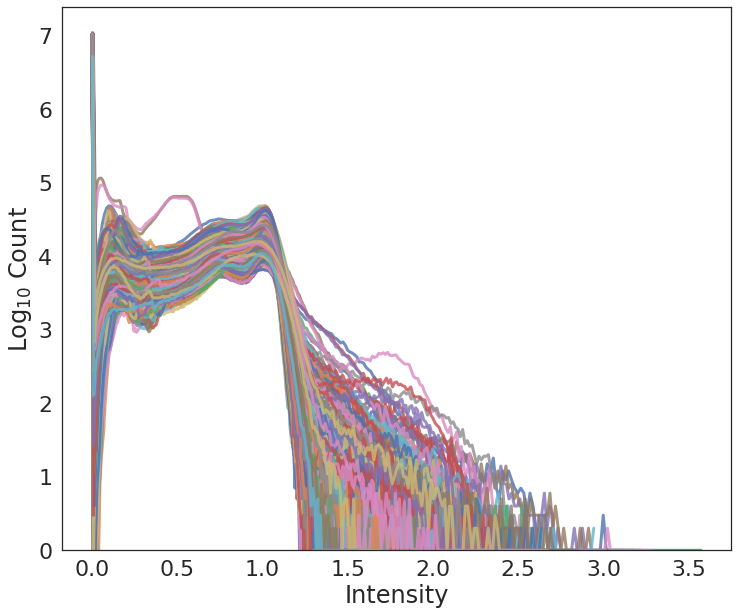

In [22]:
hist.all_hists(os.getcwd())

In [10]:
for i, (roots, dirs, files) in enumerate(os.walk('/media/fabio/Disco locale/Scaricati/output_ADNI/')):
    for file in files:
        if '.nii' in file:
            name = (file)
            print(name)
            img = nilearn.image.crop_img(roots + '/' + name)
            img.to_filename('/media/fabio/Disco locale/Scaricati/output_ADNI_crop/' + file)
            
        

ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155813843_S10468_I119190.nii.gz
ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz
ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108.nii.gz
ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114742166_S13893_I118673.nii.gz
ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319115331858_S13893_I45117.nii.gz
ADNI_002_S_0685_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070216235850690_S16309_I40683.nii.gz
ADNI_002_S_0729_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115616920_S16874_I118682.nii.gz
ADNI_002_S_0729_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217001935821_S16874_I40708.nii.gz
ADNI_002_S_0782_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114355178_S17835_I118669.nii.gz
ADNI_002_S_0782_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_2007

ADNI_023_S_0613_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203125535760_S15743_I31473.nii.gz
ADNI_023_S_0625_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002114102603_S15820_I119028.nii.gz
ADNI_023_S_0625_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061203133040963_S15820_I31495.nii.gz
ADNI_073_S_0909_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105609648_S19716_I119235.nii.gz
ADNI_073_S_0909_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070927080608817_S19716_I75485.nii.gz
ADNI_073_S_1357_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731113305761_S29544_I63135.nii.gz
ADNI_082_S_0304_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113122746_S12557_I119236.nii.gz
ADNI_082_S_0304_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080307103810562_S12557_I95653.nii.gz
ADNI_082_S_0363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113253068_S13017_I119238.nii.gz
ADNI_114_S_0410_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br

ADNI_013_S_0575_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070426091507319_S17859_I51160.nii.gz
ADNI_013_S_0592_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071028192251104_S18419_I79144.nii.gz
ADNI_013_S_0699_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727182856171_S18366_I62650.nii.gz
ADNI_013_S_0860_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426173344229_S19237_I51533.nii.gz
ADNI_013_S_0996_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426092308209_S22240_I51183.nii.gz
ADNI_013_S_1120_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426171701271_S22815_I51494.nii.gz
ADNI_013_S_1161_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426171211057_S24399_I51485.nii.gz
ADNI_013_S_1186_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727183243035_S25689_I62656.nii.gz
ADNI_013_S_1205_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426173828172_S25024_I51542.nii.gz
ADNI_013_S_1275_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200707271839042

ADNI_007_S_1304_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070713111105724_S26475_I59910.nii.gz
ADNI_007_S_1339_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070607134807952_S27414_I56319.nii.gz
ADNI_094_S_1330_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731123920643_S27038_I63206.nii.gz
ADNI_094_S_1397_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080307104443256_S31011_I95662.nii.gz
ADNI_094_S_1398_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731125345541_S31771_I63227.nii.gz
ADNI_094_S_1402_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808191131320_S32102_I66078.nii.gz
ADNI_094_S_1417_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070918132710540_S35043_I73647.nii.gz
ADNI_098_S_0149_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080206083054086_S11021_I89429.nii.gz
ADNI_098_S_0171_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070807181732526_S11460_I65752.nii.gz
ADNI_098_S_0172_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_200708071822445

ADNI_126_S_0506_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071104124941628_S15652_I80795.nii.gz
ADNI_126_S_0708_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209195607568_S16897_I38944.nii.gz
ADNI_126_S_0891_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209210901264_S19386_I39054.nii.gz
ADNI_126_S_1340_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070412185839520_S28100_I48981.nii.gz
ADNI_127_S_0431_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061228113005257_S14595_I34443.nii.gz
ADNI_036_S_0945_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120012107705_S20971_I36999.nii.gz
ADNI_036_S_0976_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806142519390_S23852_I65091.nii.gz
ADNI_036_S_1001_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209145840163_S22691_I38661.nii.gz
ADNI_067_S_0607_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111020124287_S15894_I35938.nii.gz
ADNI_067_S_0812_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209161852014

ADNI_133_S_0727_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007155649642_S18620_I119534.nii.gz
ADNI_133_S_0727_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070809142438339_S18620_I66356.nii.gz
ADNI_133_S_0771_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008093133887_S18575_I119602.nii.gz
ADNI_133_S_0771_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080224144914253_S18575_I92286.nii.gz
ADNI_133_S_0792_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008093923385_S18306_I119610.nii.gz
ADNI_133_S_0792_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070809144234763_S18306_I66373.nii.gz
ADNI_133_S_0912_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213230551142_S19884_I40000.nii.gz
ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008095421377_S24646_I119634.nii.gz
ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801192845987_S24646_I63819.nii.gz
ADNI_133_S_1031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_

ADNI_007_S_0101_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115524983_S10679_I118681.nii.gz
ADNI_007_S_0101_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118231627932_S10679_I36726.nii.gz
ADNI_007_S_0128_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115704885_S10936_I118683.nii.gz
ADNI_007_S_0128_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118045422141_S10936_I36640.nii.gz
ADNI_007_S_0249_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120039197_S11911_I118687.nii.gz
ADNI_007_S_0293_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120327735_S12193_I118690.nii.gz
ADNI_007_S_0293_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118022549519_S12193_I36549.nii.gz
ADNI_007_S_0316_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120625745_S12583_I118693.nii.gz
ADNI_137_S_0158_MR_MPR__GradWarp__N3__Scaled_Br_20070321170559168_S11648_I45872.nii.gz
ADNI_137_S_0283_MR_MPR__GradWarp__N3__Scaled_Br_20070809154734674_S12218_I66428.

ADNI_027_S_0074_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227115631612_S10605_I34316.nii.gz
ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152008458_S11442_I119068.nii.gz
ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227121133462_S11442_I34325.nii.gz
ADNI_027_S_0118_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061222172848171_S11796_I34114.nii.gz
ADNI_027_S_0120_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152155880_S11535_I119070.nii.gz
ADNI_027_S_0120_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227122431347_S11535_I34332.nii.gz
ADNI_021_S_0141_MR_MPR__GradWarp__N3__Scaled_Br_20061217092830688_S11036_I33396.nii.gz
ADNI_021_S_0159_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217141337814_S11314_I33489.nii.gz
ADNI_021_S_0178_MR_MPR__GradWarp__N3__Scaled_Br_20061219165928291_S11567_I33799.nii.gz
ADNI_021_S_0231_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217142113223_S11835_I33493.nii.gz
ADNI_021_S_0273_MR_MPR__GradWa

ADNI_116_S_1232_MR_MPR__GradWarp__N3__Scaled_Br_20070713080145603_S25756_I59711.nii.gz
ADNI_116_S_1249_MR_MPR-R__GradWarp__N3__Scaled_Br_20070712173422187_S26084_I59647.nii.gz
ADNI_116_S_1271_MR_MPR__GradWarp__N3__Scaled_Br_20070712173906167_S26938_I59652.nii.gz
ADNI_116_S_1315_MR_MPR__GradWarp__N3__Scaled_Br_20070713080952048_S27811_I59718.nii.gz
ADNI_121_S_1322_MR_MPR____N3__Scaled_2_Br_20081006133607742_S27376_I119268.nii.gz
ADNI_121_S_1322_MR_MPR____N3__Scaled_Br_20070808203731870_S27376_I66185.nii.gz
ADNI_121_S_1350_MR_MPR____N3__Scaled_2_Br_20081006133709366_S27799_I119269.nii.gz
ADNI_121_S_1350_MR_MPR____N3__Scaled_Br_20070818144159342_S27799_I68618.nii.gz
ADNI_009_S_1199_MR_MPR-R__GradWarp__N3__Scaled_Br_20070501175234132_S25147_I52836.nii.gz
ADNI_009_S_1334_MR_MPR-R__GradWarp__N3__Scaled_Br_20070717182244238_S27423_I60434.nii.gz
ADNI_009_S_1354_MR_MPR__GradWarp__N3__Scaled_Br_20070717183309825_S27634_I60443.nii.gz
ADNI_010_S_0067_MR_MPR____N3__Scaled_2_Br_20081001114835460_S10

ADNI_012_S_1165_MR_MPR____N3__Scaled_Br_20070711171305055_S24576_I59229.nii.gz
ADNI_012_S_1175_MR_MPR____N3__Scaled_2_Br_20081001124304235_S24756_I118738.nii.gz
ADNI_123_S_0050_MR_MPR____N3__Scaled_Br_20070802214257605_S10053_I64390.nii.gz
ADNI_123_S_0072_MR_MPR____N3__Scaled_2_Br_20081006154119906_S10776_I119274.nii.gz
ADNI_123_S_0072_MR_MPR____N3__Scaled_Br_20070802214830990_S10776_I64395.nii.gz
ADNI_123_S_0088_MR_MPR____N3__Scaled_2_Br_20081006154519230_S10795_I119277.nii.gz
ADNI_123_S_0088_MR_MPR____N3__Scaled_Br_20070802215356737_S10795_I64400.nii.gz
ADNI_123_S_0091_MR_MPR____N3__Scaled_2_Br_20081006154759158_S10708_I119288.nii.gz
ADNI_123_S_0091_MR_MPR____N3__Scaled_Br_20070802215937761_S10708_I64405.nii.gz
ADNI_123_S_0094_MR_MPR____N3__Scaled_Br_20070802220504756_S10712_I64410.nii.gz
ADNI_123_S_0106_MR_MPR____N3__Scaled_2_Br_20081006155611727_S11010_I119307.nii.gz
ADNI_123_S_0106_MR_MPR____N3__Scaled_Br_20070807114033316_S11010_I65478.nii.gz
ADNI_123_S_0108_MR_MPR-R____N3__Scale

ADNI_067_S_1253_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070522143031075_S27558_I55033.nii.gz
ADNI_068_S_0109_MR_MPR____N3__Scaled_2_Br_20081212141712788_S10772_I130231.nii.gz
ADNI_067_S_0110_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070111015401104_S11177_I35933.nii.gz
ADNI_067_S_0257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160545770_S14730_I119198.nii.gz
ADNI_067_S_0607_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160916946_S15894_I119203.nii.gz
ADNI_068_S_0109_MR_MPR____N3__Scaled_Br_20070731181048264_S10772_I63454.nii.gz
ADNI_068_S_0476_MR_MPR____N3__Scaled_2_Br_20081212151202583_S14509_I130246.nii.gz
ADNI_068_S_1191_MR_MPR____N3__Scaled_2_Br_20081212154000095_S25451_I130251.nii.gz
ADNI_073_S_0089_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105102890_S11161_I119227.nii.gz
ADNI_067_S_0290_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160702385_S12592_I119200.nii.gz
ADNI_067_S_0290_MR_MPR-R__GradWarp__B1_Corr

ADNI_021_S_0337_MR_MPR__GradWarp__N3__Scaled_Br_20061217123842517_S12485_I33437.nii.gz
ADNI_021_S_1109_MR_MPR__GradWarp__N3__Scaled_Br_20070727185946236_S23446_I62695.nii.gz
ADNI_022_S_0129_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712152611314_S11485_I59484.nii.gz
ADNI_022_S_0961_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070712161422506_S20711_I59601.nii.gz
ADNI_022_S_1394_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070816140829464_S34317_I68082.nii.gz
ADNI_023_S_0031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070821182618561_S9785_I69612.nii.gz
ADNI_073_S_0386_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070419144406195_S13746_I49680.nii.gz
ADNI_098_S_0896_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070605153525348_S19439_I56031.nii.gz
ADNI_114_S_1106_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070420164415238_S22859_I49910.nii.gz
ADNI_127_S_1140_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731210348025_S24278_I63637.nii.gz
ADNI_12

ADNI_100_S_1062_MR_MPR____N3__Scaled_Br_20070727124503685_S22492_I62353.nii.gz
ADNI_100_S_1113_MR_MPR____N3__Scaled_Br_20070808195422552_S24092_I66134.nii.gz
ADNI_100_S_1154_MR_MPR____N3__Scaled_Br_20070808200159850_S24471_I66141.nii.gz
ADNI_100_S_1286_MR_MPR____N3__Scaled_Br_20070808200522693_S27102_I66144.nii.gz
ADNI_109_S_0777_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006130855054_S18676_I119258.nii.gz
ADNI_109_S_0777_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071119085753928_S18676_I82576.nii.gz
ADNI_032_S_1101_MR_MPR____N3__Scaled_Br_20070731180142730_S22783_I63442.nii.gz
ADNI_032_S_1169_MR_MPR-R____N3__Scaled_2_Br_20081003104756214_S24442_I119118.nii.gz
ADNI_032_S_1169_MR_MPR-R____N3__Scaled_Br_20070806134402523_S24442_I65052.nii.gz
ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120513744_S15101_I119121.nii.gz
ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302151219556_S15101_I42240.nii.gz
ADNI_033_S_0513_MR_MPR__Gr

In [11]:
fixed_image = '/media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz'
trasformation = 'affine'
for i, (roots, dirs, files) in enumerate(os.walk('/media/fabio/Disco locale/Scaricati/output_ADNI_crop/')):
    for file in files:
        name = ((file.split('.')[0]))
        print(name)
        
        my_txt = os.path.join(roots + '/' + name +'.txt')
        txt = open(my_txt, "w")
        txt.write("[GLOBAL] \n\nfixed = " + fixed_image +"\nmoving = " + roots + '/' + file + "\nimg_out = /media/fabio/Disco locale/Scaricati/ADNI_registrate/" + str(file)+
                    "\n\n[STAGE] \n\nxform=" + trasformation +  "\noptim=versor \nmax_its=30 \nres=4 4 2")
        txt.close()
        command = ['plastimatch', 'register' ,  my_txt]
        registration = subprocess.Popen(command, stdout=subprocess.PIPE)
        output, errors = registration.communicate()
        print ([registration.returncode, errors, output])
    

ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671
[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114742166_S13893_I118673.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 57\nOrigin = -64.4303 -104.433 79.9831\nSpacing = 3.79119 3.75 2.40447\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0413_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319115331858_S13893_I45117.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -64.4304 -104.072 80.931\nSpacing = 3.79119 3.777 2.40447\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0559_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115028407_S14875_I118676.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 60\nOrigin = -69.2331 -116.22 82.0798\nSpacing = 3.79239 3.75 2.40497\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0559_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070216234409231_S14875_I40674.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 60\nOrigin = -69.2332 -115.884 82.0799\nSpacing = 3.79239 3.77664 2.40497\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0619_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081001115218896_S15145_I118678.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 60\nOrigin = -69.859 -87.5617 77.5401\nSpacing = 4.09623 4.06248 2.4074\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0619_MR_MPR-R__GradWarp__N3__Scaled_Br_20070411125458928_S15145_I48617.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 61\nOrigin = -69.8591 -87.0825 77.5402\nSpacing = 4.09623 4.09581 2.4074\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0685_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115434324_S16309_I118680.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 57\nOrigin = -65.8938 -108.953 94.2284\nSpacing = 3.79097 3.75 2.40467\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.000261651 1 0.000261636\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0685_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070216235850690_S16309_I40683.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 57\nOrigin = -67.0962 -108.64 94.2285\nSpacing = 3.79097 3.77485 2.40467\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0729_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115616920_S16874_I118682.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 42 54\nOrigin = -59.4684 -86.842 99.2804\nSpacing = 3.79028 3.75 2.40418\nDirection Cosines =\n -3.42285e-08 0.00026165 1\n -0.000261636 1 -0.00026165\n -1 -0.000261636 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0782_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114355178_S17835_I118669.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 50 56\nOrigin = -66.3773 -116.575 88.7577\nSpacing = 3.79079 3.75 2.40435\nDirection Cosines =\n -3.42285e-08 0.00026165 1\n -0.000261636 1 -0.00026165\n -1 -0.000261636 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0782_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217003515950_S17835_I40717.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 50 56\nOrigin = -66.4004 -116.25 88.7809\nSpacing = 3.79079 3.77433 2.40435\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0816_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002102135862_S18402_I118984.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 59\nOrigin = -65.6781 -112.766 79.3154\nSpacing = 3.79087 3.75 2.40398\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.000261651 1 0.000261636\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0816_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217005829488_S18402_I40731.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 59\nOrigin = -65.6785 -111.519 78.368\nSpacing = 3.79087 3.77311 2.40398\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0938_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115856421_S19852_I118685.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 58\nOrigin = -66.3389 -95.8222 66.4282\nSpacing = 3.79087 3.75 2.40423\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.000261651 1 0.000261636\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0954_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120143792_S19979_I118688.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 43 52\nOrigin = -67.9378 -98.7881 68.8999\nSpacing = 3.79017 3.75 2.40426\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0955_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120235839_S20004_I118689.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 56\nOrigin = -65.7021 -99.8424 66.0489\nSpacing = 3.7913 3.75 2.40431\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0955_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217013411002_S20004_I40754.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 56\nOrigin = -65.7025 -98.5582 66.0492\nSpacing = 3.7913 3.77371 2.40431\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_1018_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217030439623_S23128_I40817.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 56\nOrigin = -66.3151 -102.787 107.013\nSpacing = 3.78877 3.78519 2.40582\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_1070_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217032644901_S23120_I40831.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 59\nOrigin = -67.2381 -110.084 118.64\nSpacing = 3.79315 3.78482 2.40536\nDirection Cosines =\n -3.42285e-08 0.00026164 1\n -0.000261646 1 -0.00026164\n -1 -0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_1155_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217034919863_S24144_I40845.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 57\nOrigin = -65.4941 -107.262 75.2387\nSpacing = 3.7926 3.7849 2.40505\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_1261_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727130404463_S26574_I62377.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 58\nOrigin = -66.8265 -102.455 109.197\nSpacing = 3.79211 3.78428 2.4052\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_1280_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070713123810416_S26453_I60056.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 55\nOrigin = -63.9229 -104.109 60.9585\nSpacing = 3.79397 3.78489 2.4051\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_0907_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501171753634_S19728_I52781.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 56\nOrigin = -71.0276 -72.211 87.9986\nSpacing = 5.01775 4.98426 2.39704\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_0908_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727175013471_S32516_I62589.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 59\nOrigin = -72.4243 -78.3152 78.6783\nSpacing = 5.01763 4.9843 2.39777\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_0931_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070503165327269_S20051_I53390.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 33 58\nOrigin = -68.3583 -74.9076 62.4872\nSpacing = 5.01934 4.98524 2.39754\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_0981_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070501171453195_S20753_I52776.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 29 57\nOrigin = -65.1268 -85.6272 74.6622\nSpacing = 5.01938 4.98524 2.39758\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_1021_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070918111516027_S21771_I73506.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 31 55\nOrigin = -68.9961 -77.0115 51.6602\nSpacing = 5.01765 4.9845 2.39719\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0729_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217001935821_S16874_I40708.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 42 54\nOrigin = -59.4945 -86.4795 100.254\nSpacing = 3.79028 3.77446 2.40418\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_0954_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070217011938920_S19979_I40744.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 43 52\nOrigin = -67.9379 -98.4133 68.9\nSpacing = 3.79017 3.77361 2.40426\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_002_S_1268_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802165115484_S26498_I64037.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 49 58\nOrigin = -68.0888 -120.167 71.7133\nSpacing = 3.79291 3.7851 2.4055\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_1057_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501174016338_S23345_I52821.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 55\nOrigin = -72.0622 -73.5369 76.7147\nSpacing = 5.01708 4.98665 2.39763\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0223_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212164022848_S11981_I32855.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 55\nOrigin = -64.3043 -98.1604 100.905\nSpacing = 3.78185 3.74044 2.41276\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0610_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212102204007_S15727_I32667.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 58\nOrigin = -67.3854 -104.67 74.616\nSpacing = 3.78078 3.72079 2.41163\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_1059_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070501173720913_S22300_I52816.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 62\nOrigin = -69.0804 -76.2536 71.9803\nSpacing = 5.0158 4.9864 2.3983\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_1074_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070503165612980_S23536_I53395.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 59\nOrigin = -72.2685 -63.1382 60.688\nSpacing = 5.01615 4.98609 2.39783\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_1122_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501172757639_S23542_I52799.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 31 55\nOrigin = -64.7541 -66.4074 54.2432\nSpacing = 5.01685 4.98663 2.39836\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_003_S_1257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070501172255698_S27340_I52790.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 60\nOrigin = -71.9453 -81.4665 91.7269\nSpacing = 5.02358 4.98591 2.3937\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0221_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070910164745994_S11958_I72128.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 58\nOrigin = -65.7874 -115.084 108.528\nSpacing = 3.78463 3.74221 2.4134\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0222_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517132037539_S11754_I54686.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 55\nOrigin = -59.9405 -109.836 86.2817\nSpacing = 3.78479 3.74133 2.41303\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0324_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061212171617702_S12599_I32891.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 55\nOrigin = -61.2312 -91.0537 59.4886\nSpacing = 3.78014 3.73985 2.41187\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0448_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212165540546_S14032_I32875.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 59\nOrigin = -64.6566 -100.298 70.6697\nSpacing = 3.77833 3.72227 2.41215\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0553_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212094622066_S15527_I32644.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 48 55\nOrigin = -63.7089 -111.595 64.041\nSpacing = 3.77564 3.72147 2.41139\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0572_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212100241670_S15709_I32653.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 57\nOrigin = -68.233 -102.054 43.2003\nSpacing = 3.77991 3.72215 2.41181\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261649 1 0.000261638\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0602_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061212103139908_S15966_I32672.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 48 60\nOrigin = -67.6737 -110.75 68.2467\nSpacing = 3.78213 3.72019 2.41139\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0312_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105300035_S15079_I119230.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 37 56\nOrigin = -68.7421 -103.112 99.9769\nSpacing = 4.98891 5 2.40534\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0312_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213204740079_S15079_I39881.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 36 57\nOrigin = -68.7421 -102.957 99.9769\nSpacing = 4.98891 5.02104 2.40534\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0386_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105337889_S13746_I119231.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 58\nOrigin = -69.6447 -94.0411 75.6394\nSpacing = 4.98741 5 2.4049\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0386_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070419144406195_S13746_I49680.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 58\nOrigin = -69.6448 -93.8695 75.6395\nSpacing = 4.98741 5.02049 2.4049\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0445_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105413467_S15683_I119232.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 37 62\nOrigin = -81.3906 -112.497 97.5735\nSpacing = 4.98752 5 2.40438\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0445_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213210245559_S15683_I39899.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 37 62\nOrigin = -81.3906 -112.352 97.5735\nSpacing = 4.98752 5.02029 2.40438\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0518_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105453633_S18797_I119233.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 56\nOrigin = -66.1716 -98.6339 57.3812\nSpacing = 4.98652 5 2.4045\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0061_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002133811269_S10312_I119062.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 23 37 55\nOrigin = -68.1322 -92.49 75.2861\nSpacing = 5.01665 5 2.38515\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0061_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061130181357306_S10312_I31102.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 36 55\nOrigin = -68.1322 -92.5855 76.5402\nSpacing = 5.01665 4.98663 2.38515\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0078_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001153036948_S10619_I118861.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 59\nOrigin = -66.0999 -100.689 75.9454\nSpacing = 5.0187 5 2.38515\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0078_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070427190117586_S10619_I51999.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 59\nOrigin = -66.0998 -100.824 75.9454\nSpacing = 5.0187 4.98478 2.38515\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0081_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001153645430_S10813_I118869.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 57\nOrigin = -73.053 -90.6432 63.4164\nSpacing = 5.01765 5 2.38472\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0081_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061130190355722_S10813_I31125.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 56\nOrigin = -71.8606 -90.8112 63.4164\nSpacing = 5.01765 4.98639 2.38472\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0083_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001153941224_S10568_I118874.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 55\nOrigin = -67.2691 -93.8011 64.1012\nSpacing = 5.01777 5 2.38513\nDirection Cosines =\n -3.42285e-08 0.000261641 1\n -0.000261645 1 -0.000261641\n -1 -0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0084_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002100834283_S10764_I118970.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 56\nOrigin = -68.9835 -86.9838 81.9363\nSpacing = 5.0163 5 2.38466\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0084_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061201102044695_S10764_I31205.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 55\nOrigin = -68.9834 -87.1476 81.9363\nSpacing = 5.0163 4.98383 2.38466\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0093_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002100757991_S10736_I118969.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 57\nOrigin = -71.7165 -83.4026 62.1889\nSpacing = 5.01869 5 2.38517\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0093_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061201134712282_S10736_I31251.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 57\nOrigin = -71.7168 -82.3464 62.1892\nSpacing = 5.01869 4.98523 2.38517\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0126_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002101037533_S11525_I118973.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 56\nOrigin = -70.3747 -98.3413 88.5048\nSpacing = 5.02957 5 2.38274\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0126_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061201141412569_S11525_I31271.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 56\nOrigin = -69.1833 -98.4175 88.5048\nSpacing = 5.02957 4.99058 2.38274\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0139_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002100910505_S11079_I118971.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 57\nOrigin = -66.1185 -91.7259 74.8797\nSpacing = 5.02901 5 2.38333\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0217_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002101115159_S11731_I118974.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 57\nOrigin = -69.1798 -93.0427 65.9548\nSpacing = 5.02921 5 2.38352\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0331_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002101152597_S12428_I118975.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 58\nOrigin = -69.6958 -67.0648 57.5468\nSpacing = 5.02926 5 2.38323\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0331_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061201162554355_S12428_I31369.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 58\nOrigin = -69.6958 -67.183 57.5468\nSpacing = 5.02926 4.98938 2.38323\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0376_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002101229250_S12652_I118976.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 33 59\nOrigin = -68.5012 -97.4078 71.8596\nSpacing = 5.02879 5 2.38328\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0376_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061201164531518_S12652_I31384.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 33 59\nOrigin = -68.5012 -97.4919 70.6024\nSpacing = 5.02879 4.99075 2.38328\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0388_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001152419019_S13076_I118853.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 59\nOrigin = -73.0838 -104.039 69.9214\nSpacing = 5.0293 5 2.38332\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0388_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203115439863_S13076_I31437.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 59\nOrigin = -73.0837 -104.154 69.9214\nSpacing = 5.0293 4.98897 2.38332\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0604_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203122926229_S15182_I31455.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 62\nOrigin = -69.464 -99.218 79.0625\nSpacing = 5.02865 4.98872 2.38258\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0613_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002114026105_S15743_I119027.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 57\nOrigin = -71.3727 -89.2673 55.0715\nSpacing = 5.01781 5 2.38408\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0613_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203125535760_S15743_I31473.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 57\nOrigin = -71.3727 -89.3328 55.0715\nSpacing = 5.01781 4.99283 2.38408\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0625_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002114102603_S15820_I119028.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 35 62\nOrigin = -70.0308 -105.816 71.8577\nSpacing = 5.01838 5 2.38386\nDirection Cosines =\n 4.63616e-06 4.5866e-06 1\n 4.5866e-06 1 -4.58662e-06\n -1 4.58662e-06 4.63614e-06\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0625_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061203133040963_S15820_I31495.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 35 62\nOrigin = -70.0308 -105.868 71.8577\nSpacing = 5.01838 4.99354 2.38386\nDirection Cosines =\n 4.63616e-06 4.58659e-06 1\n 4.58659e-06 1 -4.58662e-06\n -1 4.58662e-06 4.63614e-06\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0855_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002102235603_S18561_I118985.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 37 55\nOrigin = -68.3264 -111.366 68.0613\nSpacing = 5.02315 5 2.38235\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0855_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203135308153_S18561_I31509.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 37 55\nOrigin = -68.3261 -112.658 68.061\nSpacing = 5.02315 4.9936 2.38235\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0887_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002102505839_S19087_I118988.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 56\nOrigin = -67.3093 -111.519 53.7733\nSpacing = 5.02357 5 2.38306\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0887_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203141838289_S19087_I31526.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 56\nOrigin = -67.3093 -111.565 53.7733\nSpacing = 5.02357 4.99186 2.38306\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0916_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203142844438_S19228_I31533.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 57\nOrigin = -70.6195 -102.919 71.827\nSpacing = 5.0225 4.99343 2.38271\nDirection Cosines =\n 1.29149e-08 0.00697777 0.999976\n 3.70169e-06 0.999976 -0.00697777\n -1 3.70169e-06 -1.29149e-08\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154652646_S19390_I118892.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 57\nOrigin = -74.2634 -90.6262 96.7197\nSpacing = 5.02279 5 2.38261\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0565_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105531714_S15762_I119234.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 56\nOrigin = -65.8989 -97.8515 73.1395\nSpacing = 4.98565 5 2.40377\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0565_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213213329963_S15762_I39919.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 56\nOrigin = -65.8989 -97.6686 73.1395\nSpacing = 4.98565 5.01951 2.40377\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0746_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731112459149_S23286_I63122.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 55\nOrigin = -73.6672 -100.407 68.0851\nSpacing = 4.98184 5.02847 2.40388\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0909_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105609648_S19716_I119235.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 59\nOrigin = -70.699 -91.8543 64.5013\nSpacing = 4.98773 5 2.4045\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_1357_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731113305761_S29544_I63135.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 62\nOrigin = -75.8337 -95.2884 54.7625\nSpacing = 4.9802 5.02653 2.40279\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0304_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113122746_S12557_I119236.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 63\nOrigin = -76.364 -86.2637 79.3535\nSpacing = 5.0075 5 2.40084\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113253068_S13017_I119238.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 58\nOrigin = -71.8463 -84.4771 85.2958\nSpacing = 5.00434 5 2.40068\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213172311370_S13017_I39730.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 58\nOrigin = -71.877 -84.6392 84.0754\nSpacing = 5.00434 4.98374 2.40068\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0469_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113331403_S15262_I119239.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 53\nOrigin = -60.1031 -78.2297 62.0856\nSpacing = 5.00479 5 2.40106\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0469_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213173533438_S15262_I39739.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 53\nOrigin = -60.1374 -77.1636 62.1199\nSpacing = 5.00479 4.98357 2.40106\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0640_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113500248_S16562_I119241.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 57\nOrigin = -69.2992 -73.9084 59.0409\nSpacing = 5.01182 5 2.39938\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0640_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070418081528475_S16562_I49479.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 58\nOrigin = -70.5355 -74.214 59.0774\nSpacing = 5.01182 4.97588 2.39938\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154900852_S19740_I118903.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 56\nOrigin = -63.5805 -94.3759 68.9078\nSpacing = 5.02425 5 2.38249\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080206081955454_S19740_I89417.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 56\nOrigin = -63.5805 -94.4363 68.9078\nSpacing = 5.02425 4.99279 2.38249\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1046_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070322174836354_S22199_I46396.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 36 59\nOrigin = -73.9228 -106.631 70.8381\nSpacing = 5.02488 4.99063 2.38372\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1104_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001155513122_S22579_I118911.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 56\nOrigin = -67.7467 -92.5811 65.6675\nSpacing = 5.02542 5 2.38414\nDirection Cosines =\n 0.00174798 -0.0086972 0.999961\n 6.93916e-06 0.999962 0.0086972\n -0.999998 -8.26367e-06 0.00174798\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1104_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070412171609661_S22579_I48851.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 56\nOrigin = -67.746 -92.6594 65.6675\nSpacing = 5.02542 4.99142 2.38414\nDirection Cosines =\n 0.00174798 -0.0086972 0.999961\n 7.02544e-06 0.999962 0.0086972\n -0.999998 -8.1774e-06 0.00174798\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0567_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121001991_S14572_I119126.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 58\nOrigin = -71.1051 -96.209 60.9905\nSpacing = 3.77026 3.75 2.40888\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0567_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070303120457162_S14572_I42370.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 59\nOrigin = -71.1051 -96.2881 60.9905\nSpacing = 3.77026 3.74545 2.40888\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0723_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121055251_S16845_I119127.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 41 58\nOrigin = -70.0345 -89.9498 49.2367\nSpacing = 3.7701 3.75 2.40855\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0723_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303122652673_S16845_I42384.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 41 58\nOrigin = -70.0345 -90.0322 49.2366\nSpacing = 3.7701 3.74564 2.40855\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0724_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121149525_S17337_I119128.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 61\nOrigin = -74.8419 -108.094 67.048\nSpacing = 3.76682 3.75 2.40917\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0724_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303125222238_S17337_I42400.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 61\nOrigin = -74.8418 -108.175 67.048\nSpacing = 3.76682 3.74436 2.40917\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261644 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0139_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061201144502375_S11079_I31300.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 57\nOrigin = -66.1185 -91.8108 74.8797\nSpacing = 5.02901 4.99161 2.38333\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0604_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001154019415_S15182_I118875.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 62\nOrigin = -69.4641 -99.1238 80.3197\nSpacing = 5.02865 5 2.38258\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061203145312272_S19390_I31547.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 57\nOrigin = -74.2634 -90.704 96.7197\nSpacing = 5.02279 4.99147 2.38261\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261644 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1126_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081124142926303_S23440_I128366.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 58\nOrigin = -71.365 -92.8759 88.142\nSpacing = 5.02544 5 2.38458\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1289_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001160534628_S26374_I118925.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 54\nOrigin = -62.3736 -95.0089 64.2119\nSpacing = 5.02196 5 2.38398\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0118_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152101562_S11796_I119069.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 54 57 80\nOrigin = -97.6605 -131.318 75.837\nSpacing = 3.91951 3.90625 2.41286\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0725_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303130703791_S17092_I42409.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 55\nOrigin = -66.2203 -109.353 78.0365\nSpacing = 3.77059 3.74654 2.40884\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0733_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121546031_S16932_I119132.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 46 54\nOrigin = -63.2432 -101.997 81.628\nSpacing = 3.76987 3.75 2.4087\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0733_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070303133222445_S16932_I42425.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 46 54\nOrigin = -63.2182 -102.096 81.603\nSpacing = 3.76987 3.74582 2.4087\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261642 1 -0.000261644\n -1 -0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0734_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121738846_S16942_I119134.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 58\nOrigin = -71.2949 -102.937 70.1424\nSpacing = 3.76987 3.75 2.4087\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0739_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121834902_S16956_I119135.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 56\nOrigin = -64.2544 -106.191 56.8116\nSpacing = 3.77118 3.75 2.40887\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0739_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070304110859078_S16956_I42441.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 57\nOrigin = -64.2543 -106.255 56.8116\nSpacing = 3.77118 3.74552 2.40887\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261645 1 0.000261642\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0741_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070304112300306_S17006_I42450.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 55\nOrigin = -67.6768 -101.51 52.0952\nSpacing = 3.77009 3.7457 2.40917\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0889_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070426183239887_S19296_I51629.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 53\nOrigin = -67.1799 -103.962 65.4841\nSpacing = 3.76856 3.77004 2.40851\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0906_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070304115044054_S19314_I42468.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 58\nOrigin = -72.4383 -92.587 75.8669\nSpacing = 3.7686 3.77003 2.40855\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0920_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070304121025723_S19288_I42481.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 60\nOrigin = -73.0039 -98.2936 69.2266\nSpacing = 3.76931 3.77003 2.40895\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0922_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070304122855389_S19341_I42493.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 55\nOrigin = -55.3576 -116.326 73.2702\nSpacing = 3.7684 3.76997 2.40838\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0923_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070304125438114_S19544_I42509.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 58\nOrigin = -70.6636 -99.4703 59.4608\nSpacing = 3.76776 3.77021 2.40847\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1016_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070306084833503_S21817_I42772.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 56\nOrigin = -70.1632 -91.9626 78.4403\nSpacing = 3.76707 3.76924 2.40822\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1098_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070306095352673_S22792_I42832.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 57\nOrigin = -71.1124 -98.0575 52.4893\nSpacing = 3.76776 3.76981 2.40824\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070306101437636_S22799_I42844.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 60\nOrigin = -78.1497 -107.791 64.1532\nSpacing = 3.76776 3.76981 2.40823\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1279_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517160450483_S26694_I54757.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 56\nOrigin = -68.7201 -104.044 72.0353\nSpacing = 3.76592 3.76841 2.40682\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1281_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070517161803030_S26136_I54780.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 57\nOrigin = -68.8607 -93.9204 52.8609\nSpacing = 3.76438 3.76785 2.40611\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1283_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517162231894_S26144_I54785.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 56\nOrigin = -68.728 -103.688 55.3153\nSpacing = 3.76438 3.76785 2.40611\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1284_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517163057545_S26686_I54799.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 57\nOrigin = -69.5663 -104.697 50.4355\nSpacing = 3.76592 3.76841 2.40682\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1285_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426175923899_S26128_I51588.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 57\nOrigin = -69.9174 -107.337 104.795\nSpacing = 3.76594 3.76854 2.40691\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1309_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426181345627_S26195_I51605.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 56\nOrigin = -64.9142 -102.975 81.2694\nSpacing = 3.76467 3.76826 2.40672\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0033_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319170758998_S10396_I45166.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 60\nOrigin = -73.3995 -107.271 73.987\nSpacing = 4.98073 4.98455 2.40586\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0048_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319171821233_S10257_I45183.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 59\nOrigin = -69.7889 -101.952 78.2909\nSpacing = 4.98063 4.98519 2.40606\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0156_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212214638392_S11391_I39533.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 59\nOrigin = -68.291 -87.7777 119.456\nSpacing = 4.97994 4.9778 2.40522\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0204_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212215946185_S11661_I39542.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 57\nOrigin = -66.0568 -87.0418 111.304\nSpacing = 4.98075 4.98298 2.40373\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0292_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212221314426_S12408_I39569.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 64\nOrigin = -75.5171 -97.3121 75.9341\nSpacing = 4.98111 4.98334 2.404\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_1379_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730191813596_S28761_I63014.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 36 58\nOrigin = -63.4657 -96.8385 93.0282\nSpacing = 4.98965 5.00183 2.40298\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_0535_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424112744977_S14699_I50426.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 63\nOrigin = -70.4706 -104.838 68.5682\nSpacing = 5.17174 5.23057 2.40291\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_0578_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424114540207_S15035_I50459.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 55\nOrigin = -60.5946 -86.5321 76.1546\nSpacing = 4.96418 5.02099 2.4025\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_0690_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424115325478_S16924_I50468.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 59\nOrigin = -69.6069 -94.7452 61.0223\nSpacing = 5.17151 5.22947 2.40265\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_0730_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424120556863_S17062_I50487.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -65.3395 -91.0438 70.4787\nSpacing = 4.96486 5.02069 2.40228\nDirection Cosines =\n -3.42285e-08 0.000261651 1\n -0.000261636 1 -0.000261651\n -1 -0.000261636 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_0359_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080308122209967_S13000_I96221.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 30 56\nOrigin = -63.4597 -72.4992 30.4851\nSpacing = 5.01307 4.95235 2.40607\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_0538_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217020336501_S17545_I40772.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 33 59\nOrigin = -70.0578 -83.3568 65.2723\nSpacing = 5.01393 4.95784 2.40012\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_0590_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426172230102_S15409_I51515.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 35 57\nOrigin = -63.9998 -95.3934 46.9851\nSpacing = 5.01051 4.94694 2.40466\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_0702_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217021444111_S17341_I40781.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 37 59\nOrigin = -70.7245 -92.8431 72.488\nSpacing = 5.01517 4.95663 2.40051\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_0769_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070412172606992_S17720_I48867.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 36 61\nOrigin = -74.3297 -99.5777 80.3065\nSpacing = 5.01424 4.95675 2.40025\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_0991_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070217023139686_S21737_I40794.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 56\nOrigin = -64.6691 -72.9971 46.6972\nSpacing = 5.01093 4.94891 2.40556\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1028_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217023802197_S22058_I40799.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 34 56\nOrigin = -65.8542 -76.8008 69.5324\nSpacing = 5.01175 4.95095 2.40685\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1092_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080408123505686_S23827_I101411.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 56\nOrigin = -69.2408 -88.8755 37.3246\nSpacing = 5.01345 4.94671 2.40579\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261644 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0860_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426173344229_S19237_I51533.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 58\nOrigin = -64.1116 -140.316 75.5527\nSpacing = 4.98088 4.99938 2.40655\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0996_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426092308209_S22240_I51183.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 55\nOrigin = -60.6119 -98.3923 54.6454\nSpacing = 4.9912 4.99408 2.40655\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_1035_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426091804212_S21984_I51165.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 36 61\nOrigin = -61.6918 -124.648 83.7436\nSpacing = 4.98608 4.99418 2.40661\nDirection Cosines =\n -3.42285e-08 0.000261642 1\n -0.000261644 1 -0.000261642\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_1120_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426171701271_S22815_I51494.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 56\nOrigin = -70.4608 -99.6374 82.737\nSpacing = 4.98852 4.99407 2.40619\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_1161_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426171211057_S24399_I51485.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 59\nOrigin = -68.464 -119.893 76.2052\nSpacing = 4.98314 4.99422 2.40671\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_1186_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727183243035_S25689_I62656.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 60\nOrigin = -66.616 -98.1238 108.695\nSpacing = 4.98002 4.99274 2.40654\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_1205_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426173828172_S25024_I51542.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 56\nOrigin = -62.3269 -126.684 71.2339\nSpacing = 4.9823 4.9942 2.40661\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_1276_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727184726417_S27641_I62680.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -73.9571 -105.582 66.0714\nSpacing = 4.98133 4.99232 2.41077\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0169_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070217040959687_S11565_I40858.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 60\nOrigin = -72.2672 -94.8639 64.8848\nSpacing = 3.78395 3.74276 2.41213\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0328_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212231950856_S12402_I39620.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 63\nOrigin = -74.6791 -100.949 93.0313\nSpacing = 3.78205 3.74043 2.41211\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0356_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212233545528_S12857_I39629.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 60\nOrigin = -70.4282 -97.8291 74.0185\nSpacing = 3.78329 3.7396 2.41213\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0519_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213000538637_S14488_I39647.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 59\nOrigin = -71.7592 -102.93 111.504\nSpacing = 3.77688 3.73911 2.41193\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0520_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213002755949_S14473_I39660.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 57\nOrigin = -66.688 -99.8576 72.4744\nSpacing = 3.78367 3.73899 2.41165\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0548_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213003619175_S14921_I39665.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 61\nOrigin = -70.24 -98.1603 73.368\nSpacing = 3.78487 3.73899 2.41174\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0557_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213005125862_S15094_I39674.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 60\nOrigin = -74.997 -104.032 97.8123\nSpacing = 3.78334 3.73885 2.41152\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0558_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213010603779_S15789_I39683.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 58\nOrigin = -70.6756 -108.442 95.5521\nSpacing = 3.78303 3.73887 2.41166\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0563_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213012025422_S16079_I39692.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 57\nOrigin = -63.5233 -102.126 77.5153\nSpacing = 3.78251 3.7392 2.41123\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_014_S_0658_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213013504238_S17481_I39701.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 60\nOrigin = -68.0251 -103.162 62.6487\nSpacing = 3.78175 3.73891 2.41135\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0360_MR_MPR__GradWarp__N3__Scaled_Br_20070713092854919_S14014_I59788.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 57\nOrigin = -65.0519 -76.3379 64.1466\nSpacing = 3.77213 3.76442 2.41251\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0361_MR_MPR__GradWarp__N3__Scaled_Br_20070713084753954_S13809_I59753.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 61\nOrigin = -70.3224 -76.5499 60.2688\nSpacing = 3.7716 3.76395 2.41252\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0370_MR_MPR-R__GradWarp__N3__Scaled_Br_20070713091522602_S13703_I59777.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 41 59\nOrigin = -67.2768 -57.3186 48.9673\nSpacing = 3.77108 3.76524 2.41267\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0382_MR_MPR__GradWarp__N3__Scaled_Br_20070713081714708_S14502_I59725.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 58\nOrigin = -62.7736 -71.8491 67.7965\nSpacing = 3.7728 3.76377 2.41265\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0392_MR_MPR__GradWarp__N3__Scaled_Br_20070713074002233_S15287_I59690.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 57\nOrigin = -59.8265 -102.561 74.3738\nSpacing = 3.77231 3.76473 2.41225\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0487_MR_MPR-R__GradWarp__N3__Scaled_Br_20070713073545721_S15138_I59686.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 41 54\nOrigin = -72.5407 -64.4645 51.4314\nSpacing = 3.77255 3.76463 2.41257\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0648_MR_MPR__GradWarp__N3__Scaled_Br_20070712175429093_S17724_I59666.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 58\nOrigin = -52.2468 -100.751 62.171\nSpacing = 3.7707 3.76373 2.41244\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0649_MR_MPR__GradWarp__N3__Scaled_Br_20070713074708872_S17166_I59697.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 42 57\nOrigin = -64.1729 -70.4574 42.3528\nSpacing = 3.77196 3.76455 2.41254\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0657_MR_MPR__GradWarp__N3__Scaled_Br_20070713083225378_S18236_I59739.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 43 58\nOrigin = -66.648 -69.811 57.4431\nSpacing = 3.77178 3.76435 2.41248\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0752_MR_MPR__GradWarp__N3__Scaled_Br_20070712172336778_S18066_I59637.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 59\nOrigin = -64.6786 -63.6193 53.8239\nSpacing = 3.77205 3.76432 2.41253\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0834_MR_MPR-R__GradWarp__N3__Scaled_Br_20070713094039499_S19568_I59798.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 46 59\nOrigin = -67.7942 -79.2147 90.4491\nSpacing = 3.77103 3.76409 2.41214\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_0890_MR_MPR__GradWarp__N3__Scaled_Br_20070713092020474_S25383_I59781.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 57\nOrigin = -69.2613 -74.4325 90.0869\nSpacing = 3.77285 3.76309 2.41126\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_1083_MR_MPR-R__GradWarp__N3__Scaled_Br_20070812150427339_S22374_I67244.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 58\nOrigin = -69.1673 -62.6132 61.7842\nSpacing = 3.77367 3.7625 2.41126\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_1232_MR_MPR__GradWarp__N3__Scaled_Br_20070713080145603_S25756_I59711.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 41 63\nOrigin = -77.0071 -66.0378 51.7743\nSpacing = 3.77237 3.76262 2.41132\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1242_MR_MPR__GradWarp__N3__Scaled_Br_20090126165647083_S25934_I134505.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 26 55\nOrigin = 70.4432 -84.6513 82.2399\nSpacing = 5.01895 4.98256 2.40126\nDirection Cosines =\n -0 0 -1\n 1 -0 0\n 0 -1 0\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK registration\nStartEvent: [1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1406_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070820133157285_S32551_I69242.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 55\nOrigin = -62.7549 -99.2615 109.743\nSpacing = 4.9828 5.0201 2.40115\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1407_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070821113527497_S33808_I69390.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 55\nOrigin = -60.1951 -159.229 87.5531\nSpacing = 4.97961 5.01763 2.40127\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1408_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070820165456138_S36472_I69289.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 60\nOrigin = -64.7698 -107.971 68.6633\nSpacing = 5.19281 5.22735 2.40119\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1409_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070821114304781_S33787_I69400.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 60\nOrigin = -70.6335 -99.6043 64.5984\nSpacing = 4.98351 5.01821 2.40128\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_129_S_0778_MR_MPR__GradWarp__N3__Scaled_Br_20080220145002718_S17848_I91135.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 58\nOrigin = -71.0289 -65.8965 80.2595\nSpacing = 3.75975 3.76233 2.41207\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_129_S_1246_MR_MPR__GradWarp__N3__Scaled_Br_20070821195733966_S26515_I69733.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 57\nOrigin = -64.9979 -72.4662 85.7398\nSpacing = 3.77634 3.76346 2.41165\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1308_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070517160021095_S26600_I54752.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 60\nOrigin = -72.3284 -106.454 73.353\nSpacing = 3.76467 3.76826 2.40673\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0341_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319175003745_S12952_I45213.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 35 57\nOrigin = -63.2647 -120.678 109.895\nSpacing = 4.98216 4.98338 2.4044\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0869_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070120011255669_S21421_I36993.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 30 58\nOrigin = -68.2824 -78.8672 60.0788\nSpacing = 5.01967 4.99187 2.40494\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0182_MR_MPR__GradWarp__N3__Scaled_Br_20070806151831769_S11644_I65134.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 42 54\nOrigin = -66.1799 -65.2822 71.0212\nSpacing = 3.76817 3.75901 2.42683\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0314_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229141726504_S12492_I34680.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 61\nOrigin = -72.6095 -122.208 63.5554\nSpacing = 4.98024 4.99677 2.41221\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0898_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229144820782_S20306_I34698.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 59\nOrigin = -66.4572 -118.597 62.3078\nSpacing = 4.98056 4.9981 2.41311\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1420_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071029192006898_S39953_I79627.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 56\nOrigin = -65.1282 -118.836 56.4114\nSpacing = 4.98305 5.00062 2.41245\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_051_S_1296_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070628165536504_S26431_I58022.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 35 59\nOrigin = -70.1591 -123.228 93.5863\nSpacing = 4.95672 4.97529 2.40695\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_0952_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080207174038836_S20364_I89952.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 55\nOrigin = -62.0855 -88.236 57.6047\nSpacing = 3.78881 3.78984 2.40059\nDirection Cosines =\n -3.42285e-08 -0.00026165 1\n 0.000261636 1 0.00026165\n -1 0.000261636 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0389_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003140345084_S13550_I119140.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 59\nOrigin = -71.2951 -99.604 80.2978\nSpacing = 3.76529 3.75 2.3975\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1423_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070910181109848_S36902_I72232.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 60\nOrigin = -65.2333 -130.13 80.2643\nSpacing = 4.97864 4.99904 2.41223\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1425_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070917110339248_S36930_I73357.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 54\nOrigin = -61.7234 -122.044 87.4615\nSpacing = 4.98026 5.00046 2.41239\nDirection Cosines =\n -3.42285e-08 0.000261642 1\n -0.000261644 1 -0.000261642\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1435_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071029192425510_S39186_I79636.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 58\nOrigin = -67.7694 -123.046 79.5516\nSpacing = 4.97772 4.99852 2.4123\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_051_S_1040_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070628170325267_S21751_I58038.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 58\nOrigin = -68.1313 -116.115 96.7033\nSpacing = 4.96649 4.97264 2.40725\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_051_S_1072_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070628164947026_S22884_I58011.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 59\nOrigin = -68.2772 -112.865 87.2242\nSpacing = 4.96714 4.97417 2.40706\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_051_S_1123_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070628170623863_S24099_I58043.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 23 34 59\nOrigin = -70.0148 -119.511 85.755\nSpacing = 4.96458 4.97367 2.40657\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_051_S_1131_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730183432214_S24089_I62943.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 37 62\nOrigin = -72.5659 -133.154 86.3702\nSpacing = 4.96458 4.97367 2.40657\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_051_S_1331_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802183344983_S29664_I64152.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 54\nOrigin = -61.594 -111.081 93.5828\nSpacing = 4.95791 4.97176 2.40667\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_051_S_1338_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070628164348990_S29709_I58000.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 64\nOrigin = -72.806 -111.546 92.7975\nSpacing = 4.95791 4.97176 2.40667\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_0671_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003125820580_S16062_I119137.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 57\nOrigin = -71.3289 -89.3021 56.8106\nSpacing = 3.8242 3.75 2.40432\nDirection Cosines =\n -3.42285e-08 -0.000261618 1\n 0.000261668 1 0.000261618\n -1 0.000261668 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_0671_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802184022454_S16062_I64161.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 56\nOrigin = -70.1267 -89.5891 56.8106\nSpacing = 3.8242 3.80255 2.40432\nDirection Cosines =\n -3.42285e-08 -0.000261651 1\n 0.000261636 1 0.000261651\n -1 0.000261636 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_0951_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003125910493_S20352_I119138.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 58\nOrigin = -67.58 -102.04 61.9752\nSpacing = 3.7881 3.75 2.40099\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_0952_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003130006304_S20364_I119139.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 55\nOrigin = -62.0853 -88.9381 57.6045\nSpacing = 3.78881 3.75 2.40059\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_0989_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802185936050_S22476_I64179.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 57\nOrigin = -67.5963 -86.1755 77.9931\nSpacing = 3.77815 3.79423 2.40014\nDirection Cosines =\n -3.42285e-08 -0.000261651 1\n 0.000261635 1 0.000261651\n -1 0.000261635 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_1054_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727103957599_S22955_I62234.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 60\nOrigin = -72.0049 -109.411 69.6549\nSpacing = 3.77803 3.79415 2.40028\nDirection Cosines =\n -3.42285e-08 0.000261635 1\n -0.000261651 1 -0.000261635\n -1 -0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_1168_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807165239568_S23688_I65667.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 44 57\nOrigin = -73.3036 -91.9343 52.3672\nSpacing = 3.77997 3.79446 2.40012\nDirection Cosines =\n -3.42285e-08 -0.000261651 1\n 0.000261635 1 0.000261651\n -1 0.000261635 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_1250_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727104806153_S25829_I62240.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 43 52\nOrigin = -60.3892 -99.5105 83.8466\nSpacing = 3.7901 3.79521 2.4001\nDirection Cosines =\n -3.42285e-08 -0.000261652 1\n 0.000261634 1 0.000261652\n -1 0.000261634 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_1251_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727113005318_S26231_I62282.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 57\nOrigin = -72.0333 -93.3779 72.174\nSpacing = 3.78456 3.79497 2.40005\nDirection Cosines =\n -3.42285e-08 -0.000261652 1\n 0.000261634 1 0.000261652\n -1 0.000261634 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_1346_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727115323490_S28024_I62299.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 59\nOrigin = -73.1621 -99.5143 63.3537\nSpacing = 3.78228 3.79502 2.40023\nDirection Cosines =\n -3.42285e-08 -0.000261651 1\n 0.000261635 1 0.000261651\n -1 0.000261635 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_052_S_1352_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727120722606_S27549_I62319.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 64\nOrigin = -78.5233 -103.627 81.6867\nSpacing = 3.78214 3.79509 2.4007\nDirection Cosines =\n -3.42285e-08 -0.000261651 1\n 0.000261635 1 0.000261651\n -1 0.000261635 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1330_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731123920643_S27038_I63206.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 56\nOrigin = -70.8108 -100.851 61.5107\nSpacing = 3.76261 3.76876 2.39728\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1397_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080307104443256_S31011_I95662.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 55\nOrigin = -65.9364 -100.444 90.7943\nSpacing = 3.76533 3.76753 2.39769\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1398_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731125345541_S31771_I63227.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 42 54\nOrigin = -67.0675 -92.6157 58.9007\nSpacing = 3.76427 3.76707 2.39755\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1402_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808191131320_S32102_I66078.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 64\nOrigin = -76.0236 -107.497 86.5584\nSpacing = 3.76383 3.76667 2.39749\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1417_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070918132710540_S35043_I73647.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 58\nOrigin = -70.6688 -114.358 93.8445\nSpacing = 3.76504 3.76731 2.39699\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0149_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080206083054086_S11021_I89429.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 59\nOrigin = -71.5778 -104.325 56.2461\nSpacing = 3.77643 3.67026 2.37262\nDirection Cosines =\n -3.42285e-08 -0.000261596 1\n 0.00026169 1 0.000261596\n -1 0.00026169 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0389_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807170419023_S13550_I65676.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 60\nOrigin = -71.295 -99.7958 80.2978\nSpacing = 3.76529 3.73057 2.3975\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0507_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003140804880_S14483_I119145.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 52\nOrigin = -54.2451 -96.0967 105.662\nSpacing = 3.74995 3.75 2.39717\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0507_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071101171250650_S14483_I80199.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 52\nOrigin = -54.2451 -96.2905 105.662\nSpacing = 3.74995 3.72986 2.39717\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0621_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003141540459_S15442_I119162.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 50 60\nOrigin = -70.6071 -116.069 116.009\nSpacing = 3.74871 3.75 2.39656\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0621_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802190848867_S15442_I64189.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 50 59\nOrigin = -69.3912 -116.289 116.929\nSpacing = 3.74871 3.72926 2.39656\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261642 1 -0.000261644\n -1 -0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0919_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003142001344_S20422_I119172.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 62\nOrigin = -71.2429 -111.555 102.153\nSpacing = 3.75475 3.75 2.39644\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0171_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070807181732526_S11460_I65752.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 44 56\nOrigin = -56.056 -92.4396 65.335\nSpacing = 3.77725 3.66906 2.37219\nDirection Cosines =\n -3.42285e-08 -0.000261595 1\n 0.000261692 1 0.000261595\n -1 0.000261692 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0172_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807182244575_S11812_I65757.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 59\nOrigin = -66.4226 -89.5604 67.8576\nSpacing = 3.77625 3.66842 2.37242\nDirection Cosines =\n -3.42285e-08 -0.000261595 1\n 0.000261691 1 0.000261595\n -1 0.000261691 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0269_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806165707400_S11964_I65257.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 50 56\nOrigin = -63.1823 -111.333 77.2034\nSpacing = 3.77887 3.67091 2.37285\nDirection Cosines =\n -3.42285e-08 -0.000261595 1\n 0.000261692 1 0.000261595\n -1 0.000261692 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0288_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20120813130828154_S12607_I323256.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 49 58\nOrigin = -68.3258 -110.429 87.0607\nSpacing = 3.77646 3.66781 2.37231\nDirection Cosines =\n -3.42285e-08 -0.000261595 1\n 0.000261692 1 0.000261595\n -1 0.000261692 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0667_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080206094655386_S15980_I89495.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 47 61\nOrigin = -70.4189 -106.622 73.1657\nSpacing = 3.80865 3.67827 2.36209\nDirection Cosines =\n -3.42285e-08 -0.000261564 1\n 0.000261722 1 0.000261564\n -1 0.000261722 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0896_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070605153525348_S19439_I56031.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 51 62\nOrigin = -69.2226 -110.187 78.8433\nSpacing = 3.81178 3.67696 2.3631\nDirection Cosines =\n -3.42285e-08 -0.000261559 1\n 0.000261727 1 0.000261559\n -1 0.000261727 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0051_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070110230400919_S10325_I35819.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 59\nOrigin = -69.3553 -105.429 58.3892\nSpacing = 5.01572 4.98954 2.39451\nDirection Cosines =\n 0.0296537 -0.0296652 0.99912\n 0.000879025 0.99956 0.0296522\n -0.99956 -1.04549e-06 0.0296667\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0054_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070110231208591_S10329_I35825.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 57\nOrigin = -60.7079 -89.4078 66.6572\nSpacing = 5.01646 4.99475 2.3954\nDirection Cosines =\n -0.0226078 -0.0593194 0.997983\n -0.00134572 0.998239 0.0593041\n -0.999744 -2.26713e-06 -0.0226479\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0090_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070110233602074_S10835_I35841.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 58\nOrigin = -71.1447 -94.558 64.0816\nSpacing = 5.01586 4.98813 2.39473\nDirection Cosines =\n -0.00872672 -0.000300134 0.999962\n 0.000300138 1 0.000302764\n -0.999962 0.000302769 -0.00872663\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0111_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070110234851842_S10933_I35849.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 56\nOrigin = -63.4935 -101.517 74.6886\nSpacing = 5.01597 4.98721 2.39448\nDirection Cosines =\n -0.0436185 -0.00872908 0.99901\n -0.000378124 0.999962 0.00872089\n -0.999048 2.64203e-06 -0.0436201\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0291_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061228141316770_S12065_I34524.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 58\nOrigin = -56.8812 -100.878 71.8041\nSpacing = 5.01822 4.98684 2.39406\nDirection Cosines =\n -6.51171e-08 -0.0418788 0.999123\n 3.10842e-06 0.999123 0.0418788\n -1 3.10842e-06 6.51171e-08\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0518_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213211806847_S18797_I39909.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 56\nOrigin = -66.1997 -98.3633 57.4093\nSpacing = 4.98652 5.02044 2.4045\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0304_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080307103810562_S12557_I95653.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 63\nOrigin = -76.364 -86.4428 79.3534\nSpacing = 5.0075 4.98459 2.40084\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0641_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113627179_S15700_I119243.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 63\nOrigin = -73.2866 -85.3325 63.9343\nSpacing = 5.00578 5 2.40091\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_1256_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731114338839_S26812_I63155.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -64.038 -70.8687 48.4267\nSpacing = 5.00748 5.00067 2.4018\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_0711_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210205418959_S16553_I39137.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 62\nOrigin = -72.4056 -102.183 83.7401\nSpacing = 3.76248 3.78838 2.39712\nDirection Cosines =\n -3.42285e-08 0.000261638 1\n -0.000261648 1 -0.000261638\n -1 -0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1314_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731122444181_S27488_I63196.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 56\nOrigin = -64.4646 -94.7938 48.7417\nSpacing = 3.76341 3.76902 2.39731\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_098_S_0160_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807180333702_S11224_I65739.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 59\nOrigin = -62.4528 -100.455 63.2751\nSpacing = 3.77974 3.67082 2.37282\nDirection Cosines =\n -3.42285e-08 -0.000261594 1\n 0.000261692 1 0.000261594\n -1 0.000261692 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0372_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228145622892_S13672_I34549.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 57\nOrigin = -65.2755 -107.018 69.896\nSpacing = 5.01755 4.98933 2.39481\nDirection Cosines =\n -0.0540798 -0.000302954 0.998537\n 0.000302954 1 0.000319806\n -0.998537 0.000319806 -0.0540797\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_0547_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070926110116880_S19779_I75279.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 51 60\nOrigin = -69.562 -119.017 82.985\nSpacing = 3.80521 3.77562 2.43501\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_0354_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080225190402189_S14080_I92669.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 38 59\nOrigin = -62.4998 -106.783 52.4975\nSpacing = 5.00738 4.95472 2.40503\nDirection Cosines =\n -2.33699e-08 -0.034903 0.999391\n 1.33873e-06 0.999391 0.034903\n -1 1.33873e-06 2.33699e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0083_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061130194138457_S10568_I31143.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 55\nOrigin = -67.2946 -93.9091 64.1267\nSpacing = 5.01777 4.98552 2.38513\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0417_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061222202441161_S14373_I34226.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 61\nOrigin = -71.6828 -113.79 82.5497\nSpacing = 3.76391 3.74552 2.41386\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_1086_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070306090420483_S23547_I42785.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 59\nOrigin = -71.1109 -102.065 79.6892\nSpacing = 3.76854 3.76995 2.4081\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_0919_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070807172050072_S20422_I65689.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 62\nOrigin = -71.2253 -111.777 102.135\nSpacing = 3.75475 3.72949 2.39644\nDirection Cosines =\n -3.42285e-08 0.000261645 1\n -0.000261641 1 -0.000261645\n -1 -0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0311_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213203125567_S15069_I39868.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 56\nOrigin = -65.8796 -92.9062 56.2436\nSpacing = 4.98891 5.02104 2.40534\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_1034_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403124911906_S21759_I47953.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 33 60\nOrigin = -70.8998 -104.359 46.7803\nSpacing = 5.01047 4.99969 2.39913\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0259_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227141745908_S12137_I34362.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 53 57\nOrigin = -80.305 -151.731 45.5124\nSpacing = 3.77874 3.7586 2.39153\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1148_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070819184744473_S24199_I69113.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 61\nOrigin = -68.2475 -83.3949 87.1128\nSpacing = 4.98912 5.02661 2.4062\nDirection Cosines =\n -3.42285e-08 0.000261646 1\n -0.00026164 1 -0.000261646\n -1 -0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0107_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215231549893_S11707_I40445.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 55\nOrigin = -63.0245 -104.194 102.89\nSpacing = 3.7861 3.74112 2.41502\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0470_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228150832731_S14222_I34570.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 35 58\nOrigin = -69.0373 -100.401 53.5672\nSpacing = 5.01554 4.97564 2.39626\nDirection Cosines =\n 2.80331e-08 0.026175 0.999657\n 2.14161e-06 0.999657 -0.026175\n -1 2.14161e-06 -2.80331e-08\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0492_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209170021020_S14944_I38770.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 57\nOrigin = -68.5416 -100.362 42.0964\nSpacing = 5.01739 4.97289 2.39493\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0533_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070209171723295_S14938_I38785.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 58\nOrigin = -65.1518 -94.9437 78.5387\nSpacing = 5.01739 4.97289 2.39493\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0534_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228152059896_S14009_I34578.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 60\nOrigin = -63.4888 -110.032 65.2097\nSpacing = 5.01689 4.97481 2.39546\nDirection Cosines =\n 2.36802e-08 0.0122132 0.999925\n 3.87767e-06 0.999925 -0.0122132\n -1 3.87767e-06 -2.36802e-08\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0551_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228153327357_S14645_I34586.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 36 56\nOrigin = -59.8828 -106.238 81.4574\nSpacing = 5.01667 4.97385 2.39505\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0880_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070818141710385_S19744_I68581.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 60\nOrigin = -67.2465 -94.0688 51.3298\nSpacing = 5.01626 4.97404 2.39554\nDirection Cosines =\n -1.63706e-08 0.0139647 0.999902\n -2.34446e-06 0.999902 -0.0139647\n -1 -2.34446e-06 1.63706e-08\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_0958_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228154542455_S20493_I34594.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 57\nOrigin = -69.4886 -103.5 94.9244\nSpacing = 5.01786 5.00183 2.39562\nDirection Cosines =\n 0.00349057 -0.000213556 0.999994\n 0.000213555 1 0.000212812\n -0.999994 0.000212811 0.00349062\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0461_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061222203247000_S15192_I34231.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 61\nOrigin = -72.9154 -109.358 86.4875\nSpacing = 3.78025 3.7463 2.42181\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0485_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070129174944113_S14208_I37557.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 57\nOrigin = -70.0204 -99.1011 68.009\nSpacing = 3.76514 3.74658 2.41411\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0644_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061222204755143_S15630_I34240.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 60\nOrigin = -71.0129 -97.9303 68.1502\nSpacing = 3.78171 3.74484 2.42176\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0850_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070412191003564_S18554_I48996.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 49 56\nOrigin = -64.708 -119.78 112.127\nSpacing = 3.78044 3.74587 2.42114\nDirection Cosines =\n -3.42285e-08 0.000261642 1\n -0.000261644 1 -0.000261642\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1045_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070327162348161_S22174_I47210.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 58\nOrigin = -71.6506 -109.802 77.6963\nSpacing = 3.77922 3.74439 2.42144\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1082_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070327161431010_S22938_I47204.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 58\nOrigin = -67.0231 -94.4647 69.9745\nSpacing = 3.77851 3.74713 2.42146\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1213_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070327164604315_S25492_I47223.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 48 54\nOrigin = -63.2398 -117.386 94.1114\nSpacing = 3.77983 3.74705 2.41304\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1254_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070327165452524_S25764_I47228.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 61\nOrigin = -73.5248 -108.661 75.8769\nSpacing = 3.77768 3.74495 2.41339\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1277_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070328083825155_S26408_I47278.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 60\nOrigin = -69.9643 -115.171 88.3167\nSpacing = 3.77983 3.74556 2.41331\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1385_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070330094058546_S28133_I47574.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 42 54\nOrigin = -65.6509 -100.454 77.4779\nSpacing = 3.77918 3.74418 2.41336\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1387_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070812142231349_S28123_I67201.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 58\nOrigin = -66.8011 -108.136 69.1427\nSpacing = 3.77896 3.74501 2.41268\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0824_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080308130111462_S18139_I96284.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 58\nOrigin = -66.8719 -98.7996 78.7425\nSpacing = 3.76349 3.76851 2.40201\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0843_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070810175504250_S18909_I66997.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 59\nOrigin = -66.1677 -106.449 92.1593\nSpacing = 3.76697 3.76488 2.40213\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0845_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070805141431549_S18829_I64867.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 45 61\nOrigin = -73.2102 -95.2044 73.8648\nSpacing = 3.76504 3.76542 2.40256\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0866_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807154846672_S18917_I65611.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 41 57\nOrigin = -67.0015 -88.7498 80.4928\nSpacing = 3.76475 3.76498 2.40247\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0871_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070718145134172_S24246_I60719.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 58\nOrigin = -62.8701 -106.539 67.1424\nSpacing = 3.77589 3.7427 2.40165\nDirection Cosines =\n -3.42285e-08 0.000261648 1\n -0.000261638 1 -0.000261648\n -1 -0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0878_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070805142357853_S18986_I64876.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 60\nOrigin = -67.5043 -113.472 71.9749\nSpacing = 3.76315 3.76398 2.40224\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0914_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20081101211348245_S24287_I124879.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 59\nOrigin = -63.5402 -102.304 100.423\nSpacing = 3.77519 3.74333 2.40175\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0999_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070805144703422_S23248_I64898.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 57\nOrigin = -64.9798 -97.7106 57.2049\nSpacing = 3.78009 3.7443 2.32928\nDirection Cosines =\n -3.42285e-08 -0.00026169 1\n 0.000261596 1 0.00026169\n -1 0.000261596 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0886_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210214803504_S19561_I39171.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 57\nOrigin = -65.5056 -96.2146 67.0754\nSpacing = 3.76873 3.77834 2.41017\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0956_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210221002388_S20667_I39185.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 57\nOrigin = -66.1995 -102.467 85.1906\nSpacing = 3.76895 3.78023 2.4102\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0969_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070211000635226_S20385_I39275.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 56\nOrigin = -69.8861 -106.953 72.3509\nSpacing = 3.76831 3.77902 2.40965\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_1200_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070801182138028_S25090_I63752.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 49 60\nOrigin = -74.6818 -118.371 65.0532\nSpacing = 3.76795 3.77956 2.41017\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_1290_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801183629045_S26038_I63766.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 55\nOrigin = -67.1509 -98.1174 79.6235\nSpacing = 3.76948 3.7796 2.41036\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_1337_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801184528226_S27584_I63775.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 58\nOrigin = -74.3143 -105.364 61.3379\nSpacing = 3.77297 3.77958 2.41043\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0260_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061227145555834_S12419_I34384.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 55\nOrigin = -78.6035 -112.274 57.9242\nSpacing = 3.77962 3.75852 2.39219\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0393_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061227151115107_S13200_I34393.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 57\nOrigin = -77.9155 -122.596 51.3506\nSpacing = 3.77864 3.75886 2.3921\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0394_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227151953272_S14603_I34398.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 55\nOrigin = -73.4488 -116.935 81.0586\nSpacing = 3.7788 3.75928 2.39315\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0397_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227153456551_S14528_I34407.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 49 59\nOrigin = -76.5922 -134.433 89.0281\nSpacing = 3.7736 3.75853 2.3927\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0431_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061228113005257_S14595_I34443.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 59\nOrigin = -79.0821 -129.199 85.1847\nSpacing = 3.7788 3.75928 2.39315\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0622_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061228114611116_S15473_I34452.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 55\nOrigin = -70.994 -124.801 93.1925\nSpacing = 3.77812 3.75859 2.3928\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0684_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061228115620978_S16759_I34458.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 59\nOrigin = -74.0244 -125.384 81.2301\nSpacing = 3.78001 3.75825 2.39279\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0844_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061228121939879_S19874_I34471.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -80.2967 -128.884 78.7607\nSpacing = 3.77751 3.75679 2.3915\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0925_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070812152527915_S21560_I67266.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 44 56\nOrigin = -76.081 -119.179 61.7536\nSpacing = 3.77455 3.75708 2.39149\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_1032_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731205903851_S22259_I63632.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 58\nOrigin = -73.3213 -120.062 64.6223\nSpacing = 3.77643 3.75758 2.39181\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_1140_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731210348025_S24278_I63637.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 61\nOrigin = -81.1448 -124.425 73.8801\nSpacing = 3.77401 3.75776 2.39157\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_1210_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731211207179_S25997_I63646.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 56\nOrigin = -76.1656 -128.621 73.4179\nSpacing = 3.77942 3.75834 2.39269\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_1382_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070809135006478_S28261_I66310.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 65\nOrigin = -88.0423 -134.482 70.3267\nSpacing = 3.77546 3.76024 2.39215\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_1419_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070918133851322_S35957_I73656.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 60\nOrigin = -77.6298 -139.532 102.36\nSpacing = 3.77787 3.75943 2.39139\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_1427_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220144226399_S37933_I91126.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 57\nOrigin = -73.3394 -128.146 69.3459\nSpacing = 3.77802 3.76024 2.39128\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0135_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007092906298_S11200_I119364.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 60\nOrigin = -70.0278 -82.0093 67.5412\nSpacing = 3.7614 3.75 2.41085\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0135_MR_MPR__GradWarp__N3__Scaled_Br_20070818144708564_S11200_I68623.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 60\nOrigin = -70.0278 -81.8179 68.4816\nSpacing = 3.7614 3.76893 2.41085\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0138_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007093105500_S11204_I119366.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 59\nOrigin = -61.0915 -75.4896 64.5566\nSpacing = 3.76029 3.75 2.40895\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_1249_MR_MPR-R__GradWarp__N3__Scaled_Br_20070712173422187_S26084_I59647.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 57\nOrigin = -61.2768 -59.4144 75.3723\nSpacing = 3.7707 3.76257 2.41107\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_1271_MR_MPR__GradWarp__N3__Scaled_Br_20070712173906167_S26938_I59652.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 54\nOrigin = -59.4332 -74.8691 67.8233\nSpacing = 3.77109 3.76161 2.41115\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_1315_MR_MPR__GradWarp__N3__Scaled_Br_20070713080952048_S27811_I59718.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 57\nOrigin = -63.5922 -65.4747 51.7333\nSpacing = 3.77272 3.76164 2.41088\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_121_S_1322_MR_MPR____N3__Scaled_2_Br_20081006133607742_S27376_I119268.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 56\nOrigin = -63.9272 -72.2816 84.0509\nSpacing = 3.75 3.77817 2.40523\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_121_S_1322_MR_MPR____N3__Scaled_Br_20070808203731870_S27376_I66185.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 56\nOrigin = -63.9117 -72.2814 83.6482\nSpacing = 3.79131 3.77817 2.40523\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_121_S_1350_MR_MPR____N3__Scaled_2_Br_20081006133709366_S27799_I119269.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 58\nOrigin = -61.9159 -75.4202 73.3826\nSpacing = 3.75 3.77805 2.40627\nDirection Cosines =\n 2.10352e-08 -0.13405 0.990975\n -3.12424e-07 0.990975 0.13405\n -1 -3.12424e-07 -2.10352e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_121_S_1350_MR_MPR____N3__Scaled_Br_20070818144159342_S27799_I68618.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 57\nOrigin = -61.8954 -75.4202 72.7274\nSpacing = 3.8046 3.77805 2.40627\nDirection Cosines =\n 2.10352e-08 -0.13405 0.990975\n -3.12424e-07 0.990975 0.13405\n -1 -3.12424e-07 -2.10352e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0050_MR_MPR____N3__Scaled_2_Br_20081006152911752_S10053_I119270.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 46 65\nOrigin = -63.0372 -78.8125 93.5705\nSpacing = 3.75007 3.7528 2.40523\nDirection Cosines =\n -0.0897149 0.0287196 0.995553\n 0.00289424 0.999587 -0.0285751\n -0.995963 0.000317762 -0.089761\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111012139914_S10468_I35911.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 59\nOrigin = -62.4817 -94.1002 51.4252\nSpacing = 4.99105 5.03379 2.40606\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0077_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155933337_S11136_I119192.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 43 60\nOrigin = -68.6391 -138.103 57.9665\nSpacing = 4.99291 5 2.4062\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0077_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070816144652057_S11136_I68120.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 43 60\nOrigin = -67.4367 -135.467 56.719\nSpacing = 4.99291 5.03286 2.4062\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0098_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006093113409_S11324_I119209.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 30 56\nOrigin = -79.7753 -117.591 60.9977\nSpacing = 4.99097 5 2.40605\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0098_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111013448257_S11324_I35920.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 30 56\nOrigin = -79.8055 -117.154 61.0278\nSpacing = 4.99097 5.03397 2.40605\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0110_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160054331_S11177_I119194.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 63\nOrigin = -78.8113 -87.6482 77.011\nSpacing = 4.98979 5 2.40597\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0110_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070111015401104_S11177_I35933.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 63\nOrigin = -80.0144 -87.2301 77.0111\nSpacing = 4.98979 5.03314 2.40597\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_1099_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424130119480_S22713_I50557.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 54\nOrigin = -62.8414 -93.3147 84.6226\nSpacing = 4.9643 5.02089 2.40258\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_1182_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424130843636_S25166_I50566.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 59\nOrigin = -70.4145 -101.923 72.8292\nSpacing = 4.96571 5.02064 2.4022\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_1294_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424131804962_S26551_I50575.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -68.5594 -97.126 68.3274\nSpacing = 5.17167 5.22993 2.40257\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_1299_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424132742329_S26794_I50584.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 60\nOrigin = -65.3782 -115.656 94.6547\nSpacing = 5.17033 5.23074 2.40278\nDirection Cosines =\n -3.42285e-08 -0.000261635 1\n 0.000261651 1 0.000261635\n -1 0.000261651 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0019_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155009078_S9539_I119178.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 56\nOrigin = -74.0075 -92.9821 69.1647\nSpacing = 4.99479 5 2.40587\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0019_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319180308737_S9539_I45228.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 56\nOrigin = -74.0076 -92.6502 67.9161\nSpacing = 4.99479 5.03358 2.40587\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0029_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155128312_S9904_I119180.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 36 60\nOrigin = -73.9185 -105.803 71.4637\nSpacing = 4.99147 5 2.40597\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0038_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155253465_S10026_I119182.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 58\nOrigin = -75.6805 -95.8554 69.0929\nSpacing = 4.99006 5 2.40561\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0038_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111003037819_S10026_I35875.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 58\nOrigin = -75.6526 -94.2647 69.065\nSpacing = 4.99006 5.03339 2.40561\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0045_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155416966_S10185_I119184.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 61\nOrigin = -65.2572 -108.979 72.1119\nSpacing = 4.99139 5 2.40598\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0045_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070111004845291_S10185_I35888.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 61\nOrigin = -65.2573 -108.729 72.112\nSpacing = 4.99139 5.03277 2.40598\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0056_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155535571_S8723_I119186.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 56\nOrigin = -68.2134 -92.092 69.7562\nSpacing = 4.99136 5 2.40579\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0056_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111005541331_S8723_I35893.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 32 56\nOrigin = -68.2132 -93.0411 68.5081\nSpacing = 4.99136 5.03295 2.40579\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0059_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155654473_S10517_I119188.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 32 54\nOrigin = -53.4465 -86.9861 82.5303\nSpacing = 4.99141 5 2.40622\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0059_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111010838738_S10517_I35902.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 32 54\nOrigin = -53.421 -86.6765 82.5047\nSpacing = 4.99141 5.03374 2.40622\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_1044_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003142251021_S21256_I119175.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 58\nOrigin = -69.6268 -117.722 50.9406\nSpacing = 3.75045 3.75 2.39643\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_053_S_1044_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070802192148921_S21256_I64203.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 58\nOrigin = -69.6267 -117.981 50.9405\nSpacing = 3.75045 3.73065 2.39643\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0464_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229151624691_S14736_I34707.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 61\nOrigin = -80.5595 -78.5243 72.6617\nSpacing = 4.97638 5.01268 2.39935\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0474_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229153747701_S13990_I34720.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 31 59\nOrigin = -69.8634 -81.3962 55.0275\nSpacing = 4.97624 5.01286 2.39965\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0643_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229154757193_S15782_I34725.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 57\nOrigin = -69.1884 -82.7482 65.6655\nSpacing = 4.97541 5.01345 2.39941\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0779_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071103124833906_S18109_I80629.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 36 60\nOrigin = -74.102 -96.0598 86.7131\nSpacing = 4.9898 5.00205 2.40285\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0176_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229173207452_S12799_I34797.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 59\nOrigin = -73.1385 -96.33 79.366\nSpacing = 4.98962 5.03293 2.40572\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0177_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160429621_S12187_I119196.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 57\nOrigin = -71.4672 -144.305 80.1917\nSpacing = 4.99032 5 2.40601\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0177_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229174432739_S12187_I34806.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 57\nOrigin = -71.4673 -144.015 80.1918\nSpacing = 4.99032 5.03367 2.40601\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0243_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160507423_S12030_I119197.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 57\nOrigin = -74.5334 -92.093 71.782\nSpacing = 4.99265 5 2.4058\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0243_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229180224922_S12030_I34819.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 57\nOrigin = -74.5338 -90.5173 71.7824\nSpacing = 4.99265 5.03383 2.4058\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160545770_S14730_I119198.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 30 53\nOrigin = -61.0696 -94.1468 59.4744\nSpacing = 4.99275 5 2.40549\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0257_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229180908303_S14730_I34824.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 30 53\nOrigin = -61.0697 -93.8097 60.7227\nSpacing = 4.99275 5.02673 2.40549\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0284_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229182633894_S12439_I34837.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 61\nOrigin = -74.0447 -83.0452 55.5067\nSpacing = 4.98875 5.03376 2.40617\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0290_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160702385_S12592_I119200.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 32 57\nOrigin = -67.2929 -99.3828 59.1719\nSpacing = 4.98387 5 2.40537\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0290_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229183851729_S12592_I34846.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 32 57\nOrigin = -67.2601 -98.9929 60.3851\nSpacing = 4.98387 5.03275 2.40537\nDirection Cosines =\n -3.42285e-08 0.000261648 1\n -0.000261638 1 -0.000261648\n -1 -0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0336_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160836688_S14023_I119202.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 55\nOrigin = -68.2935 -103.768 61.5965\nSpacing = 4.98918 5 2.40567\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0607_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160916946_S15894_I119203.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 57\nOrigin = -70.3112 -82.1542 50.89\nSpacing = 5.00044 5 2.40612\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0607_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070111020124287_S15894_I35938.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 57\nOrigin = -70.3112 -81.7994 50.8901\nSpacing = 5.00044 5.02703 2.40612\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0812_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209161852014_S19629_I38726.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 57\nOrigin = -64.2883 -92.4055 62.1845\nSpacing = 4.9925 5.04075 2.40643\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0828_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003161047536_S18532_I119205.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 56\nOrigin = -65.1916 -91.8405 49.3118\nSpacing = 4.99336 5 2.40637\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_099_S_1144_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080410141201622_S24218_I102040.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 55\nOrigin = -64.7743 -100.691 75.2175\nSpacing = 5.01098 4.99713 2.3982\nDirection Cosines =\n -1.00355e-08 0.0436199 0.999048\n -4.59913e-07 0.999048 -0.0436199\n -1 -4.59913e-07 1.00355e-08\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0006_MR_MPR____N3__Scaled_Br_20061213150005090_S10145_I33025.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 41 57\nOrigin = -63.0323 -70.4085 49.4452\nSpacing = 3.77752 3.74786 2.40953\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0015_MR_MPR-R____N3__Scaled_Br_20061213154536487_S9246_I33066.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 39 56\nOrigin = -61.447 -56.7276 49.3302\nSpacing = 3.7847 3.76034 2.4095\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK r

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0035_MR_MPR____N3__Scaled_Br_20061213155906774_S9959_I33074.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 41 57\nOrigin = -65.6023 -71.706 64.9081\nSpacing = 3.78573 3.75255 2.40731\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0047_MR_MPR-R____N3__Scaled_Br_20061213161755301_S10215_I33086.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 59\nOrigin = -83.0752 -76.2013 97.0786\nSpacing = 3.78091 3.74709 2.40842\nDirection Cosines =\n 0.0598735 0.0755951 0.995339\n -0.00453767 0.997139 -0.0754588\n -0.998196 1.46196e-06 0.0600452\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0069_MR_MPR____N3__Scaled_Br_20061213163828351_S10563_I33105.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 48 60\nOrigin = -65.7299 -91.2067 92.9055\nSpacing = 3.80362 3.76066 2.41694\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0190_MR_MPR____N3__Scaled_Br_20061213164423765_S13689_I33109.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 56\nOrigin = -59.8996 -75.6233 71.6625\nSpacing = 3.81652 3.76531 2.4086\nDirection Cosines =\n -0.0284851 -0.00466803 0.999583\n -0.0774862 0.99699 0.00244781\n -0.996586 -0.0773841 -0.028761\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0967_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070522145149687_S21137_I55044.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 29 56\nOrigin = -61.937 -72.6971 58.0287\nSpacing = 5.42634 5.4203 2.40166\nDirection Cosines =\n 5.29089e-08 0.00168237 0.999999\n 6.28981e-05 0.999999 -0.00168237\n -1 6.28981e-05 -5.29089e-08\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1013_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131129103_S22585_I119262.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 58\nOrigin = -64.6358 -87.1089 79.7576\nSpacing = 5.21704 5.20833 2.40173\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1013_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808200953734_S22585_I66149.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 59\nOrigin = -65.8107 -87.1122 81.036\nSpacing = 5.21704 5.2116 2.40173\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1014_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131248552_S24818_I119264.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 57\nOrigin = -72.9083 -77.6424 65.0052\nSpacing = 5.21845 5.20833 2.40124\nDirection Cosines =\n 0.0714974 -0.000195098 0.997441\n 0.000195099 1 0.000181614\n -0.997441 0.000181614 0.0714974\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1014_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731183949113_S24818_I63479.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 57\nOrigin = -72.9083 -77.6091 65.0052\nSpacing = 5.21845 5.21087 2.40124\nDirection Cosines =\n 0.0714974 -0.000195098 0.997441\n 0.000195098 1 0.000181614\n -0.997441 0.000181614 0.0714974\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1114_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131209986_S24702_I119263.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 31 55\nOrigin = -77.8901 -63.5629 36.1988\nSpacing = 5.0104 5.00003 2.401\nDirection Cosines =\n 0.0685966 0.129105 0.989255\n -0.00893144 0.991631 -0.128796\n -0.997604 -4.95724e-07 0.0691756\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1114_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731184633088_S24702_I63489.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 31 55\nOrigin = -77.8868 -63.5379 36.1988\nSpacing = 5.0104 5.00259 2.40102\nDirection Cosines =\n 0.0685966 0.129105 0.989255\n -0.0089315 0.991631 -0.128796\n -0.997604 -5.56737e-07 0.0691757\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0296_MR_MPR-R____N3__Scaled_Br_20061213170304861_S12814_I33121.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 42 60\nOrigin = -68.7 -74.7307 51.1525\nSpacing = 3.81748 3.76742 2.41055\nDirection Cosines =\n -3.42285e-08 -0.000261632 1\n 0.000261654 1 0.000261632\n -1 0.000261654 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0967_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131012936_S21137_I119260.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 29 56\nOrigin = -61.9348 -71.3933 58.0288\nSpacing = 5.42634 5.41667 2.40166\nDirection Cosines =\n 5.29093e-08 0.00168237 0.999999\n 6.28986e-05 0.999999 -0.00168237\n -1 6.28986e-05 -5.29093e-08\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1157_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131328336_S24711_I119265.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 54\nOrigin = -61.8198 -67.9385 78.1021\nSpacing = 5.01191 5.00001 2.40122\nDirection Cosines =\n 4.90436e-08 0.0593047 0.99824\n 1.6525e-06 0.99824 -0.0593047\n -1 1.6525e-06 -4.90436e-08\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0378_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080307110459555_S12760_I95688.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 58\nOrigin = -64.958 -104.226 66.941\nSpacing = 5.02022 4.96813 2.39971\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_1118_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070419175332440_S23803_I49768.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 59\nOrigin = -56.6882 -87.4081 23.4755\nSpacing = 5.01019 4.98032 2.39586\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_116_S_1243_MR_MPR-R__GradWarp__N3__Scaled_Br_20070713082800619_S26080_I59735.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 58\nOrigin = -63.6224 -74.8307 81.5557\nSpacing = 3.7707 3.76257 2.41107\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0050_MR_MPR____N3__Scaled_Br_20070802214257605_S10053_I64390.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 45 65\nOrigin = -62.9603 -75.9988 93.4639\nSpacing = 3.76314 3.7528 2.4053\nDirection Cosines =\n -0.0897147 0.0287201 0.995553\n 0.00289372 0.999587 -0.0285757\n -0.995963 0.000317194 -0.0897608\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0106_MR_MPR____N3__Scaled_2_Br_20081006155611727_S11010_I119307.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 59\nOrigin = -67.1779 -80.1158 72.5457\nSpacing = 3.75 3.74854 2.40518\nDirection Cosines =\n -4.19601e-08 0.0325037 0.999472\n -2.58118e-06 0.999472 -0.0325037\n -1 -2.58118e-06 4.19601e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0298_MR_MPR-R____N3__Scaled_2_Br_20081006161209365_S13153_I119328.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 41 60\nOrigin = -75.9779 -58.5027 36.7375\nSpacing = 3.75003 3.74799 2.40569\nDirection Cosines =\n 0.0582425 0.0505566 0.997021\n -0.00421481 0.99872 -0.0503965\n -0.998294 -0.00126703 0.0583811\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0708_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209195607568_S16897_I38944.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 46 60\nOrigin = -70.2763 -107.998 82.215\nSpacing = 4.08483 4.0864 2.40661\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1157_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808201650854_S24711_I66158.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 54\nOrigin = -61.818 -67.9073 78.1021\nSpacing = 5.01191 5.00325 2.40123\nDirection Cosines =\n 4.91999e-08 0.0593047 0.99824\n 1.65776e-06 0.99824 -0.0593047\n -1 1.65776e-06 -4.91999e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1183_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131405973_S24718_I119266.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 30 57\nOrigin = -68.1713 -72.091 55.9728\nSpacing = 5.42956 5.41667 2.40122\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1183_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808202317972_S24718_I66167.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 30 57\nOrigin = -68.1713 -72.0395 55.9728\nSpacing = 5.42956 5.42019 2.40122\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1192_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131443918_S25056_I119267.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 58\nOrigin = -63.6338 -74.1608 63.1935\nSpacing = 5.01103 5 2.4017\nDirection Cosines =\n -0.0209424 -0.000278047 0.999781\n 0.000278048 1 0.000283932\n -0.999781 0.000283933 -0.0209423\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1192_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731185507168_S25056_I63503.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 58\nOrigin = -63.6338 -74.119 63.1935\nSpacing = 5.01103 5.00352 2.4017\nDirection Cosines =\n -0.0209424 -0.000278047 0.999781\n 0.000278048 1 0.000283932\n -0.999781 0.000283933 -0.0209423\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_1343_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808202954660_S28820_I66176.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 55\nOrigin = -66.6378 -90.5837 61.6108\nSpacing = 5.22102 5.21479 2.40095\nDirection Cosines =\n -8.16529e-08 0.0174618 0.999848\n -9.35147e-06 0.999848 -0.0174618\n -1 -9.35147e-06 8.16528e-08\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0166_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213190900184_S11584_I39810.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -66.6105 -72.7384 52.5562\nSpacing = 5.02346 4.96453 2.39948\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0173_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080308132846805_S11594_I96321.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 33 57\nOrigin = -65.1137 -76.1964 59.6996\nSpacing = 5.02346 4.96453 2.39948\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0228_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070419173750025_S11697_I49735.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 60\nOrigin = -64.8165 -90.2527 47.3685\nSpacing = 5.02333 4.96496 2.39924\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0374_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213191859176_S13031_I39817.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -66.7608 -100.782 39.9689\nSpacing = 5.01834 4.96702 2.39918\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0629_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007153837873_S15915_I119520.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 42 58\nOrigin = -69.2325 -102.003 84.8475\nSpacing = 3.78104 3.75 2.40545\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0629_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070219171645270_S15915_I40954.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 42 58\nOrigin = -69.2074 -101.695 84.8224\nSpacing = 3.78104 3.77592 2.40545\nDirection Cosines =\n -3.42285e-08 0.000261642 1\n -0.000261644 1 -0.000261642\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0638_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007154546255_S16608_I119527.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 58\nOrigin = -69.2323 -99.7135 72.8509\nSpacing = 3.78154 3.75 2.40535\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0638_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070813172348807_S16608_I67531.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 58\nOrigin = -69.2324 -99.4011 72.851\nSpacing = 3.78154 3.7763 2.40535\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0727_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007155649642_S18620_I119534.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 56\nOrigin = -67.5323 -101.07 69.5661\nSpacing = 3.7836 3.75 2.40492\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0727_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070809142438339_S18620_I66356.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 56\nOrigin = -67.5324 -100.733 69.5662\nSpacing = 3.7836 3.7752 2.40492\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0771_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008093133887_S18575_I119602.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 56\nOrigin = -67.5986 -105.971 80.1963\nSpacing = 3.7793 3.75 2.4052\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0792_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008093923385_S18306_I119610.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 58\nOrigin = -73.1105 -109.527 78.2562\nSpacing = 3.78102 3.75 2.40492\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0792_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070809144234763_S18306_I66373.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 58\nOrigin = -73.1106 -109.234 78.2563\nSpacing = 3.78102 3.77521 2.40492\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0912_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008094613870_S19884_I119626.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 54\nOrigin = -72.9394 -114.879 65.8917\nSpacing = 3.77769 3.75 2.40475\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0912_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213230551142_S19884_I40000.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 54\nOrigin = -72.9395 -114.422 65.8919\nSpacing = 3.77769 3.79204 2.40475\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008095421377_S24646_I119634.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 53\nOrigin = -65.1859 -108.48 86.8124\nSpacing = 3.77966 3.75 2.40551\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801192845987_S24646_I63819.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 53\nOrigin = -65.186 -108.068 86.8125\nSpacing = 3.77966 3.79175 2.40551\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_1031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008100004713_S21552_I119640.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 55\nOrigin = -67.659 -107.807 43.4393\nSpacing = 3.77918 3.75 2.40549\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_1055_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008100559240_S22386_I119646.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 60\nOrigin = -75.5778 -112.536 79.4998\nSpacing = 3.77831 3.75 2.40504\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_1055_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213235020870_S22386_I40028.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 60\nOrigin = -75.5779 -112.173 80.4445\nSpacing = 3.77831 3.79209 2.40504\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261639 1 0.000261648\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_1170_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008101107947_S24674_I119651.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 62\nOrigin = -75.944 -102.586 49.3984\nSpacing = 3.77741 3.75 2.40566\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_1170_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080207174424754_S24674_I89957.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 61\nOrigin = -74.741 -103.017 48.4539\nSpacing = 3.77741 3.79258 2.40566\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0086_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008132244391_S13191_I119678.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 42 56\nOrigin = -56.051 -102.855 88.6628\nSpacing = 3.78305 3.75 2.41545\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0086_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070809152344644_S13191_I66413.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 42 56\nOrigin = -56.0509 -103.028 88.6627\nSpacing = 3.78305 3.73988 2.41545\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0107_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008132433778_S11707_I119701.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 55\nOrigin = -63.0245 -104.098 102.89\nSpacing = 3.7861 3.75 2.41502\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261647 1 0.00026164\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0184_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008132617918_S11974_I119711.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 57\nOrigin = -63.033 -102.413 32.2946\nSpacing = 3.78421 3.75 2.41492\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0184_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215173137879_S11974_I40179.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 44 57\nOrigin = -63.0333 -101.639 31.3488\nSpacing = 3.78421 3.74057 2.41492\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0186_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133006142_S11774_I119715.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -66.7755 -106.409 84.1111\nSpacing = 3.78329 3.75 2.41492\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0186_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215175726720_S11774_I40201.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 57\nOrigin = -66.7757 -105.599 84.1113\nSpacing = 3.78329 3.7405 2.41492\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261647 1 0.00026164\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0194_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133147404_S13178_I119717.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 45 56\nOrigin = -66.2562 -103.186 79.1779\nSpacing = 3.78391 3.75 2.41518\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0194_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070215183625381_S13178_I40239.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 45 56\nOrigin = -66.2559 -104.248 81.0696\nSpacing = 3.78391 3.73904 2.41518\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0195_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133424993_S12523_I119720.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 55\nOrigin = -62.3378 -98.4184 68.9547\nSpacing = 3.78381 3.75 2.41495\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0195_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215232522388_S12523_I40452.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 55\nOrigin = -62.3378 -98.583 68.9547\nSpacing = 3.78381 3.74039 2.41495\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0641_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213182957193_S15700_I39785.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 33 63\nOrigin = -73.2866 -85.526 63.9342\nSpacing = 5.00578 4.98467 2.40091\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0761_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113707423_S18119_I119244.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 57\nOrigin = -73.1931 -95.9019 77.1923\nSpacing = 5.00979 5 2.40391\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0761_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213183953600_S18119_I39791.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 57\nOrigin = -73.1933 -94.8882 77.1926\nSpacing = 5.00979 4.97777 2.40391\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_0928_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006113825892_S19648_I119246.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 56\nOrigin = -67.4116 -73.5499 84.5496\nSpacing = 5.00989 5 2.40324\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_1079_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070418082140556_S22650_I49490.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 32 58\nOrigin = -63.5763 -85.624 78.3709\nSpacing = 5.00696 5.00184 2.40166\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_1119_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731113830050_S23733_I63147.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 58\nOrigin = -68.4738 -82.7127 80.2955\nSpacing = 5.00745 5.00096 2.40188\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_082_S_1377_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731115515322_S28495_I63170.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 33 60\nOrigin = -72.2326 -90.8608 85.1994\nSpacing = 5.0073 5.00139 2.40173\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_0434_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210203043456_S13570_I39122.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 59\nOrigin = -70.0379 -100.508 48.2966\nSpacing = 3.7601 3.78865 2.39673\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_0489_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328085729810_S14121_I47291.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 43 54\nOrigin = -65.3021 -92.582 82.9792\nSpacing = 3.76297 3.79046 2.3976\nDirection Cosines =\n -3.42285e-08 -0.000261649 1\n 0.000261638 1 0.000261649\n -1 0.000261637 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_0526_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731182958172_S14559_I63468.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 41 54\nOrigin = -65.1673 -90.6948 68.2389\nSpacing = 3.76469 3.79009 2.39732\nDirection Cosines =\n -3.42285e-08 -0.000261649 1\n 0.000261637 1 0.000261649\n -1 0.000261637 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_0531_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070419143036172_S14554_I49666.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 55\nOrigin = -61.6399 -104.601 69.1429\nSpacing = 3.76155 3.7902 2.39727\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_0692_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070328090417409_S17207_I47295.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 57\nOrigin = -70.1653 -92.756 77.9775\nSpacing = 3.76658 3.7685 2.39739\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_1339_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070607134807952_S27414_I56319.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 58\nOrigin = -64.9413 -108.241 99.1908\nSpacing = 3.77665 3.76856 2.40944\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_009_S_0751_MR_MPR__GradWarp__N3__Scaled_Br_20080408151939286_S17487_I101528.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 56\nOrigin = -60.5567 -52.9267 64.0567\nSpacing = 3.75516 3.7685 2.41229\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_009_S_0842_MR_MPR__GradWarp__N3__Scaled_Br_20080206154637186_S18870_I89575.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 59\nOrigin = -69.7567 -55.4515 63.1467\nSpacing = 3.75128 3.77075 2.41254\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_009_S_0862_MR_MPR__GradWarp__N3__Scaled_Br_20081016092132040_S19358_I121228.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 58\nOrigin = -72.2945 -44.0711 54.1197\nSpacing = 3.75128 3.77075 2.41254\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_009_S_1030_MR_MPR__GradWarp__N3__Scaled_Br_20070517121250972_S21823_I54651.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 52 56\nOrigin = -61.2404 -80.3945 75.3393\nSpacing = 3.7662 3.77172 2.41254\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_009_S_1199_MR_MPR-R__GradWarp__N3__Scaled_Br_20070501175234132_S25147_I52836.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 61\nOrigin = -65.2471 -61.0283 82.4326\nSpacing = 3.76037 3.77747 2.41703\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_009_S_1334_MR_MPR-R__GradWarp__N3__Scaled_Br_20070717182244238_S27423_I60434.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 45 59\nOrigin = -63.543 -60.7759 49.8095\nSpacing = 3.76499 3.77779 2.41587\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_009_S_1354_MR_MPR__GradWarp__N3__Scaled_Br_20070717183309825_S27634_I60443.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 52\nOrigin = -57.3914 -78.5312 72.7076\nSpacing = 3.76424 3.77695 2.41539\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0067_MR_MPR____N3__Scaled_2_Br_20081001114835460_S10344_I118674.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 58\nOrigin = -64.5577 -87.1579 69.3837\nSpacing = 3.75003 3.75797 2.40892\nDirection Cosines =\n -4.45708e-08 -1.49465e-06 1\n 0.0595876 0.998223 1.49465e-06\n -0.998223 0.0595876 4.45708e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0067_MR_MPR____N3__Scaled_Br_20080308121553394_S10344_I96211.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 58\nOrigin = -64.5474 -87.1425 69.1517\nSpacing = 3.77738 3.75806 2.40892\nDirection Cosines =\n -2.47849e-08 -8.31141e-07 1\n 0.0595876 0.998223 8.31141e-07\n -0.998223 0.0595876 2.47849e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0814_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070923123111793_S18390_I74591.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 46 56\nOrigin = -71.2834 -101.222 88.2343\nSpacing = 3.79099 3.74214 2.41358\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_0929_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070923124929945_S19669_I74609.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 54\nOrigin = -65.6475 -103.208 59.6518\nSpacing = 3.82232 3.80234 2.42078\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_1224_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070717175330338_S25412_I60406.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 43 60\nOrigin = -73.0165 -100.812 29.0076\nSpacing = 3.77088 3.77416 2.42109\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_005_S_1341_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070717180348670_S27673_I60417.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 45 52\nOrigin = -61.9905 -108.556 69.6307\nSpacing = 3.77101 3.77303 2.41978\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_0484_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807145113693_S18837_I65566.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 62\nOrigin = -73.3006 -106.425 110.431\nSpacing = 3.78231 3.77526 2.43452\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.00026164 1 0.000261647\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_0498_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070605122045523_S19763_I55943.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 61\nOrigin = -73.8905 -102.135 87.9429\nSpacing = 3.78033 3.77511 2.43407\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.00026164 1 0.000261647\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_0653_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070605122642054_S23255_I55948.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 54\nOrigin = -64.101 -96.6455 68.793\nSpacing = 3.77979 3.7755 2.43408\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_0675_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070813140709161_S18432_I67341.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 53\nOrigin = -62.2916 -97.2403 63.7891\nSpacing = 3.80648 3.77596 2.43421\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_0681_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080224150248153_S18451_I92305.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 56\nOrigin = -65.2468 -95.0683 72.4557\nSpacing = 3.79636 3.77581 2.43505\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_0731_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220094836683_S18321_I90848.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 57\nOrigin = -67.1712 -103.012 75.4112\nSpacing = 3.78157 3.77616 2.43409\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_006_S_1130_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070605124018633_S23457_I55972.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 41 55\nOrigin = -60.275 -80.6692 66.0024\nSpacing = 3.79966 3.77525 2.43491\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0041_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114650361_S9994_I118672.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 59\nOrigin = -66.2408 -99.6493 73.447\nSpacing = 3.75853 3.75 2.40195\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0068_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115126961_S10356_I118677.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 56\nOrigin = -67.0195 -89.9348 59.4147\nSpacing = 3.75768 3.75 2.40137\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0068_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070110221450692_S10356_I35790.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 57\nOrigin = -67.0196 -89.8492 59.4147\nSpacing = 3.75768 3.75678 2.40137\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0070_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115943531_S10950_I118686.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 63\nOrigin = -70.2631 -118.405 55.6492\nSpacing = 3.7695 3.75 2.41008\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0070_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070118043705519_S10950_I36628.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 64\nOrigin = -71.4681 -118.464 55.6492\nSpacing = 3.7695 3.74501 2.41008\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0101_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115524983_S10679_I118681.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 59\nOrigin = -68.6727 -112.508 87.1877\nSpacing = 3.77479 3.75 2.40997\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0101_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118231627932_S10679_I36726.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 59\nOrigin = -68.6729 -111.564 87.1879\nSpacing = 3.77479 3.75074 2.40997\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0128_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118045422141_S10936_I36640.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 39 58\nOrigin = -69.3777 -95.1728 80.5739\nSpacing = 3.76901 3.74557 2.41007\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0249_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120039197_S11911_I118687.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 42 56\nOrigin = -65.6992 -101.341 39.2977\nSpacing = 3.767 3.75 2.40998\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0249_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118015240816_S11911_I36530.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 42 57\nOrigin = -66.9041 -101.443 39.2977\nSpacing = 3.767 3.74195 2.40998\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0293_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120327735_S12193_I118690.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 62\nOrigin = -74.7667 -114.381 83.4554\nSpacing = 3.77024 3.75 2.41007\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0293_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118022549519_S12193_I36549.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 62\nOrigin = -74.7419 -113.602 83.4307\nSpacing = 3.77024 3.74067 2.41007\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261642 1 -0.000261644\n -1 -0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0316_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120625745_S12583_I118693.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 57\nOrigin = -68.168 -113.42 82.0716\nSpacing = 3.77308 3.75 2.40994\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0041_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070110204215685_S9994_I35734.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 59\nOrigin = -66.2408 -99.4754 72.5074\nSpacing = 3.75853 3.76674 2.40195\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0128_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115704885_S10936_I118683.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 39 58\nOrigin = -69.3497 -95.1445 80.5459\nSpacing = 3.76901 3.75 2.41007\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261643 1 -0.000261644\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0316_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070118030943701_S12583_I36573.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 57\nOrigin = -68.168 -113.507 80.185\nSpacing = 3.77308 3.74092 2.40994\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_1304_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070713111105724_S26475_I59910.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 41 57\nOrigin = -64.3738 -90.0177 63.6723\nSpacing = 3.77492 3.76957 2.40963\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0472_MR_MPR____N3__Scaled_2_Br_20081001121947466_S22912_I118702.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 56\nOrigin = -63.1369 -86.8715 75.5089\nSpacing = 3.75 3.74518 2.40854\nDirection Cosines =\n -0.0264647 0.016942 0.999506\n 0.0478753 0.998731 -0.0156613\n -0.998503 0.0474372 -0.0272422\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0022_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061208150933591_S9617_I32389.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 31 57\nOrigin = -67.0887 -109.865 61.7707\nSpacing = 4.97994 5.01129 2.40548\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0637_MR_MPR____N3__Scaled_Br_20070711172252132_S16018_I59243.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 56\nOrigin = -63.204 -68.9692 83.1867\nSpacing = 3.78515 3.76296 2.40676\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0917_MR_MPR____N3__Scaled_2_Br_20081001123821611_S23404_I118719.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 57\nOrigin = -68.2017 -79.0127 100.899\nSpacing = 3.75 3.76399 2.41251\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1133_MR_MPR____N3__Scaled_Br_20070711170922052_S25016_I59224.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 55\nOrigin = -63.7556 -76.0688 71.4119\nSpacing = 3.79223 3.76124 2.41141\nDirection Cosines =\n 0.011969 -0.000294291 0.999928\n 0.000294291 1 0.000290789\n -0.999928 0.000290789 0.0119691\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0699_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727182856171_S18366_I62650.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 62\nOrigin = -72.9247 -113.856 70.4387\nSpacing = 4.98434 4.99648 2.4075\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_1275_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727183904208_S27069_I62666.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 53\nOrigin = -61.6014 -109.065 93.5447\nSpacing = 4.97806 4.99189 2.40472\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0196_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215190453184_S13253_I40260.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 54\nOrigin = -61.1917 -101.897 55.1573\nSpacing = 3.78399 3.73917 2.41483\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0299_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133944436_S13839_I119726.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 60\nOrigin = -73.5038 -98.1408 63.3928\nSpacing = 3.78302 3.75 2.41527\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134134874_S14136_I119728.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 58\nOrigin = -66.0747 -116.891 75.6436\nSpacing = 3.78502 3.75 2.41517\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215205110923_S14136_I40328.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 58\nOrigin = -66.0747 -117.036 75.6435\nSpacing = 3.78502 3.73872 2.41517\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0426_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134327484_S14581_I119730.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 49 60\nOrigin = -67.9121 -118.553 93.6275\nSpacing = 3.78371 3.75 2.41539\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0426_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215211810806_S14581_I40356.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 49 61\nOrigin = -67.9121 -118.664 90.7897\nSpacing = 3.78371 3.73948 2.41539\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261647 1 0.00026164\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0429_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134519138_S15534_I119732.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 58\nOrigin = -66.0189 -115.539 74.078\nSpacing = 3.78535 3.75 2.4146\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0429_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070215220055664_S15534_I40387.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 58\nOrigin = -66.0188 -115.656 74.0779\nSpacing = 3.78535 3.73974 2.4146\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0283_MR_MPR__GradWarp__N3__Scaled_Br_20070809154734674_S12218_I66428.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 60\nOrigin = -65.3822 -97.0756 69.9331\nSpacing = 3.76317 3.75267 2.40755\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0301_MR_MPR__GradWarp__N3__Scaled_Br_20070321171902017_S12563_I45881.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 59\nOrigin = -66.0755 -92.8523 53.5974\nSpacing = 3.7617 3.752 2.40818\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStart

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0366_MR_MPR__GradWarp__N3__Scaled_Br_20070323161105797_S14199_I46608.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 42 52\nOrigin = -55.816 -82.0608 55.7078\nSpacing = 3.76255 3.75271 2.40778\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0438_MR_MPR__GradWarp__N3__Scaled_Br_20070323162337393_S13764_I46615.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 40 56\nOrigin = -61.9045 -75.715 44.2738\nSpacing = 3.76245 3.75317 2.40755\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0443_MR_MPR__GradWarp__N3__Scaled_Br_20070323163855614_S15548_I46622.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 58\nOrigin = -66.8458 -88.6309 80.2515\nSpacing = 3.75876 3.75249 2.40767\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0459_MR_MPR__GradWarp__N3__Scaled_Br_20070323165301159_S13737_I46629.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 58\nOrigin = -61.2673 -97.0174 64.5811\nSpacing = 3.76091 3.75311 2.40742\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0631_MR_MPR__GradWarp__N3__Scaled_Br_20070323174408307_S15598_I46655.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 53\nOrigin = -61.4517 -87.021 93.0227\nSpacing = 3.76187 3.75368 2.40808\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0102_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212203700215_S10746_I39460.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 58\nOrigin = -68.6995 -97.5276 68.903\nSpacing = 3.76897 3.77815 2.40836\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0783_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210211809149_S18023_I39152.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 57\nOrigin = -68.1755 -96.8384 103.28\nSpacing = 3.76798 3.77752 2.40961\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0123_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801185420724_S10960_I63784.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 58\nOrigin = -67.9241 -109.194 54.6603\nSpacing = 3.76914 3.77616 2.4199\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0691_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403141449754_S17266_I48047.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 44 50 56\nOrigin = -65.1629 -129.79 74.4468\nSpacing = 3.76917 3.77417 2.41971\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0525_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213223142703_S14991_I39980.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 40 54\nOrigin = -65.1141 -89.6029 65.5666\nSpacing = 3.78049 3.77657 2.40601\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0771_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080224144914253_S18575_I92286.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 56\nOrigin = -67.5987 -105.554 80.1964\nSpacing = 3.7793 3.77585 2.4052\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_1031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213233614345_S21552_I40019.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 55\nOrigin = -67.6591 -107.307 43.4395\nSpacing = 3.77918 3.79208 2.40549\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0853_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080702153618963_S18348_I112292.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 58\nOrigin = -58.81 -101.363 14.2965\nSpacing = 4.99793 4.98613 2.39525\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0915_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070411121151917_S22748_I48563.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 30 54\nOrigin = -50.043 -92.1462 38.0196\nSpacing = 4.99767 4.9863 2.3953\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0982_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402171730196_S22644_I47703.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 65\nOrigin = -85.5783 -90.537 76.4495\nSpacing = 4.99826 4.98641 2.39596\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1004_MR_MPR__GradWarp__N3__Scaled_Br_20080307111813769_S23305_I95705.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 58\nOrigin = -66.5018 -83.9529 53.7112\nSpacing = 4.99935 4.98619 2.39626\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1024_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402181417383_S22699_I47748.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 60\nOrigin = -70.418 -97.1905 59.8542\nSpacing = 4.9992 4.98577 2.39558\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1052_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402174139992_S22923_I47722.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 59\nOrigin = -68.3827 -101.159 56.7444\nSpacing = 4.99865 4.98669 2.39552\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1094_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402175441620_S23294_I47732.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 60\nOrigin = -75.0061 -93.6975 68.8783\nSpacing = 4.99938 4.98507 2.39549\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1137_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070411122437840_S24301_I48581.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 54\nOrigin = -58.8504 -87.9185 64.24\nSpacing = 4.99932 4.9855 2.39537\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1056_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070718151433161_S22977_I60741.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 58\nOrigin = -66.3496 -96.7672 64.4333\nSpacing = 3.77554 3.74467 2.40128\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1073_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806124421887_S22828_I65022.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 47 55\nOrigin = -68.7713 -107.539 107.412\nSpacing = 3.77415 3.74457 2.40186\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1184_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070812143109046_S25463_I67210.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 55\nOrigin = -57.5308 -96.083 61.3716\nSpacing = 3.77574 3.74307 2.40185\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1215_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070718151927704_S25348_I60746.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 62\nOrigin = -69.4783 -96.6771 85.7469\nSpacing = 3.7757 3.74331 2.40212\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1218_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070813144422893_S25478_I67389.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 40 56\nOrigin = -55.8072 -83.2231 56.9299\nSpacing = 3.77498 3.743 2.40206\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1318_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070718153404161_S26769_I60760.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 56\nOrigin = -62.8078 -95.4072 59.0235\nSpacing = 3.77346 3.7411 2.40132\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1384_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070805145632687_S29083_I64907.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 57\nOrigin = -61.4285 -109.744 101.983\nSpacing = 3.7695 3.76278 2.38651\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0294_MR_MPR-R__GradWarp__N3__Scaled_Br_20071226134606100_S12243_I86206.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 41 59\nOrigin = -63.3684 -80.8876 51.0212\nSpacing = 4.08234 4.08895 2.40954\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0321_MR_MPR__GradWarp__N3__Scaled_Br_20070807093706127_S12365_I65383.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 56\nOrigin = -63.3601 -63.4941 50.5094\nSpacing = 3.76829 3.77381 2.40958\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0351_MR_MPR-R__GradWarp__N3__Scaled_Br_20070807100818129_S13461_I65401.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 60\nOrigin = -67.209 -82.8399 80.235\nSpacing = 4.07894 4.08805 2.40963\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0023_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061208151654929_S8868_I32409.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 36 56\nOrigin = -69.6736 -131.292 65.2981\nSpacing = 4.98255 5.00454 2.40247\nDirection Cosines =\n -0.024423 0.027928 0.999312\n 0.000675796 0.99961 -0.0279198\n -0.999701 -6.55374e-06 -0.0244323\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0053_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070108231357675_S10064_I35486.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 59\nOrigin = -70.6784 -122.509 76.3801\nSpacing = 4.97948 4.99706 2.4073\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0168_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070108232555158_S11605_I35499.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 36 63\nOrigin = -67.556 -132.459 82.1406\nSpacing = 4.98749 4.99005 2.39817\nDirection Cosines =\n -0.0487689 -0.0575667 0.99715\n -0.00280929 0.998342 0.0574981\n -0.998806 2.83174e-06 -0.0488497\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0183_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061206183315171_S12000_I32003.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 59\nOrigin = -75.3263 -113.206 80.7703\nSpacing = 4.98592 4.98814 2.39875\nDirection Cosines =\n 0.0836781 -0.000113434 0.996493\n 0.000113434 1 0.000104308\n -0.996493 0.000104308 0.0836781\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0241_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061206190047259_S12088_I32020.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 34 56\nOrigin = -72.3093 -122.384 58.8358\nSpacing = 4.98649 4.98729 2.39845\nDirection Cosines =\n 0.0505931 2.78249e-29 0.998719\n 2.78249e-29 1 -2.92702e-29\n -0.998719 2.92702e-29 0.0505931\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0326_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080205160151088_S12342_I89390.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 58\nOrigin = -60.1993 -128.871 73.0807\nSpacing = 4.98892 4.98627 2.39843\nDirection Cosines =\n -0.0418019 -0.0593066 0.997364\n -0.00248343 0.99824 0.0592546\n -0.999123 6.83938e-08 -0.0418756\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0362_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080205161416597_S12678_I89404.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 35 54\nOrigin = -64.0257 -125.876 57.5547\nSpacing = 4.98756 4.98639 2.39827\nDirection Cosines =\n 0.0697182 -0.0331573 0.997016\n 0.00231478 0.99945 0.0330763\n -0.997564 1.84637e-06 0.0697566\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0856_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080205162614078_S19031_I89408.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 63\nOrigin = -74.339 -119.077 77.2781\nSpacing = 4.98649 4.98663 2.40385\nDirection Cosines =\n -0.0244324 1.38733e-17 0.999701\n 1.38733e-17 1 -1.35384e-17\n -0.999701 1.35384e-17 -0.0244324\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0861_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070108234412094_S19476_I35513.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 60\nOrigin = -55.843 -125.941 63.4681\nSpacing = 4.98101 4.98774 2.40359\nDirection Cosines =\n -0.045177 -0.0906319 0.994859\n -0.00411276 0.995884 0.0905386\n -0.998971 -1.35789e-06 -0.0453638\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_1080_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070109192452043_S23159_I35591.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 55\nOrigin = -78.7532 -117.45 53.4514\nSpacing = 4.98983 4.98517 2.4033\nDirection Cosines =\n 0.0399668 0.0906351 0.995082\n -0.003639 0.995884 -0.090562\n -0.999194 -1.62143e-06 0.0401322\nInitial Parameters = [1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_1282_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727182019787_S26225_I62636.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 54\nOrigin = -69.0376 -108.501 76.1918\nSpacing = 4.98971 4.9863 2.40366\nDirection Cosines =\n -0.0452296 0.0767198 0.996026\n 0.00348008 0.997053 -0.0766409\n -0.998971 -1.86723e-07 -0.0453633\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0634_MR_MPR____N3__Scaled_2_Br_20081001120424859_S15751_I118691.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 61\nOrigin = -65.295 -82.9249 81.6574\nSpacing = 3.75 3.76299 2.40669\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0634_MR_MPR____N3__Scaled_Br_20070804131522070_S15751_I64585.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 61\nOrigin = -65.2823 -81.0433 81.3241\nSpacing = 3.78514 3.76299 2.40669\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1190_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001160113641_S24847_I118919.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 58\nOrigin = -75.9513 -86.512 54.0301\nSpacing = 5.02486 5 2.38432\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1190_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070322181907670_S24847_I46417.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 58\nOrigin = -75.951 -87.8315 54.0298\nSpacing = 5.02486 4.99331 2.38432\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1247_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002103413605_S25741_I118994.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -67.7919 -71.1327 55.0952\nSpacing = 5.02228 5 2.38453\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1247_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070412172006512_S25741_I48857.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -67.7919 -71.1698 55.0952\nSpacing = 5.02228 4.99667 2.38453\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1262_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001160410209_S26314_I118923.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 31 59\nOrigin = -73.7544 -83.2298 61.8051\nSpacing = 5.02176 5 2.3844\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1262_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727133707675_S26314_I62433.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 31 59\nOrigin = -73.7544 -83.2698 61.8051\nSpacing = 5.02176 4.99632 2.3844\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1289_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080207172946284_S26374_I89938.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 54\nOrigin = -62.3736 -95.0403 64.2119\nSpacing = 5.02196 4.99682 2.38398\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_1306_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070322184713570_S26604_I46435.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 54\nOrigin = -65.2496 -94.527 74.9644\nSpacing = 5.02132 4.99446 2.38385\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_024_S_0985_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070727191736159_S21112_I62715.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 44 56\nOrigin = -65.5756 -97.076 64.9726\nSpacing = 3.77767 3.73362 2.40423\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.00026165 1 0.000261637\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_024_S_1063_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070731170617965_S21525_I63392.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 57\nOrigin = -72.4144 -105.161 67.1657\nSpacing = 3.77727 3.73599 2.40424\nDirection Cosines =\n 0.0301247 -0.0319541 0.999035\n 0.0116796 0.999432 0.0316146\n -0.999478 0.010716 0.0304808\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_024_S_1171_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731172208570_S24659_I63406.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 58\nOrigin = -73.0508 -108.232 125.392\nSpacing = 3.77972 3.73475 2.40408\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_024_S_1393_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806174939767_S28190_I65271.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 58\nOrigin = -68.6791 -98.7896 63.2447\nSpacing = 3.77841 3.73403 2.40471\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_024_S_1400_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807074932311_S31870_I65280.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 58\nOrigin = -68.2081 -99.7793 56.3941\nSpacing = 3.77851 3.73403 2.40445\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0074_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002151636821_S10605_I119067.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 42 58\nOrigin = -66.0515 -90.2579 72.1607\nSpacing = 3.76386 3.75 2.4128\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0074_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227115631612_S10605_I34316.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 42 42 58\nOrigin = -66.0513 -91.263 73.1015\nSpacing = 3.76386 3.74555 2.4128\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152008458_S11442_I119068.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 46 58\nOrigin = -66.1714 -108.04 80.81\nSpacing = 3.76378 3.75 2.4127\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227121133462_S11442_I34325.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 58\nOrigin = -66.1713 -108.116 80.81\nSpacing = 3.76378 3.74242 2.4127\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0273_MR_MPR__GradWarp__N3__Scaled_Br_20061217122235127_S12168_I33428.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 48 60\nOrigin = -68.9038 -106.423 75.9427\nSpacing = 3.76371 3.74267 2.41449\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0276_MR_MPR__GradWarp__N3__Scaled_Br_20061217123049639_S12260_I33433.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 50 62\nOrigin = -72.7692 -124.632 104.98\nSpacing = 3.76247 3.74198 2.41433\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0332_MR_MPR-R__GradWarp__N3__Scaled_Br_20061218165657362_S12756_I33599.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 58\nOrigin = -68.0045 -91.2412 80.031\nSpacing = 3.76215 3.74201 2.41436\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0337_MR_MPR__GradWarp__N3__Scaled_Br_20061217123842517_S12485_I33437.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 61\nOrigin = -72.7724 -100.876 58.331\nSpacing = 3.76247 3.74207 2.4145\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0343_MR_MPR__GradWarp__N3__Scaled_Br_20061217125152228_S12836_I33444.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 47 58\nOrigin = -65.4066 -109.634 87.7074\nSpacing = 3.76356 3.74161 2.41439\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0424_MR_MPR-R__GradWarp__N3__Scaled_Br_20061219090034974_S13531_I33644.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 55\nOrigin = -58.8022 -106.615 72.7592\nSpacing = 3.7633 3.74205 2.41427\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0626_MR_MPR__GradWarp__N3__Scaled_Br_20061229121810690_S15969_I34672.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 59\nOrigin = -73.2426 -78.044 79.8882\nSpacing = 3.80143 3.72923 2.40161\nDirection Cosines =\n -3.42285e-08 0.000261665 1\n -0.000261622 1 -0.000261665\n -1 -0.000261622 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0642_MR_MPR__GradWarp__N3__Scaled_Br_20061217130526879_S15935_I33452.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 59\nOrigin = -63.5497 -83.0079 76.7328\nSpacing = 3.80259 3.72578 2.40191\nDirection Cosines =\n -3.42285e-08 -0.000261619 1\n 0.000261667 1 0.000261619\n -1 0.000261667 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1121_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080308122849834_S23742_I96234.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 36 59\nOrigin = -61.6728 -102.333 58.6964\nSpacing = 5.01436 4.94719 2.405\nDirection Cosines =\n -3.98909e-08 -0.0697633 0.997564\n 1.14221e-06 0.997564 0.0697633\n -1 1.14221e-06 3.98909e-08\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1138_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071223124025892_S24779_I86045.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 55\nOrigin = -61.4462 -85.4934 41.8481\nSpacing = 5.01422 4.94748 2.40506\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1149_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080307101310157_S24786_I95615.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 43 73\nOrigin = -83.9032 -137.005 99.295\nSpacing = 5.01391 4.94752 2.40488\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1263_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070804134033886_S27303_I64622.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 56\nOrigin = -56.2013 -113.721 89.7034\nSpacing = 5.00759 4.94727 2.40448\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1326_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070727131057546_S27431_I62395.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 37 61\nOrigin = -75.4188 -112.266 81.9877\nSpacing = 5.00775 4.94687 2.40375\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0043_MR_MPR____N3__Scaled_2_Br_20081010112340605_S10493_I120056.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 50 56\nOrigin = -65.1085 -95.7784 83.2421\nSpacing = 3.75 3.75 2.40774\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0043_MR_MPR____N3__Scaled_Br_20070118005318572_S10493_I36485.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 50 56\nOrigin = -65.1322 -95.9138 82.5709\nSpacing = 3.79396 3.73381 2.40439\nDirection Cosines =\n -3.42285e-08 -0.000261629 1\n 0.000261657 1 0.000261629\n -1 0.000261657 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0945_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120012107705_S20971_I36999.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 60\nOrigin = -68.8941 -98.2371 66.9914\nSpacing = 5.22972 5.19951 2.40497\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0976_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806142519390_S23852_I65091.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 56\nOrigin = -60.9097 -99.9692 62.1027\nSpacing = 5.22824 5.1984 2.40403\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_1001_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209145840163_S22691_I38661.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 57\nOrigin = -65.9516 -99.8058 62.3351\nSpacing = 5.2292 5.19909 2.40498\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_1023_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070806143820211_S24338_I65104.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 56\nOrigin = -64.1699 -81.1214 56.5784\nSpacing = 5.02057 4.99148 2.40341\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_1135_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806144313368_S24501_I65109.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 57\nOrigin = -70.4848 -94.2837 72.1267\nSpacing = 5.02209 4.99126 2.40325\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_1240_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806145220578_S26423_I65118.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 58\nOrigin = -65.5679 -93.3124 67.6397\nSpacing = 5.02196 4.99141 2.40318\nDirection Cosines =\n -3.42285e-08 0.000261645 1\n -0.000261641 1 -0.000261645\n -1 -0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0150_MR_MPR-R__GradWarp__N3__Scaled_Br_20070806150947680_S11434_I65130.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 58\nOrigin = -75.4544 -79.6569 60.2972\nSpacing = 3.76619 3.75903 2.42629\nDirection Cosines =\n -3.42285e-08 0.000261639 1\n -0.000261648 1 -0.000261639\n -1 -0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0924_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712160649333_S19445_I59575.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 58\nOrigin = -76.7869 -95.2989 61.2041\nSpacing = 4.95919 4.99774 2.40565\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0961_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070712161422506_S20711_I59601.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 35 60\nOrigin = -73.0632 -104.17 61.627\nSpacing = 4.95898 5.00268 2.41012\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_1097_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070712161920603_S23337_I59610.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 57\nOrigin = -62.827 -95.1978 45.0548\nSpacing = 4.97773 5.00267 2.40886\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_1351_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712162218272_S28484_I59615.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 58\nOrigin = -72.8204 -92.8544 70.8955\nSpacing = 4.98212 5.00141 2.40897\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_1366_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070812135649006_S29196_I67165.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 57\nOrigin = -65.6911 -85.9463 64.058\nSpacing = 4.98311 5.00205 2.40906\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0030_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001130228972_S9441_I118750.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 32 60\nOrigin = -69.4722 -91.7286 40.9724\nSpacing = 5.01802 5 2.38683\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0030_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061204155608167_S9441_I31631.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 32 59\nOrigin = -69.4722 -91.8354 40.9724\nSpacing = 5.01802 4.98945 2.38683\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001151656758_S9785_I118843.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 31 60\nOrigin = -74.2415 -88.3406 36.0076\nSpacing = 5.01989 5 2.38722\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0031_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070821182618561_S9785_I69612.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 31 59\nOrigin = -73.0478 -88.4684 36.0075\nSpacing = 5.01989 4.98735 2.38722\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0042_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001152151617_S8852_I118850.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 34 59\nOrigin = -73.3733 -101.407 55.8653\nSpacing = 5.01781 5 2.38505\nDirection Cosines =\n -3.42285e-08 0.000261641 1\n -0.000261645 1 -0.000261641\n -1 -0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0042_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061130173634563_S8852_I31084.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 34 60\nOrigin = -74.5881 -101.489 55.8875\nSpacing = 5.01781 4.98648 2.38505\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001150737723_S10335_I118832.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 35 56\nOrigin = -66.9384 -101.475 77.9548\nSpacing = 5.01799 5 2.38544\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0319_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070403131044669_S12322_I47984.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 56\nOrigin = -68.1615 -104.836 69.132\nSpacing = 3.76995 3.77565 2.41974\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0409_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403133533500_S13775_I48011.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 49 59\nOrigin = -65.2719 -128.865 100.304\nSpacing = 3.7687 3.77402 2.41977\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0436_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403134615723_S14710_I48020.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 43 58\nOrigin = -71.8506 -102.315 103.033\nSpacing = 3.77173 3.77452 2.41966\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0441_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403135521962_S13681_I48029.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 55\nOrigin = -66.8259 -101.399 43.6563\nSpacing = 3.76854 3.77532 2.42061\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0457_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080225093858034_S13976_I92406.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 41 56\nOrigin = -66.1525 -99.2133 52.0815\nSpacing = 3.76871 3.77378 2.41916\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_0497_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403140455408_S15315_I48038.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 66\nOrigin = -83.0821 -109.984 53.9668\nSpacing = 3.76865 3.77473 2.41991\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0407_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229143947409_S13803_I34693.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 55\nOrigin = -72.2622 -125.335 83.7115\nSpacing = 4.97362 4.99626 2.41186\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0446_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070215230040560_S13908_I40433.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 57\nOrigin = -68.0017 -116.082 66.3194\nSpacing = 4.97298 4.99397 2.41207\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0549_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212211806655_S15488_I39506.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 59\nOrigin = -69.5483 -124.12 65.8732\nSpacing = 4.96351 4.9938 2.41185\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0598_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070214000432776_S15604_I40037.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 37 59\nOrigin = -70.9276 -142.771 92.9906\nSpacing = 4.95951 4.99407 2.41167\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0679_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070214001636579_S17077_I40046.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 60\nOrigin = -71.6017 -123.376 64.9339\nSpacing = 5.01829 5.00383 2.4119\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0721_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070214002912055_S18944_I40055.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 54\nOrigin = -58.3405 -103.448 59.5624\nSpacing = 5.00379 5.01567 2.41318\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_1371_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070730190858034_S28667_I62998.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 59\nOrigin = -62.4162 -89.5937 94.7862\nSpacing = 4.99025 5.00123 2.40323\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_062_S_0793_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070424123729148_S18189_I50524.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 62\nOrigin = -66.5886 -103.948 71.7396\nSpacing = 5.17171 5.22937 2.40214\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0029_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209160613449_S9904_I38717.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 36 60\nOrigin = -73.9186 -105.536 71.4637\nSpacing = 4.99147 5.0328 2.40597\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003155813843_S10468_I119190.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 59\nOrigin = -62.4555 -91.9771 51.399\nSpacing = 4.99105 5 2.40606\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0176_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160348907_S12799_I119195.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 59\nOrigin = -73.1706 -96.7201 79.3981\nSpacing = 4.98962 5 2.40572\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0284_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003160624047_S12439_I119199.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 61\nOrigin = -74.0762 -83.4301 55.5382\nSpacing = 4.98875 5 2.40617\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_0828_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070807174227674_S18532_I65716.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 56\nOrigin = -66.3949 -91.4289 49.3119\nSpacing = 4.99336 5.03398 2.40637\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0210_MR_MPR____N3__Scaled_2_Br_20081212142326709_S11713_I130237.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 57\nOrigin = -68.2344 -75.5998 82.5511\nSpacing = 3.75 3.75 2.4062\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK r

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0802_MR_MPR____N3__Scaled_Br_20090107103341309_S18266_I132915.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 60\nOrigin = -75.8491 -69.2676 81.9735\nSpacing = 3.75 3.75 2.40594\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK re

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0210_MR_MPR____N3__Scaled_Br_20070731111943751_S11713_I63114.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 45 57\nOrigin = -68.2443 -75.7272 82.7691\nSpacing = 3.72357 3.74082 2.4062\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0401_MR_MPR-R____N3__Scaled_Br_20090402095432411_S13728_I140333.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 49 60\nOrigin = -68.8812 -87.2086 78.043\nSpacing = 3.75 3.75 2.406\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK reg

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0442_MR_MPR-R____N3__Scaled_2_Br_20081212150437526_S14128_I130241.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 59\nOrigin = -72.3391 -81.5662 61.0411\nSpacing = 3.75 3.75 2.40605\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0442_MR_MPR-R____N3__Scaled_Br_20070807175114992_S14128_I65727.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 59\nOrigin = -72.3486 -81.7032 61.283\nSpacing = 3.72454 3.74137 2.40605\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0473_MR_MPR____N3__Scaled_Br_20090402095548096_S13925_I140334.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 55\nOrigin = -66.6702 -77.8306 67.7829\nSpacing = 3.75 3.75 2.40585\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK re

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0476_MR_MPR____N3__Scaled_2_Br_20081212151202583_S14509_I130246.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 57\nOrigin = -70.7649 -61.5404 71.5545\nSpacing = 3.75 3.75 2.40593\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0476_MR_MPR____N3__Scaled_Br_20070731181501664_S14509_I63459.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 57\nOrigin = -70.775 -61.6929 71.7897\nSpacing = 3.72311 3.74083 2.40593\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0478_MR_MPR-R____N3__Scaled_2_Br_20081212130323410_S14539_I130209.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 59\nOrigin = -68.7046 -87.0291 88.1967\nSpacing = 3.75 3.75 2.40593\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0709_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209201247502_S17326_I38964.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 59\nOrigin = -65.3448 -90.5444 113.065\nSpacing = 3.77695 3.77873 2.40473\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0784_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070209204200349_S19752_I39005.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 53\nOrigin = -59.0327 -93.8034 51.8663\nSpacing = 3.77744 3.77655 2.4063\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0865_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070209205925474_S22295_I39028.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 48 61\nOrigin = -67.9931 -111.435 80.2208\nSpacing = 3.77483 3.77734 2.40587\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261642 1 0.000261645\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0891_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209210901264_S19386_I39054.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 46 55\nOrigin = -64.1752 -97.4506 88.3768\nSpacing = 3.77593 3.77628 2.4057\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_1077_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070412173430161_S23496_I48880.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 59\nOrigin = -70.1625 -103.803 75.5087\nSpacing = 3.77652 3.77831 2.40596\nDirection Cosines =\n -3.42285e-08 0.000261641 1\n -0.000261645 1 -0.000261641\n -1 -0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_1187_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070412184108117_S25143_I48959.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 61\nOrigin = -66.7794 -103.686 76.3136\nSpacing = 3.77651 3.77758 2.40672\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_1221_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070412185437959_S25457_I48976.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 60\nOrigin = -70.6511 -101.888 72.7152\nSpacing = 3.77467 3.77816 2.40675\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0112_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070110222426253_S11194_I35799.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 61\nOrigin = -80.1809 -129.201 67.1891\nSpacing = 3.77538 3.75989 2.39267\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0161_MR_MPR-R____N3__Scaled_Br_20080225190221511_S10981_I92666.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 41 56\nOrigin = -61.3881 -63.3798 51.992\nSpacing = 3.7791 3.75301 2.40925\nDirection Cosines =\n -3.42285e-08 0.000261646 1\n -0.000261641 1 -0.000261646\n -1 -0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0419_MR_MPR____N3__Scaled_2_Br_20081001121839426_S14544_I118701.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 60\nOrigin = -65.7712 -81.7305 87.7267\nSpacing = 3.74996 3.74487 2.40821\nDirection Cosines =\n -6.47357e-08 1.49178e-06 1\n -0.0866266 0.996241 -1.49178e-06\n -0.996241 -0.0866266 6.47357e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0419_MR_MPR____N3__Scaled_Br_20070731160454622_S14544_I63320.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 61\nOrigin = -66.9676 -81.6599 88.5183\nSpacing = 3.77034 3.74503 2.40821\nDirection Cosines =\n -1.50939e-07 3.47812e-06 1\n -0.0866305 0.996241 -3.47812e-06\n -0.996241 -0.0866305 1.50939e-07\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0420_MR_MPR____N3__Scaled_2_Br_20081002113708512_S15582_I119024.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 60\nOrigin = -62.0602 -30.5828 54.3416\nSpacing = 3.74868 3.74577 2.40877\nDirection Cosines =\n -0.00697027 -0.0260486 0.999636\n -0.488111 0.872567 0.019334\n -0.872754 -0.487799 -0.0187967\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0420_MR_MPR____N3__Scaled_Br_20070807151957863_S15582_I65580.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 61\nOrigin = -63.2838 -29.8323 53.5446\nSpacing = 3.7769 3.75462 2.40878\nDirection Cosines =\n -0.00697016 -0.0260484 0.999636\n -0.488124 0.87256 0.0193336\n -0.872747 -0.487811 -0.0187967\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0422_MR_MPR____N3__Scaled_2_Br_20081001122053070_S23188_I118703.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 57\nOrigin = -57.0017 -81.1817 72.7021\nSpacing = 3.74998 3.74381 2.4091\nDirection Cosines =\n 0.00288024 -0.0538322 0.998546\n -0.0533557 0.997119 0.0539092\n -0.998571 -0.0534334 -3.14645e-07\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0422_MR_MPR____N3__Scaled_Br_20070731162014912_S23188_I63332.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 57\nOrigin = -56.9221 -82.1609 72.1889\nSpacing = 3.80052 3.74396 2.4091\nDirection Cosines =\n 0.00288051 -0.0535969 0.998558\n -0.0535969 0.997119 0.0536743\n -0.998558 -0.0536743 -4.17767e-07\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0669_MR_MPR__GradWarp__N3__Scaled_Br_20070306175457295_S17100_I43009.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 60\nOrigin = -69.9461 -91.4708 73.7892\nSpacing = 3.76263 3.75274 2.40798\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0686_MR_MPR__GradWarp__N3__Scaled_Br_20070323175650350_S16048_I46668.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 38 67\nOrigin = -76.9398 -94.1541 44.4144\nSpacing = 4.39247 4.37846 2.40817\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0722_MR_MPR__GradWarp__N3__Scaled_Br_20070306180852008_S17295_I43022.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 42 61\nOrigin = -67.0532 -98.9037 79.5382\nSpacing = 4.38525 4.37598 2.40784\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0796_MR_MPR__GradWarp__N3__Scaled_Br_20080207175303986_S18077_I89979.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 60\nOrigin = -71.0918 -96.8972 76.5964\nSpacing = 3.75614 3.75113 2.4077\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0800_MR_MPR__GradWarp__N3__Scaled_Br_20070306182209232_S17822_I43035.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 56\nOrigin = -66.8784 -84.0184 50.0334\nSpacing = 3.76422 3.75049 2.40793\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0825_MR_MPR__GradWarp__N3__Scaled_Br_20070306183604457_S19451_I43048.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 58\nOrigin = -64.3666 -96.5983 85.8369\nSpacing = 3.76424 3.75041 2.40801\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0841_MR_MPR__GradWarp__N3__Scaled_Br_20070419175857278_S19351_I49776.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 45 57\nOrigin = -68.7431 -84.7677 111.235\nSpacing = 3.76562 3.75081 2.40777\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0057_MR_MPR-R____N3__Scaled_Br_20070118010453591_S10209_I36501.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 61\nOrigin = -72.3221 -80.7688 68.7169\nSpacing = 3.78624 3.73707 2.40402\nDirection Cosines =\n -3.42285e-08 0.000261652 1\n -0.000261634 1 -0.000261652\n -1 -0.000261634 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarti

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0080_MR_MPR____N3__Scaled_2_Br_20081001150046859_S10722_I118825.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 56\nOrigin = -57.5711 -89.424 68.1677\nSpacing = 3.75 3.75 2.40234\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK r

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0080_MR_MPR____N3__Scaled_Br_20080124144345215_S10722_I88356.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 56\nOrigin = -57.5611 -89.6054 67.7567\nSpacing = 3.77651 3.73331 2.40234\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0087_MR_MPR____N3__Scaled_2_Br_20081001151240791_S10687_I118838.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 47 60\nOrigin = -73.0153 -83.1003 61.1347\nSpacing = 3.75 3.75 2.40247\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0087_MR_MPR____N3__Scaled_Br_20070118010954116_S10687_I36504.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 60\nOrigin = -72.9876 -83.3334 60.0478\nSpacing = 3.82369 3.73317 2.40247\nDirection Cosines =\n -3.42285e-08 -0.000261608 1\n 0.000261679 1 0.000261607\n -1 0.000261679 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0103_MR_MPR____N3__Scaled_2_Br_20081001140304363_S10790_I118798.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 60\nOrigin = -76.6126 -83.4376 69.3725\nSpacing = 3.75 3.75 2.40297\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0103_MR_MPR____N3__Scaled_Br_20070118011819515_S10790_I36509.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 46 60\nOrigin = -76.6025 -83.6505 69.988\nSpacing = 3.77683 3.73348 2.40297\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0142_MR_MPR____N3__Scaled_2_Br_20081001135757649_S10989_I118792.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 57\nOrigin = -66.3469 -82.0944 57.3988\nSpacing = 3.75 3.75 2.40257\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0142_MR_MPR____N3__Scaled_Br_20070119225705049_S10989_I36886.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 56\nOrigin = -65.1529 -82.255 56.8061\nSpacing = 3.78664 3.73098 2.40257\nDirection Cosines =\n -3.42285e-08 -0.000261631 1\n 0.000261655 1 0.000261631\n -1 0.000261655 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0155_MR_MPR____N3__Scaled_2_Br_20081001135448954_S11767_I118789.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 43 60\nOrigin = -73.2016 -71.6494 54.1845\nSpacing = 3.75 3.75 2.40224\nDirection Cosines =\n 0.0116509 -8.06668e-11 0.999932\n -8.06668e-11 1 8.16121e-11\n -0.999932 -8.16121e-11 0.0116509\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0155_MR_MPR____N3__Scaled_Br_20070119230259800_S11767_I36892.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 43 60\nOrigin = -73.1923 -71.8853 54.1349\nSpacing = 3.82053 3.73192 2.40225\nDirection Cosines =\n 0.0116526 -0.000339852 0.999932\n 0.000339947 1 0.000335913\n -0.999932 0.000336009 0.0116527\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0286_MR_MPR____N3__Scaled_2_Br_20081001135113951_S12435_I118779.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 49 56\nOrigin = -67.5648 -95.6845 81.7362\nSpacing = 3.75 3.75 2.40276\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0286_MR_MPR____N3__Scaled_Br_20070120013124801_S12435_I37007.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 49 57\nOrigin = -67.5444 -95.8603 81.9953\nSpacing = 3.80427 3.73074 2.40276\nDirection Cosines =\n -3.42285e-08 -0.000261621 1\n 0.000261665 1 0.000261621\n -1 0.000261665 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0335_MR_MPR____N3__Scaled_2_Br_20081008153133922_S14586_I119801.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 57\nOrigin = -73.0219 -82.9095 50.1654\nSpacing = 3.75 3.73806 2.40169\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0335_MR_MPR____N3__Scaled_Br_20070101214204431_S14586_I35009.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 57\nOrigin = -73.0064 -81.9748 49.5268\nSpacing = 3.79189 3.73806 2.40169\nDirection Cosines =\n -3.42285e-08 -0.000261631 1\n 0.000261655 1 0.000261631\n -1 0.000261655 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0369_MR_MPR____N3__Scaled_Br_20070123185416090_S12613_I37194.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 58\nOrigin = -67.8669 -78.9805 47.9349\nSpacing = 3.81715 3.73149 2.40248\nDirection Cosines =\n -3.42285e-08 -0.000261612 1\n 0.000261674 1 0.000261612\n -1 0.000261674 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0406_MR_MPR____N3__Scaled_2_Br_20081001133501175_S13623_I118769.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 57\nOrigin = -71.7753 -129.074 62.5157\nSpacing = 3.75 3.75 2.39891\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0406_MR_MPR____N3__Scaled_Br_20070123190542509_S13623_I37199.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 57\nOrigin = -71.7516 -131.294 61.7148\nSpacing = 3.81156 3.7209 2.39891\nDirection Cosines =\n -3.42285e-08 -0.000261609 1\n 0.000261677 1 0.000261609\n -1 0.000261677 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0425_MR_MPR____N3__Scaled_2_Br_20081001133125082_S13585_I118766.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 41 59\nOrigin = -69.2311 -66.7831 36.184\nSpacing = 3.75 3.75 2.40332\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK r

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0425_MR_MPR____N3__Scaled_Br_20070731165720140_S13585_I63383.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 41 59\nOrigin = -69.2069 -67.1418 35.3148\nSpacing = 3.81438 3.73047 2.40332\nDirection Cosines =\n -3.42285e-08 -0.000261614 1\n 0.000261673 1 0.000261614\n -1 0.000261673 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0450_MR_MPR-R____N3__Scaled_2_Br_20081001132757799_S13994_I118763.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -69.9971 -83.4994 79.3599\nSpacing = 3.75 3.75 2.4005\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0450_MR_MPR-R____N3__Scaled_Br_20070123192028100_S13994_I37206.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 57\nOrigin = -69.9811 -83.6783 78.8917\nSpacing = 3.79256 3.73273 2.4005\nDirection Cosines =\n -3.42285e-08 -0.000261628 1\n 0.000261658 1 0.000261628\n -1 0.000261658 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0568_MR_MPR__GradWarp__N3__Scaled_Br_20070805151519193_S14833_I64922.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 54\nOrigin = -61.9279 -66.6629 50.1021\nSpacing = 3.77317 3.77816 2.41343\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0618_MR_MPR-R__GradWarp__N3__Scaled_Br_20070812130712805_S15271_I67110.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 40 60\nOrigin = -66.6543 -86.1127 51.76\nSpacing = 4.40127 4.408 2.41308\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0821_MR_MPR__GradWarp__N3__Scaled_Br_20080302104502181_S18439_I94816.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 41 58\nOrigin = -72.5317 -66.6853 45.5881\nSpacing = 3.77392 3.77774 2.41294\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0830_MR_MPR-R__GradWarp__N3__Scaled_Br_20071029110046014_S18847_I79342.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 54\nOrigin = -62.7023 -74.0873 51.666\nSpacing = 4.10116 4.10417 2.41097\nDirection Cosines =\n -3.42285e-08 0.000261641 1\n -0.000261645 1 -0.000261641\n -1 -0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_0867_MR_MPR__GradWarp__N3__Scaled_Br_20070813151048642_S19256_I67423.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 60\nOrigin = -72.3011 -64.849 82.6999\nSpacing = 3.74177 3.771 2.40811\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStart

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_1066_MR_MPR__GradWarp__N3__Scaled_Br_20070813152400650_S22389_I67434.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 41 55\nOrigin = -59.1817 -72.7705 65.0354\nSpacing = 4.07405 4.08692 2.40829\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_031_S_1209_MR_MPR__GradWarp__N3__Scaled_Br_20070813153725713_S25028_I67441.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 60\nOrigin = -62.8722 -76.1474 82.6358\nSpacing = 3.75832 3.77216 2.41051\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_1081_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070327152141858_S25357_I47168.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -68.1896 -106.629 71.8489\nSpacing = 3.77714 3.74525 2.41339\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_0836_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806122937449_S18151_I65013.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 58\nOrigin = -67.6411 -106.177 82.1181\nSpacing = 3.76364 3.76842 2.40216\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_029_S_1038_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070718150555942_S22851_I60732.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 42 59\nOrigin = -64.6895 -97.5761 69.1983\nSpacing = 3.77414 3.74567 2.40126\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0095_MR_MPR____N3__Scaled_2_Br_20081003095810245_S10729_I119076.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 57\nOrigin = -77.1905 -71.5843 89.0203\nSpacing = 3.75 3.74284 2.40721\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0400_MR_MPR____N3__Scaled_2_Br_20081003101339687_S13238_I119087.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 60\nOrigin = -70.8267 -84.7666 93.8866\nSpacing = 3.75 3.74113 2.4073\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261642 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0978_MR_MPR____N3__Scaled_Br_20070123201832755_S20184_I37238.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 41 58\nOrigin = -61.3461 -68.7476 110.463\nSpacing = 3.93616 3.89692 2.40818\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0516_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120907024_S14818_I119125.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 57\nOrigin = -69.3212 -100.565 56.8467\nSpacing = 3.77252 3.75 2.40945\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0725_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121348635_S17092_I119130.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 48 55\nOrigin = -66.2201 -110.245 78.0362\nSpacing = 3.77059 3.75 2.40884\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0741_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003121931589_S17006_I119136.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 55\nOrigin = -67.6769 -101.447 52.0952\nSpacing = 3.77009 3.75 2.40917\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0095_MR_MPR____N3__Scaled_Br_20070731174115956_S10729_I63424.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 57\nOrigin = -77.18 -71.5843 88.8387\nSpacing = 3.77795 3.74284 2.40721\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0147_MR_MPR____N3__Scaled_2_Br_20081003100226549_S11186_I119079.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 50 58\nOrigin = -71.0859 -89.1279 86.5412\nSpacing = 3.75 3.74225 2.40755\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261642 1 0.000261645\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0147_MR_MPR____N3__Scaled_Br_20070123192754258_S11186_I37210.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 50 57\nOrigin = -69.8616 -89.1275 86.0331\nSpacing = 3.80493 3.74225 2.40755\nDirection Cosines =\n -3.42285e-08 -0.000261627 1\n 0.000261659 1 0.000261627\n -1 0.000261659 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0187_MR_MPR-R____N3__Scaled_2_Br_20081003100351181_S11617_I119080.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 42 58\nOrigin = -66.906 -66.2933 70.0425\nSpacing = 3.75 3.7418 2.40766\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0187_MR_MPR-R____N3__Scaled_Br_20070123194533661_S11617_I37217.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 42 58\nOrigin = -66.8939 -68.1641 69.7795\nSpacing = 3.78088 3.7418 2.40766\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0214_MR_MPR-R____N3__Scaled_2_Br_20081003100927277_S11740_I119084.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 60\nOrigin = -69.0012 -76.4769 80.4077\nSpacing = 3.75 3.74112 2.40749\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0214_MR_MPR-R____N3__Scaled_Br_20070123195815556_S11740_I37224.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 60\nOrigin = -68.9812 -76.4768 79.9799\nSpacing = 3.80347 3.74112 2.40749\nDirection Cosines =\n -3.42285e-08 -0.000261627 1\n 0.000261659 1 0.000261627\n -1 0.000261659 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0400_MR_MPR____N3__Scaled_Br_20070118000329335_S13238_I36459.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 47 60\nOrigin = -70.8083 -84.7666 93.5664\nSpacing = 3.79925 3.74113 2.4073\nDirection Cosines =\n -3.42285e-08 -0.000261629 1\n 0.000261657 1 0.000261629\n -1 0.000261657 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0479_MR_MPR____N3__Scaled_2_Br_20081003101752111_S14457_I119090.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 55\nOrigin = -63.867 -79.0256 100.6\nSpacing = 3.75 3.74109 2.40755\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0479_MR_MPR____N3__Scaled_Br_20070118002237189_S14457_I36469.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 55\nOrigin = -63.8553 -78.0902 100.355\nSpacing = 3.78172 3.74109 2.40755\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0677_MR_MPR____N3__Scaled_2_Br_20081003103049630_S16051_I119102.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 58\nOrigin = -91.2104 -113.728 123.461\nSpacing = 3.75001 3.74085 2.40702\nDirection Cosines =\n 0.0337509 0 0.99943\n 0 1 0\n -0.99943 0 0.0337509\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK registration\nStartEvent: [1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0677_MR_MPR____N3__Scaled_Br_20070123200558482_S16051_I37228.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 57\nOrigin = -89.9565 -114.663 122.297\nSpacing = 3.77676 3.74085 2.40704\nDirection Cosines =\n 0.033751 0 0.99943\n 0 1 0\n -0.99943 0 0.033751\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK registration\nStartEvent: [1, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0718_MR_MPR____N3__Scaled_2_Br_20081003103508361_S16859_I119105.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 54\nOrigin = -62.6696 -81.5801 118.305\nSpacing = 3.75 3.74033 2.40723\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0718_MR_MPR____N3__Scaled_Br_20070118003212483_S16859_I36474.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 54\nOrigin = -62.6596 -79.7099 118.053\nSpacing = 3.77797 3.74033 2.40723\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261648 1 0.000261639\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_0978_MR_MPR____N3__Scaled_2_Br_20081003103926976_S20184_I119112.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 41 58\nOrigin = -61.3933 -69.6811 109.755\nSpacing = 3.90625 3.89692 2.40818\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStartin

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0689_MR_MPR-R____N3__Scaled_2_Br_20081001123144447_S16392_I118713.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 54\nOrigin = -58.4365 -84.6282 62.9528\nSpacing = 3.82812 3.84168 2.40695\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStart

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0689_MR_MPR-R____N3__Scaled_Br_20080225093300703_S16392_I92398.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 54\nOrigin = -58.4231 -84.6278 61.6732\nSpacing = 3.86397 3.84168 2.40695\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0712_MR_MPR____N3__Scaled_2_Br_20081001123034709_S16704_I118712.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 55\nOrigin = -66.4187 -77.1857 89.774\nSpacing = 3.75 3.76319 2.40688\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0712_MR_MPR____N3__Scaled_Br_20080225093529482_S16704_I92401.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 55\nOrigin = -66.3786 -77.2257 89.3722\nSpacing = 3.78486 3.76319 2.40688\nDirection Cosines =\n -3.42285e-08 0.000261645 1\n -0.000261641 1 -0.000261645\n -1 -0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0720_MR_MPR____N3__Scaled_2_Br_20081001123253253_S17682_I118714.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 41 55\nOrigin = -72.7129 -65.5488 74.0333\nSpacing = 3.75 3.76279 2.40666\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0720_MR_MPR____N3__Scaled_Br_20080225174150688_S17682_I92529.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 56\nOrigin = -73.9027 -67.4304 73.6758\nSpacing = 3.78483 3.76279 2.40666\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0803_MR_MPR____N3__Scaled_2_Br_20081001123507114_S19197_I118716.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 55\nOrigin = -66.4905 -72.2408 90.082\nSpacing = 3.75 3.76359 2.41218\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0803_MR_MPR____N3__Scaled_Br_20070711172746366_S19197_I59250.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 55\nOrigin = -66.4746 -72.2406 89.6377\nSpacing = 3.79231 3.76359 2.41218\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_016_S_1117_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070322173101235_S23327_I46384.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 58\nOrigin = -67.0678 -104.828 84.2482\nSpacing = 5.0158 4.94853 2.40569\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0057_MR_MPR-R____N3__Scaled_2_Br_20081001150356489_S10209_I118828.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 61\nOrigin = -72.3588 -80.5719 69.211\nSpacing = 3.75 3.75 2.40402\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0369_MR_MPR____N3__Scaled_2_Br_20081001133823173_S12613_I118772.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 58\nOrigin = -67.8922 -78.7285 49.1269\nSpacing = 3.75 3.75 2.40248\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0633_MR_MPR-R____N3__Scaled_2_Br_20081010112443772_S15573_I120057.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 55\nOrigin = -54.8625 -127.268 59.654\nSpacing = 3.75 3.73405 2.40154\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0231_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217142113223_S11835_I33493.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 47 58\nOrigin = -67.8265 -116.555 84.3952\nSpacing = 3.76308 3.74118 2.41396\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0647_MR_MPR__GradWarp__N3__Scaled_Br_20061217131346116_S15957_I33457.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 60\nOrigin = -70.5691 -74.017 68.1602\nSpacing = 3.80143 3.72923 2.4016\nDirection Cosines =\n -3.42285e-08 0.000261665 1\n -0.000261622 1 -0.000261665\n -1 -0.000261622 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0750_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712155703378_S17695_I59552.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 31 56\nOrigin = -68.5967 -86.208 80.1886\nSpacing = 4.9587 4.99431 2.40586\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080605143248460_S10335_I108504.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 35 56\nOrigin = -66.9383 -101.605 77.9548\nSpacing = 5.01799 4.98576 2.38544\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0072_MR_MPR____N3__Scaled_2_Br_20081006154119906_S10776_I119274.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 57\nOrigin = -63.6548 -80.6767 67.1134\nSpacing = 3.75 3.74711 2.40545\nDirection Cosines =\n 0.00617626 0.020215 0.999777\n -0.000264062 0.999796 -0.0202137\n -0.999981 -0.000139158 0.00618034\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0072_MR_MPR____N3__Scaled_Br_20070802214830990_S10776_I64395.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 57\nOrigin = -63.6673 -81.6131 67.8333\nSpacing = 3.77904 3.74711 2.40545\nDirection Cosines =\n 0.00617643 0.0202149 0.999777\n -0.000264022 0.999796 -0.0202137\n -0.999981 -0.000139114 0.0061805\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0088_MR_MPR____N3__Scaled_2_Br_20081006154519230_S10795_I119277.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 56\nOrigin = -55.0423 -81.8801 62.1518\nSpacing = 3.75 3.74635 2.40546\nDirection Cosines =\n 6.11211e-09 -0.00235195 0.999997\n -5.19748e-06 0.999997 0.00235195\n -1 -5.19748e-06 -6.11211e-09\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0088_MR_MPR____N3__Scaled_Br_20070802215356737_S10795_I64400.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 56\nOrigin = -55.0336 -80.9435 61.9474\nSpacing = 3.77921 3.74635 2.40546\nDirection Cosines =\n 6.1125e-09 -0.00235195 0.999997\n -5.19781e-06 0.999997 0.00235195\n -1 -5.19781e-06 -6.1125e-09\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0091_MR_MPR____N3__Scaled_2_Br_20081006154759158_S10708_I119288.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 42 57\nOrigin = -61.1951 -67.2538 63.9113\nSpacing = 3.75003 3.74672 2.40512\nDirection Cosines =\n 0.0609538 -0.0529634 0.996734\n 0.00191188 0.998596 0.0529454\n -0.998139 -0.00132158 0.0609694\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0091_MR_MPR____N3__Scaled_Br_20070802215937761_S10708_I64405.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 58\nOrigin = -62.3656 -67.3168 63.5658\nSpacing = 3.77877 3.74672 2.40519\nDirection Cosines =\n 0.0609545 -0.0529658 0.996734\n 0.00191427 0.998595 0.0529476\n -0.998139 -0.00131937 0.0609703\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0094_MR_MPR____N3__Scaled_2_Br_20081006155158989_S10712_I119300.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 59\nOrigin = -58.838 -76.1032 63.7843\nSpacing = 3.75 3.7479 2.40516\nDirection Cosines =\n 0.0124059 -0.103247 0.994578\n 0.00101482 0.994656 0.103242\n -0.999923 -0.000271493 0.0124444\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0094_MR_MPR____N3__Scaled_Br_20070802220504756_S10712_I64410.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 59\nOrigin = -58.8235 -76.1029 63.4884\nSpacing = 3.77888 3.7479 2.40516\nDirection Cosines =\n 0.0124061 -0.103247 0.994578\n 0.00101485 0.994656 0.103242\n -0.999923 -0.00027148 0.0124445\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0106_MR_MPR____N3__Scaled_Br_20070807114033316_S11010_I65478.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 59\nOrigin = -67.1661 -80.1158 72.3019\nSpacing = 3.78145 3.74854 2.40518\nDirection Cosines =\n -4.19601e-08 0.0325037 0.999472\n -2.58118e-06 0.999472 -0.0325037\n -1 -2.58118e-06 4.19601e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0108_MR_MPR-R____N3__Scaled_2_Br_20081006160013571_S11415_I119310.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 58\nOrigin = -71.4404 -74.3784 72.9477\nSpacing = 3.75004 3.7472 2.40544\nDirection Cosines =\n 0.0713751 0.0613006 0.995564\n -0.00407187 0.998119 -0.061166\n -0.997441 0.000311916 0.0714905\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0108_MR_MPR-R____N3__Scaled_Br_20070802221227923_S11415_I64417.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 59\nOrigin = -72.6053 -74.3061 72.6073\nSpacing = 3.78407 3.7472 2.40555\nDirection Cosines =\n 0.0713765 0.0613016 0.995564\n -0.00407308 0.998119 -0.061167\n -0.997441 0.000310873 0.0714919\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0113_MR_MPR____N3__Scaled_2_Br_20081006160411385_S12020_I119322.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 57\nOrigin = -72.015 -76.6933 70.2228\nSpacing = 3.75002 3.74772 2.40522\nDirection Cosines =\n 0.0468824 0.0400151 0.998099\n -0.00289464 0.999199 -0.0399232\n -0.998896 -0.00101744 0.0469606\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0113_MR_MPR____N3__Scaled_Br_20070731194237767_S12020_I63551.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 57\nOrigin = -71.9879 -77.6328 69.1\nSpacing = 3.78004 3.74772 2.40526\nDirection Cosines =\n 0.0468831 0.0400143 0.998099\n -0.00289394 0.999199 -0.0399225\n -0.998896 -0.00101675 0.0469613\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0162_MR_MPR-R____N3__Scaled_2_Br_20081006160808952_S11551_I119325.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 58\nOrigin = -58.2256 -78.3852 101.566\nSpacing = 3.75009 3.7466 2.40553\nDirection Cosines =\n -0.100769 -0.021583 0.994676\n 8.51876e-06 0.999765 0.0216943\n -0.99491 0.00219459 -0.100745\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0162_MR_MPR-R____N3__Scaled_Br_20070802221804531_S11551_I64422.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 45 57\nOrigin = -57.0352 -78.3593 101.247\nSpacing = 3.7794 3.7466 2.40572\nDirection Cosines =\n -0.10077 -0.021578 0.994676\n 3.58438e-06 0.999765 0.0216888\n -0.99491 0.00218915 -0.100746\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0863_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101325128_S19272_I119408.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 57\nOrigin = -76.2827 -89.2502 42.5429\nSpacing = 5.1947 5.20846 2.40604\nDirection Cosines =\n 0.0553085 0.0959967 0.993844\n -0.00533612 0.995382 -0.0958482\n -0.998455 -2.04976e-06 0.0555653\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0863_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080318145032239_S19272_I98875.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 57\nOrigin = -76.277 -89.192 42.5429\nSpacing = 5.1947 5.21371 2.40606\nDirection Cosines =\n 0.0553085 0.0959967 0.993844\n -0.00533632 0.995382 -0.0958482\n -0.998455 -2.24439e-06 0.0555653\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0947_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101402951_S19859_I119409.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 55\nOrigin = -62.3371 -80.0766 73.7028\nSpacing = 4.98734 5.00001 2.4064\nDirection Cosines =\n 2.81042e-08 0.02443 0.999702\n 2.30045e-06 0.999702 -0.02443\n -1 2.30045e-06 -2.81042e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0947_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070819182244177_S19859_I69073.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 55\nOrigin = -62.3355 -80.0111 74.9497\nSpacing = 4.98734 5.0059 2.4064\nDirection Cosines =\n 2.7364e-08 0.02443 0.999702\n 2.23986e-06 0.999702 -0.02443\n -1 2.23986e-06 -2.7364e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007101437479_S22562_I119410.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 57\nOrigin = -64.6674 -101.989 73.0855\nSpacing = 4.98787 5 2.40635\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070819183343158_S22562_I69091.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 58\nOrigin = -64.6674 -101.944 73.0855\nSpacing = 4.98787 5.004 2.40635\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_1088_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070819184202735_S23787_I69104.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 29 58\nOrigin = -64.1645 -92.7226 84.9306\nSpacing = 5.19001 5.23366 2.4057\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0167_MR_MPR-R__GradWarp__N3__Scaled_Br_20081103124545522_S11692_I124936.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 44 61\nOrigin = -76.0819 -76.8865 80.0986\nSpacing = 3.75896 3.75 2.40948\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0188_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007093347062_S11508_I119369.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 62\nOrigin = -72.8215 -86.3506 79.556\nSpacing = 3.76254 3.75 2.41098\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0188_MR_MPR-R__GradWarp__N3__Scaled_Br_20070821185207193_S11508_I69639.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 62\nOrigin = -74.0271 -86.1146 79.5561\nSpacing = 3.76254 3.76909 2.41098\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0200_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007093543850_S11638_I119371.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 59\nOrigin = -67.298 -86.4767 87.755\nSpacing = 3.7584 3.75 2.40947\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStart

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0200_MR_MPR__GradWarp__N3__Scaled_Br_20070819142202441_S11638_I68802.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 59\nOrigin = -67.2981 -86.2917 87.7551\nSpacing = 3.7584 3.76742 2.40947\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007093745015_S11578_I119373.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 57\nOrigin = -62.3222 -81.5962 67.2022\nSpacing = 3.75866 3.75 2.40926\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0205_MR_MPR-R__GradWarp__N3__Scaled_Br_20070819143554114_S11578_I68813.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 57\nOrigin = -62.3223 -81.3566 67.2022\nSpacing = 3.75866 3.76696 2.40926\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0216_MR_MPR-R__GradWarp__N3__Scaled_Br_20070819145230264_S11633_I68835.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 42 61\nOrigin = -69.0468 -78.5341 76.2027\nSpacing = 3.91534 3.92407 2.40879\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0225_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094139944_S11679_I119377.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 55\nOrigin = -57.0032 -92.5451 77.7967\nSpacing = 3.75896 3.75 2.40893\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0225_MR_MPR__GradWarp__N3__Scaled_Br_20070819145938189_S11679_I68842.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 55\nOrigin = -57.0032 -92.2532 77.7967\nSpacing = 3.75896 3.76656 2.40893\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0227_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094336737_S12277_I119379.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 55\nOrigin = -61.2242 -79.6865 58.933\nSpacing = 3.76304 3.75 2.41033\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0227_MR_MPR__GradWarp__N3__Scaled_Br_20070819122013052_S12277_I68711.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 55\nOrigin = -61.2246 -78.5008 58.9333\nSpacing = 3.76304 3.76821 2.41033\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0229_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094536153_S12481_I119381.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 56\nOrigin = -70.351 -71.7084 54.8203\nSpacing = 3.76306 3.75 2.4106\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0230_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094734444_S12081_I119383.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 60\nOrigin = -72.9508 -89.5046 71.0852\nSpacing = 3.76306 3.75 2.4106\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0245_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007094935765_S12351_I119385.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 58\nOrigin = -64.0096 -78.9194 60.6792\nSpacing = 3.76263 3.75 2.4107\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0245_MR_MPR__GradWarp__N3__Scaled_Br_20070819151706851_S12351_I68861.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 58\nOrigin = -64.0094 -79.6513 60.679\nSpacing = 3.76263 3.76808 2.4107\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0258_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095137070_S12928_I119387.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 58\nOrigin = -67.9404 -82.7185 89.4539\nSpacing = 3.76308 3.75 2.41058\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0258_MR_MPR__GradWarp__N3__Scaled_Br_20070819153213876_S12928_I68879.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 58\nOrigin = -67.9404 -82.5333 89.454\nSpacing = 3.76308 3.7683 2.41058\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0266_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095334102_S12381_I119390.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 42 62\nOrigin = -70.6805 -87.1162 55.9854\nSpacing = 4.07185 4.0625 2.41025\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0266_MR_MPR__GradWarp__N3__Scaled_Br_20070819154701884_S12381_I68898.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 42 62\nOrigin = -70.6806 -86.7807 54.9676\nSpacing = 4.07185 4.08207 2.41025\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0272_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095533371_S12394_I119392.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 56\nOrigin = -61.7834 -80.8516 73.1494\nSpacing = 3.76675 3.75 2.41089\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0310_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095729372_S12468_I119395.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 56\nOrigin = -60.5928 -81.9463 55.3766\nSpacing = 3.75847 3.75 2.4104\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0310_MR_MPR__GradWarp__N3__Scaled_Br_20070819162315993_S12468_I68944.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 56\nOrigin = -60.5926 -82.607 55.3764\nSpacing = 3.75847 3.768 2.4104\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarti

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0500_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007095927057_S14513_I119397.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 59\nOrigin = -65.4688 -92.3974 76.3637\nSpacing = 3.76148 3.75 2.41055\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0500_MR_MPR__GradWarp__N3__Scaled_Br_20070828140210571_S14513_I70814.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 58\nOrigin = -64.2424 -92.2413 77.2829\nSpacing = 3.76148 3.76747 2.41055\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0517_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007100124596_S15001_I119399.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 58\nOrigin = -62.4195 -76.1611 68.0866\nSpacing = 3.76287 3.75 2.41094\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0517_MR_MPR__GradWarp__N3__Scaled_Br_20070819165258579_S15001_I68976.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 58\nOrigin = -62.4195 -75.9147 68.0866\nSpacing = 3.76287 3.76842 2.41094\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0522_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007100245322_S14792_I119400.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 44 59\nOrigin = -66.7396 -78.8732 64.9537\nSpacing = 3.7617 3.75 2.4106\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0839_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209151105220_S19188_I38670.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 31 55\nOrigin = -78.576 -65.5658 70.9588\nSpacing = 4.9901 5.00156 2.40297\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0934_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229160134007_S19971_I34734.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 57\nOrigin = -94.2505 -77.6448 61.874\nSpacing = 4.99219 5.00238 2.40298\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0941_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061229162102002_S19985_I34747.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 58\nOrigin = -58.4482 -83.0866 67.1033\nSpacing = 4.99055 5.00165 2.40323\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_0957_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061229162831462_S20606_I34752.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 58\nOrigin = -56.9942 -77.5404 69.605\nSpacing = 4.98966 5.00135 2.40277\nDirection Cosines =\n 7.2496e-08 -1.56634e-06 1\n -0.0923693 0.995725 1.56634e-06\n -0.995725 -0.0923693 -7.2496e-08\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_1007_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070402183852331_S21339_I47765.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 34 58\nOrigin = -61.6825 -88.087 64.9646\nSpacing = 4.99003 5.00183 2.40324\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_1217_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730190049077_S25854_I62984.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 32 58\nOrigin = -69.7205 -81.5099 62.6315\nSpacing = 4.98962 5.00236 2.40337\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_1265_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070821151644968_S25872_I69492.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 34 55\nOrigin = -65.1273 -80.979 59.1865\nSpacing = 4.98962 5.00236 2.40337\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_057_S_1269_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070818134318952_S25880_I68545.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 33 59\nOrigin = -68.3626 -87.6553 53.2198\nSpacing = 4.98962 5.00236 2.40337\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_1185_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731111102788_S24635_I63104.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 60\nOrigin = -74.0689 -93.3624 48.8625\nSpacing = 4.99345 5.04092 2.40683\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_067_S_1253_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070522143031075_S27558_I55033.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 55\nOrigin = -59.1683 -94.1264 68.8506\nSpacing = 4.9858 5.04004 2.40649\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0109_MR_MPR____N3__Scaled_2_Br_20081212141712788_S10772_I130231.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 54\nOrigin = -66.9205 -66.2537 101.432\nSpacing = 3.75 3.75 2.40524\nDirection Cosines =\n -6.24757e-08 0.00146721 0.999999\n -8.51624e-05 0.999999 -0.00146721\n -1 -8.51624e-05 6.24757e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0109_MR_MPR____N3__Scaled_Br_20070731181048264_S10772_I63454.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 54\nOrigin = -66.9294 -66.3999 101.629\nSpacing = 3.72672 3.74107 2.40524\nDirection Cosines =\n -6.24679e-08 0.00146721 0.999999\n -8.51519e-05 0.999999 -0.00146721\n -1 -8.51519e-05 6.24679e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0127_MR_MPR____N3__Scaled_2_Br_20081212142008192_S11653_I130234.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 57\nOrigin = -67.5272 -72.7422 88.6354\nSpacing = 3.75 3.75 2.40606\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0127_MR_MPR____N3__Scaled_Br_20070731111719131_S11653_I63111.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 57\nOrigin = -67.5371 -72.9047 88.8205\nSpacing = 3.72355 3.73992 2.40606\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0410_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213192831089_S13289_I39824.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 34 56\nOrigin = -66.5881 -106.465 49.5913\nSpacing = 5.01804 4.967 2.39977\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0416_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213194404047_S13556_I39836.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 33 59\nOrigin = -65.4821 -100.412 70.039\nSpacing = 4.99732 4.98813 2.40082\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0458_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070213195652327_S14111_I39845.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 33 54\nOrigin = -64.2147 -76.8282 45.8545\nSpacing = 5.01859 4.97047 2.39936\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0601_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213200414400_S15201_I39850.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 31 58\nOrigin = -73.1752 -97.1799 50.0032\nSpacing = 5.01601 4.96634 2.40037\nDirection Cosines =\n -3.42285e-08 0.000261646 1\n -0.00026164 1 -0.000261646\n -1 -0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_0979_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213201727734_S21933_I39859.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 36 58\nOrigin = -64.1711 -97.6741 73.9537\nSpacing = 5.01306 4.98174 2.39635\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_1103_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070419174713695_S23239_I49757.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 31 60\nOrigin = -65.8972 -117.16 85.4799\nSpacing = 5.0053 4.98013 2.39661\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_114_S_1106_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070420164415238_S22859_I49910.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 35 57\nOrigin = -56.3797 -89.5415 86.2013\nSpacing = 5.01235 4.98034 2.39632\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_127_S_0754_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071104122303097_S18515_I80760.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 59\nOrigin = -75.2022 -119.794 71.8246\nSpacing = 3.77899 3.75753 2.39111\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0138_MR_MPR__GradWarp__N3__Scaled_Br_20080501165513134_S11204_I104521.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 59\nOrigin = -62.3299 -75.1394 64.5905\nSpacing = 3.76029 3.76765 2.40895\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0216_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007093942800_S11633_I119375.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 42 61\nOrigin = -69.0466 -77.8757 77.1814\nSpacing = 3.91534 3.90625 2.40879\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261644 1 -0.000261643\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0230_MR_MPR__GradWarp__N3__Scaled_Br_20070819125014828_S12081_I68745.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 60\nOrigin = -72.9509 -89.3014 72.9667\nSpacing = 3.76306 3.76873 2.4106\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0272_MR_MPR__GradWarp__N3__Scaled_Br_20070819160811308_S12394_I68927.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 56\nOrigin = -61.7835 -80.6168 73.1495\nSpacing = 3.76675 3.76936 2.41089\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0522_MR_MPR__GradWarp__N3__Scaled_Br_20070819170210728_S14792_I68983.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 44 59\nOrigin = -65.5344 -78.6115 64.9538\nSpacing = 3.7617 3.76787 2.4106\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0770_MR_MPR__GradWarp__N3__Scaled_Br_20070828145118743_S17428_I70859.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 54\nOrigin = -67.0096 -80.2262 58.661\nSpacing = 3.7611 3.76604 2.40954\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0579_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215222551779_S15952_I40410.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 56\nOrigin = -65.5715 -112.524 91.722\nSpacing = 3.7899 3.74213 2.41425\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0695_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134904920_S19019_I119736.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 58\nOrigin = -73.5623 -119.318 81.3581\nSpacing = 3.78511 3.75 2.41496\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0695_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070828160458817_S19019_I70924.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 48 58\nOrigin = -73.5623 -119.449 81.3581\nSpacing = 3.78511 3.73801 2.41496\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0873_MR_MPR__GradWarp__N3__Scaled_2_Br_20081008135000633_S19616_I119737.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 58\nOrigin = -66.2008 -103.216 76.5105\nSpacing = 3.79371 3.75 2.41463\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0873_MR_MPR__GradWarp__N3__Scaled_Br_20080307185908451_S19616_I96178.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 58\nOrigin = -66.2008 -103.399 76.5104\nSpacing = 3.79371 3.73729 2.41463\nDirection Cosines =\n -3.42285e-08 -0.000261634 1\n 0.000261652 1 0.000261634\n -1 0.000261652 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0874_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070215224044149_S22234_I40419.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 57\nOrigin = -61.125 -104.463 85.1756\nSpacing = 3.78969 3.77799 2.41484\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261644 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_1227_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801194727811_S26399_I63838.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 43 58\nOrigin = -65.4498 -98.7587 86.172\nSpacing = 3.78765 3.7769 2.41445\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1231_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802223144275_S26876_I64435.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 58\nOrigin = -64.6084 -85.8953 73.3824\nSpacing = 5.00352 4.98679 2.39743\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1244_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080225185609757_S26845_I92646.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 33 61\nOrigin = -69.6102 -101.706 69.1149\nSpacing = 5.00352 4.98679 2.39743\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1245_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070411123838725_S25653_I48599.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 58\nOrigin = -74.4867 -88.2349 61.7459\nSpacing = 4.99878 4.98666 2.39566\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1255_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070411124635135_S25887_I48608.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 56\nOrigin = -70.0616 -80.0193 50.1788\nSpacing = 5.00062 4.98519 2.39502\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1378_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220171807860_S28927_I91304.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 57\nOrigin = -70.5442 -85.8753 70.5366\nSpacing = 5.0076 4.9862 2.39826\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1194_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801195551880_S25323_I63847.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 60\nOrigin = -54.8303 -115.031 42.9693\nSpacing = 4.99934 4.98605 2.39512\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1195_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070801200732633_S26180_I63865.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 31 58\nOrigin = -70.034 -88.208 36.1631\nSpacing = 5.00379 4.98658 2.39768\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1197_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070809164131486_S25332_I66462.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 57\nOrigin = -65.6771 -87.2072 71.8139\nSpacing = 4.9983 4.98665 2.3954\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1202_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070801201337815_S25680_I63874.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 31 31 62\nOrigin = -71.6184 -93.9892 44.9673\nSpacing = 4.999 4.98623 2.39559\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1203_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801201705724_S25671_I63879.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 56\nOrigin = -63.4354 -87.7478 46.0034\nSpacing = 4.99932 4.98687 2.39588\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801202314363_S26290_I63888.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 58\nOrigin = -70.5554 -99.0858 52.492\nSpacing = 5.00269 4.98605 2.39749\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261644 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1311_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080313130949784_S27408_I97327.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 58\nOrigin = -65.7787 -88.9518 73.0804\nSpacing = 5.00593 4.98628 2.39764\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261642 1 -0.000261644\n -1 -0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_941_S_1363_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801202916120_S28008_I63897.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -58.5076 -89.4527 31.2571\nSpacing = 5.00431 4.9866 2.39772\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_0921_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070418082931241_S19582_I49510.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 64\nOrigin = -81.2456 -103.269 111.633\nSpacing = 3.76683 3.76779 2.39695\nDirection Cosines =\n -6.39951e-09 0.0599479 0.998202\n -2.13311e-07 0.998202 -0.0599479\n -1 -2.13311e-07 6.39951e-09\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1015_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217014805147_S21457_I40763.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 48 60\nOrigin = -74.0661 -113.075 90.2141\nSpacing = 3.76529 3.76919 2.39706\nDirection Cosines =\n 0.030918 -2.98183e-09 0.999522\n -2.98183e-09 1 3.07549e-09\n -0.999522 -3.07549e-09 0.030918\nInitial Parameters = [1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1027_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070418084102408_S21207_I49527.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 44 55\nOrigin = -67.6327 -91.2391 91.2546\nSpacing = 3.76445 3.7697 2.39735\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.000261641 1 0.000261646\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1090_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731120023063_S23375_I63176.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 59\nOrigin = -72.6361 -103.589 76.2195\nSpacing = 3.76591 3.76993 2.39732\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1102_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070731121241229_S22905_I63186.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 41 55\nOrigin = -68.4268 -79.5323 60.0714\nSpacing = 3.76578 3.76919 2.39751\nDirection Cosines =\n -0.0201783 0.0825838 0.99638\n -6.86121e-06 0.996583 -0.0826007\n -0.999796 -0.00167358 -0.0201088\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1164_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070812144323362_S23871_I67223.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 41 53\nOrigin = -60.0901 -85.0994 66.8408\nSpacing = 3.76668 3.76904 2.39738\nDirection Cosines =\n -0.0416297 0 0.999133\n 0 1 0\n -0.999133 0 -0.0416297\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK regi

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1188_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808184636062_S24546_I66051.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 59\nOrigin = -71.8714 -95.0338 93.6801\nSpacing = 3.76506 3.76863 2.39678\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1241_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070808185957292_S26634_I66069.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 59\nOrigin = -71.7595 -100.228 74.3461\nSpacing = 3.76578 3.76803 2.3974\nDirection Cosines =\n -0.0100738 -0.000266339 0.999949\n 0.000266339 1 0.000269036\n -0.999949 0.000269036 -0.0100737\nInitial Parameters = [1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_094_S_1293_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802212429298_S27865_I64374.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 46 59\nOrigin = -66.8598 -106.153 67.4375\nSpacing = 3.76746 3.76869 2.39722\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0344_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001120904810_S12631_I118696.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 47 55\nOrigin = -60.5619 -116.974 67.2925\nSpacing = 3.77154 3.75 2.40977\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0344_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118032000976_S12631_I36579.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 47 55\nOrigin = -60.5617 -118.022 67.2922\nSpacing = 3.77154 3.73959 2.40977\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0414_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001121055087_S14826_I118698.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 57\nOrigin = -65.0731 -109.363 102.918\nSpacing = 3.77344 3.75 2.40893\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0414_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070118035313135_S14826_I36599.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 56\nOrigin = -63.8687 -109.454 102.918\nSpacing = 3.77344 3.7402 2.40893\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261646 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0698_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002114239974_S16403_I119030.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 58\nOrigin = -68.89 -101.938 66.0234\nSpacing = 3.77422 3.75 2.40851\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_0698_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070118041435818_S16403_I36613.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 43 57\nOrigin = -67.6857 -102.059 64.1362\nSpacing = 3.77422 3.74057 2.40851\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_1222_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070713120847216_S25402_I60003.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 57\nOrigin = -68.1176 -104.177 78.5954\nSpacing = 3.77711 3.76757 2.40907\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_007_S_1248_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070713113209876_S25568_I59950.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 42 59\nOrigin = -65.5155 -94.1098 70.4233\nSpacing = 3.77118 3.76843 2.40961\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0120_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152155880_S11535_I119070.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -68.7684 -106.921 89.1942\nSpacing = 3.76396 3.75 2.41283\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0120_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061227122431347_S11535_I34332.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -68.7683 -107.002 89.1942\nSpacing = 3.76396 3.74202 2.41283\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0179_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002152248907_S11781_I119071.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 51 63\nOrigin = -72.8333 -129.67 81.9303\nSpacing = 3.76401 3.75 2.41295\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0179_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061222180304669_S11781_I34136.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 51 63\nOrigin = -72.8171 -129.778 82.8551\nSpacing = 3.76401 3.7415 2.41295\nDirection Cosines =\n -3.42285e-08 0.000261642 1\n -0.000261645 1 -0.000261642\n -1 -0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0256_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061222182443469_S12357_I34150.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 59\nOrigin = -66.6238 -99.4958 78.3938\nSpacing = 3.91867 3.90131 2.4131\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0307_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061222183929043_S13072_I34159.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 58\nOrigin = -71.1805 -114.994 87.9559\nSpacing = 3.76325 3.74585 2.41305\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0403_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061222191351273_S13717_I34181.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 57\nOrigin = -67.7282 -98.6891 72.1712\nSpacing = 3.76114 3.74429 2.41271\nDirection Cosines =\n -3.42285e-08 0.000261641 1\n -0.000261645 1 -0.000261641\n -1 -0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0404_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061222194841960_S13866_I34204.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 54\nOrigin = -61.3465 -95.9222 53.7748\nSpacing = 3.76165 3.74487 2.41294\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_027_S_0408_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070129173016787_S14231_I37548.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 43 59\nOrigin = -70.4781 -98.4045 62.2279\nSpacing = 3.76675 3.74689 2.41379\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0753_MR_MPR__GradWarp__N3__Scaled_Br_20061217132116005_S17580_I33461.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 57\nOrigin = -66.1009 -86.4299 66.9958\nSpacing = 3.77091 3.75226 2.41433\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0984_MR_MPR__GradWarp__N3__Scaled_Br_20061217135011341_S20680_I33476.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 60\nOrigin = -68.5151 -90.8469 91.9535\nSpacing = 3.77058 3.75223 2.41432\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_1109_MR_MPR__GradWarp__N3__Scaled_Br_20070727185946236_S23446_I62695.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 56\nOrigin = -65.0121 -78.1169 60.6766\nSpacing = 3.79591 3.74898 2.41763\nDirection Cosines =\n -3.42285e-08 -0.000261637 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0004_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070804134614900_S9234_I64631.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 57\nOrigin = -69.4653 -115.217 78.1571\nSpacing = 4.98171 5.02981 2.40768\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261649 1 0.000261637\n -1 0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0007_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712142439074_S9024_I59366.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 61\nOrigin = -71.9903 -90.2729 58.3243\nSpacing = 4.98102 5.03153 2.40869\nDirection Cosines =\n -3.42285e-08 0.000261649 1\n -0.000261637 1 -0.000261649\n -1 -0.000261637 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0014_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712143051450_S9271_I59375.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 32 54\nOrigin = -66.1519 -96.3966 62.1266\nSpacing = 4.97978 5.02442 2.40843\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0044_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712144317984_S8814_I59398.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 35 55\nOrigin = -63.4361 -97.3525 55.7736\nSpacing = 4.98138 5.0131 2.40856\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0066_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712150156508_S10271_I59446.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 53\nOrigin = -59.8235 -92.0391 60.0686\nSpacing = 4.98288 5.01079 2.40883\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0129_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712152611314_S11485_I59484.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 57\nOrigin = -66.4055 -95.3458 67.68\nSpacing = 4.96647 4.99787 2.4059\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0130_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154033261_S11089_I59524.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 60\nOrigin = -67.4525 -109.4 56.6116\nSpacing = 4.97706 4.9948 2.40574\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0219_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712154620604_S12375_I59533.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 57\nOrigin = -67.4268 -97.1855 92.3756\nSpacing = 4.96482 4.99548 2.40654\nDirection Cosines =\n -3.42285e-08 0.000261645 1\n -0.000261641 1 -0.000261645\n -1 -0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0543_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070712155153926_S14849_I59543.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 31 55\nOrigin = -71.3404 -90.4202 63.0523\nSpacing = 5.02292 4.99024 2.41398\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_022_S_0544_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070804141253074_S14679_I64672.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 55\nOrigin = -60.0878 -93.4337 38.3673\nSpacing = 4.96174 4.99589 2.40583\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0555_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070212231251579_S22440_I39614.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 62\nOrigin = -77.5957 -103.418 71.8028\nSpacing = 4.99339 4.97174 2.40858\nDirection Cosines =\n -3.42285e-08 -0.000261647 1\n 0.000261639 1 0.000261647\n -1 0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_035_S_0997_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730180825513_S23184_I62908.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 32 55\nOrigin = -61.6745 -88.3231 70.3115\nSpacing = 4.99297 4.96955 2.40878\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0576_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070119231729321_S15156_I36903.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 60\nOrigin = -70.6921 -98.8348 68.3178\nSpacing = 5.02626 4.98922 2.40384\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0577_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070119233126708_S14974_I36914.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -65.8877 -86.0178 52.2701\nSpacing = 5.02412 4.99052 2.40382\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0656_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070119234457766_S16286_I36924.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 59\nOrigin = -70.165 -95.3399 65.8144\nSpacing = 5.02531 4.98879 2.40415\nDirection Cosines =\n -3.42285e-08 -0.000261641 1\n 0.000261645 1 0.000261641\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0672_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070119235831844_S17131_I36938.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 34 57\nOrigin = -65.0057 -96.2856 67.912\nSpacing = 5.01927 4.98523 2.40909\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0748_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120002555015_S17705_I36959.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 61\nOrigin = -74.3514 -93.9432 67.5917\nSpacing = 5.02137 4.98476 2.40875\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0760_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209144410346_S18264_I38652.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 56\nOrigin = -69.1748 -89.4217 72.441\nSpacing = 5.01717 4.98512 2.40901\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_036_S_0813_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070120005430235_S18252_I36979.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 59\nOrigin = -66.6676 -95.127 60.0338\nSpacing = 5.22622 5.19283 2.40901\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_1301_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070801190324220_S26899_I63793.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 59\nOrigin = -72.1869 -107.313 115.039\nSpacing = 3.76854 3.77475 2.42537\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_131_S_1389_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071113183350057_S28232_I81972.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 43 57\nOrigin = -61.0833 -99.4895 83.337\nSpacing = 3.7696 3.77445 2.42532\nDirection Cosines =\n -3.42285e-08 0.000261642 1\n -0.000261644 1 -0.000261642\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_132_S_0339_MR_MPR__GradWarp__N3__Scaled_Br_20080302110655969_S13850_I94847.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 42 59\nOrigin = -63.8272 -67.09 83.0599\nSpacing = 3.7423 3.74803 2.40763\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStart

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0433_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007151218924_S13952_I119480.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 43 56\nOrigin = -69.3691 -99.9645 99.7275\nSpacing = 3.7813 3.75 2.40479\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0433_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070213214704471_S13952_I39937.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 43 56\nOrigin = -69.3691 -99.6964 99.7276\nSpacing = 3.7813 3.77523 2.40479\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0488_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007151746502_S14150_I119486.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 42 57\nOrigin = -67.966 -106.396 63.9545\nSpacing = 3.78409 3.75 2.40507\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0488_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080602085848695_S14150_I107934.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 43 57\nOrigin = -67.9659 -107.029 63.9543\nSpacing = 3.78409 3.77617 2.40507\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0493_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007152542589_S14156_I119503.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 61\nOrigin = -77.5432 -118.739 75.352\nSpacing = 3.78166 3.75 2.40522\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0493_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080602090628295_S14156_I107943.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 61\nOrigin = -77.5432 -118.433 75.3521\nSpacing = 3.78166 3.77578 2.40522\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_133_S_0525_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081007153255245_S14991_I119510.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 40 54\nOrigin = -65.114 -89.9516 65.5665\nSpacing = 3.78049 3.75 2.40601\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0303_MR_MPR-R__GradWarp__N3__Scaled_Br_20070806153911498_S12982_I65148.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 57\nOrigin = -60.279 -77.0825 42.23\nSpacing = 3.76575 3.75497 2.42535\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0327_MR_MPR__GradWarp__N3__Scaled_Br_20071030155301116_S13473_I79732.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 59\nOrigin = -62.1804 -75.5082 60.5587\nSpacing = 3.76599 3.75518 2.4254\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0377_MR_MPR__GradWarp__N3__Scaled_Br_20071125141431214_S13873_I83094.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 59\nOrigin = -68.4631 -73.2484 54.1516\nSpacing = 3.76658 3.75555 2.42553\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0454_MR_MPR__GradWarp__N3__Scaled_Br_20071030160825938_S14104_I79755.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 41 55\nOrigin = -73.1278 -63.5364 57.0617\nSpacing = 3.76603 3.75336 2.42543\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0467_MR_MPR__GradWarp__N3__Scaled_Br_20080605143330764_S14164_I108505.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 55\nOrigin = -59.6343 -71.649 46.3934\nSpacing = 3.76493 3.75534 2.42598\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0501_MR_MPR__GradWarp__N3__Scaled_Br_20071030162417053_S14854_I79773.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 54\nOrigin = -63.5284 -74.3624 44.6418\nSpacing = 3.76566 3.75339 2.42558\nDirection Cosines =\n -3.42285e-08 0.000261638 1\n -0.000261648 1 -0.000261638\n -1 -0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0539_MR_MPR-R__GradWarp__N3__Scaled_Br_20071030164547990_S15541_I79792.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 59\nOrigin = -72.795 -68.2313 71.6743\nSpacing = 3.76527 3.75323 2.42537\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0552_MR_MPR__GradWarp__N3__Scaled_Br_20071030165002928_S14888_I79796.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 41 56\nOrigin = -76.1571 -74.9752 59.2566\nSpacing = 3.76486 3.75312 2.42552\nDirection Cosines =\n -3.42285e-08 0.000261637 1\n -0.000261649 1 -0.000261637\n -1 -0.000261649 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0588_MR_MPR__GradWarp__N3__Scaled_Br_20071030172005902_S23602_I79824.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 56\nOrigin = -76.7514 -78.221 80.4504\nSpacing = 3.7671 3.7535 2.42605\nDirection Cosines =\n -3.42285e-08 -0.000261649 1\n 0.000261638 1 0.000261649\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStart

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_0627_MR_MPR__GradWarp__N3__Scaled_Br_20071030172722998_S16313_I79831.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 53\nOrigin = -65.5658 -67.0284 61.3037\nSpacing = 3.76761 3.75365 2.42586\nDirection Cosines =\n -3.42285e-08 -0.000261648 1\n 0.000261638 1 0.000261648\n -1 0.000261638 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_1225_MR_MPR-R__GradWarp__N3__Scaled_Br_20071031135002117_S25472_I79934.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 40 43 56\nOrigin = -71.6918 -83.9257 75.8169\nSpacing = 3.76614 3.75218 2.4256\nDirection Cosines =\n -3.42285e-08 -0.000261649 1\n 0.000261637 1 0.000261649\n -1 0.000261637 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_037_S_1421_MR_MPR__GradWarp__N3__Scaled_Br_20071031140454958_S38602_I79948.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 55\nOrigin = -70.0089 -45.6524 77.2082\nSpacing = 3.76158 3.75104 2.42558\nDirection Cosines =\n -3.42285e-08 -0.00026165 1\n 0.000261637 1 0.000261649\n -1 0.000261637 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0125_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070109234918469_S10883_I35671.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 61\nOrigin = -59.1237 -109.486 75.2128\nSpacing = 4.98411 5.01018 2.41431\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0262_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20081103091239359_S12292_I124897.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 59\nOrigin = -58.465 -121.297 65.3457\nSpacing = 4.98331 5.00752 2.41435\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_0282_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070212210357565_S13496_I39486.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 52\nOrigin = -66.3436 -142.62 77.073\nSpacing = 4.97848 4.99419 2.41176\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1002_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806162828919_S23705_I65220.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 35 57\nOrigin = -65.2444 -128.513 66.997\nSpacing = 4.98779 4.99812 2.41311\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1010_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806163601228_S23880_I65230.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 33 62\nOrigin = -74.2092 -126.99 71.4352\nSpacing = 4.98519 4.99846 2.4132\nDirection Cosines =\n -3.42285e-08 0.000261641 1\n -0.000261645 1 -0.000261641\n -1 -0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1260_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806164316698_S25806_I65239.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 56\nOrigin = -58.4994 -132.446 63.5896\nSpacing = 5.00759 5.00291 2.40922\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1368_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070806164945601_S27512_I65248.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 55\nOrigin = -61.2683 -124.69 64.0061\nSpacing = 4.99014 5.00211 2.40841\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1391_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070730182830112_S29116_I62933.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 37 61\nOrigin = -70.1881 -138.018 91.7274\nSpacing = 4.98621 4.99333 2.41261\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1411_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071101164004522_S35102_I80161.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 35 59\nOrigin = -61.2041 -123.162 60.2741\nSpacing = 4.98005 5.00963 2.41384\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1412_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070910180353288_S34022_I72219.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 37 63\nOrigin = -73.4266 -138.959 94.7732\nSpacing = 4.9885 4.99041 2.41205\nDirection Cosines =\n -3.42285e-08 -0.000261646 1\n 0.00026164 1 0.000261646\n -1 0.00026164 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_041_S_1418_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070918132319385_S36524_I73642.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 31 61\nOrigin = -71.4076 -117.574 81.9573\nSpacing = 4.97638 4.99925 2.41207\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_0872_MR_MPR____N3__Scaled_Br_20090402095655479_S20977_I140335.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 59\nOrigin = -77.6837 -84.6441 97.7238\nSpacing = 3.75 3.76927 2.40365\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_1075_MR_MPR____N3__Scaled_2_Br_20081212155425408_S24082_I130252.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 59\nOrigin = -71.3105 -85.6612 100.566\nSpacing = 3.75 3.7697 2.40424\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_1075_MR_MPR____N3__Scaled_Br_20080225180204279_S24082_I92554.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 59\nOrigin = -71.319 -84.7188 100.731\nSpacing = 3.72795 3.7697 2.40424\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK r

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_1191_MR_MPR____N3__Scaled_2_Br_20081212154000095_S25451_I130251.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 41 59\nOrigin = -73.8931 -63.2788 78.4541\nSpacing = 3.75 3.76991 2.40449\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_068_S_1191_MR_MPR____N3__Scaled_Br_20071103125754305_S25451_I80645.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 60\nOrigin = -75.0747 -63.3162 78.6952\nSpacing = 3.7235 3.76991 2.40449\nDirection Cosines =\n -3.42285e-08 0.000261652 1\n -0.000261634 1 -0.000261652\n -1 -0.000261634 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_072_S_0315_MR_MPR____N3__Scaled_2_Br_20081006100947440_S12549_I119221.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 59\nOrigin = -75.5583 -81.3866 85.3314\nSpacing = 3.75 3.75306 2.40239\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_072_S_0315_MR_MPR____N3__Scaled_Br_20071229191129752_S12549_I86438.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 59\nOrigin = -75.5537 -81.3865 85.1977\nSpacing = 3.76215 3.75306 2.40239\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_072_S_1211_MR_MPR____N3__Scaled_2_Br_20081006101259570_S27809_I119224.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 50 61\nOrigin = -74.8163 -133.752 65.9817\nSpacing = 3.75 3.7611 2.40699\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_072_S_1211_MR_MPR____N3__Scaled_Br_20070805154632208_S27809_I64960.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 50 61\nOrigin = -74.8094 -131.871 65.7685\nSpacing = 3.76988 3.7611 2.40699\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting IT

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_072_S_1380_MR_MPR____N3__Scaled_2_Br_20081006101527311_S30046_I119226.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 43 57\nOrigin = -65.1739 -117.444 53.5296\nSpacing = 3.75 3.75306 2.40407\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_072_S_1380_MR_MPR____N3__Scaled_Br_20070802204412986_S30046_I64332.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 43 57\nOrigin = -65.1363 -117.495 53.123\nSpacing = 3.77155 3.75306 2.40407\nDirection Cosines =\n -3.42285e-08 0.000261645 1\n -0.000261642 1 -0.000261645\n -1 -0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0089_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105102890_S11161_I119227.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 57\nOrigin = -67.0988 -92.0262 68.8647\nSpacing = 4.98463 5 2.40424\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0089_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070419143933845_S11161_I49675.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 57\nOrigin = -67.0989 -91.7968 67.6186\nSpacing = 4.98463 5.0197 2.40424\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_073_S_0311_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006105223653_S15069_I119229.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 32 56\nOrigin = -65.8796 -93.1037 57.4908\nSpacing = 4.98891 5 2.40534\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0786_MR_MPR____N3__Scaled_2_Br_20081002102855696_S19638_I118990.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 62\nOrigin = -62.6426 -59.6633 66.0809\nSpacing = 3.7498 3.74672 2.41016\nDirection Cosines =\n -0.0369245 -0.0239365 0.999031\n -0.250305 0.968067 0.0139433\n -0.967463 -0.249547 -0.0417368\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0786_MR_MPR____N3__Scaled_Br_20070807153633938_S19638_I65597.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 62\nOrigin = -62.6602 -59.8664 65.1383\nSpacing = 3.79858 3.74999 2.41022\nDirection Cosines =\n -0.0369254 -0.0239373 0.999031\n -0.250327 0.968061 0.0139429\n -0.967457 -0.249569 -0.0417382\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0829_MR_MPR____N3__Scaled_2_Br_20081001122514861_S26117_I118707.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 52\nOrigin = -56.6812 -82.2233 79.1705\nSpacing = 3.75 3.74775 2.41009\nDirection Cosines =\n -0.0075789 0.00772606 0.999941\n 5.15991e-05 0.99997 -0.00772589\n -0.999971 -6.95767e-06 -0.00757907\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0829_MR_MPR____N3__Scaled_Br_20070731163202385_S26117_I63349.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 52\nOrigin = -56.6715 -83.1601 78.6542\nSpacing = 3.80582 3.74775 2.41009\nDirection Cosines =\n -0.00757941 0.00772557 0.999941\n 5.20981e-05 0.99997 -0.00772539\n -0.999971 -6.4588e-06 -0.00757958\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0904_MR_MPR____N3__Scaled_2_Br_20081001122202254_S23759_I118704.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 60\nOrigin = -69.2112 -91.5508 88.3655\nSpacing = 3.75002 3.74586 2.40847\nDirection Cosines =\n 0.0403019 -0.01289 0.999104\n -0.0268138 0.999543 0.0139773\n -0.998828 -0.0273531 0.0399379\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_010_S_0904_MR_MPR____N3__Scaled_Br_20070731163807463_S23759_I63357.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 60\nOrigin = -69.2048 -90.6184 88.1671\nSpacing = 3.7816 3.74589 2.40851\nDirection Cosines =\n 0.0403023 -0.0129058 0.999104\n -0.0267992 0.999543 0.0139925\n -0.998828 -0.0273392 0.039938\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0002_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070108225928642_S9107_I35475.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 35 61\nOrigin = -70.3059 -129.319 89.7338\nSpacing = 4.98329 5.03065 2.40271\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0003_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061208111300610_S9127_I32237.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 35 60\nOrigin = -73.9555 -127.742 71.6239\nSpacing = 4.98054 5.02868 2.40268\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0005_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061208112603927_S9136_I32246.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 36 58\nOrigin = -66.5907 -131.508 86.3133\nSpacing = 4.98102 5.02906 2.40277\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0008_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20061208113853608_S9195_I32264.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 57\nOrigin = -68.0019 -113.28 51.1878\nSpacing = 4.98228 5.02539 2.40268\nDirection Cosines =\n 0.0888173 -0.041875 0.995167\n 0.00372164 0.999123 0.0417093\n -0.996041 -8.45527e-07 0.0888952\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0010_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061208114538147_S8800_I32270.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 57\nOrigin = -69.0035 -108.906 64.8591\nSpacing = 4.97883 5.00289 2.40213\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261645 1 0.000261642\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0016_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061208143604106_S9253_I32306.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 52\nOrigin = -72.3779 -124.495 64.9791\nSpacing = 4.97765 5.0057 2.40806\nDirection Cosines =\n 0.104521 -0.0139693 0.994425\n 0.00146646 0.999902 0.0138921\n -0.994522 6.26721e-06 0.104532\nInitial Parameters = [1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_011_S_0021_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20061208145032820_S9581_I32332.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 35 57\nOrigin = -70.6911 -127.195 67.5137\nSpacing = 4.97694 5.01126 2.40569\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1165_MR_MPR____N3__Scaled_2_Br_20081001123930839_S24576_I118729.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 42 55\nOrigin = -73.3877 -67.1539 76.3495\nSpacing = 3.75007 3.76301 2.41189\nDirection Cosines =\n 0.0595864 0.0201027 0.998021\n -0.00119397 0.999798 -0.0200673\n -0.998222 4.13006e-06 0.0595984\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1165_MR_MPR____N3__Scaled_Br_20070711171305055_S24576_I59229.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 41 55\nOrigin = -73.2729 -63.392 75.9725\nSpacing = 3.79092 3.76301 2.41198\nDirection Cosines =\n 0.0595868 0.0201018 0.998021\n -0.00119298 0.999798 -0.0200663\n -0.998222 5.06415e-06 0.0595987\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1175_MR_MPR____N3__Scaled_2_Br_20081001124304235_S24756_I118738.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 57\nOrigin = -71.2912 -72.301 76.6475\nSpacing = 3.75 3.763 2.41209\nDirection Cosines =\n -4.59891e-08 0.0152347 0.999884\n -6.03706e-06 0.999884 -0.0152347\n -1 -6.03706e-06 4.59891e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1175_MR_MPR____N3__Scaled_Br_20070711171524570_S24756_I59232.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 57\nOrigin = -71.2609 -71.3603 76.2002\nSpacing = 3.7926 3.763 2.41209\nDirection Cosines =\n -4.59891e-08 0.0152347 0.999884\n -6.03706e-06 0.999884 -0.0152347\n -1 -6.03706e-06 4.59891e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1212_MR_MPR____N3__Scaled_2_Br_20081001125242417_S25005_I118742.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -63.8278 -85.718 66.57\nSpacing = 3.75 3.76285 2.41192\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1212_MR_MPR____N3__Scaled_Br_20070711171900690_S25005_I59237.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 57\nOrigin = -65.0175 -85.7179 65.2423\nSpacing = 3.79337 3.76285 2.41192\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1292_MR_MPR____N3__Scaled_2_Br_20081001125734671_S27448_I118746.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 59\nOrigin = -73.5682 -88.5738 95.4082\nSpacing = 3.75 3.76273 2.41185\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1292_MR_MPR____N3__Scaled_Br_20080225095614127_S27448_I92429.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 59\nOrigin = -73.5522 -88.5734 94.0977\nSpacing = 3.79262 3.76273 2.41185\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1321_MR_MPR____N3__Scaled_2_Br_20081001125622173_S26933_I118745.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 49 60\nOrigin = -67.8072 -99.1401 80.6424\nSpacing = 3.75 3.76357 2.41232\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1321_MR_MPR____N3__Scaled_Br_20070731164421634_S26933_I63367.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 47 60\nOrigin = -67.7927 -92.5538 80.2116\nSpacing = 3.79325 3.76357 2.41232\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0240_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070426090948082_S12308_I51151.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 58\nOrigin = -69.0656 -103.018 78.7497\nSpacing = 4.98979 4.99012 2.40705\nDirection Cosines =\n 0.0714456 -0.036668 0.99677\n 0.00262289 0.999328 0.0365741\n -0.997441 1.36425e-06 0.0714937\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0325_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070517130132929_S13524_I54665.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 36 57\nOrigin = -66.1906 -122.653 112.037\nSpacing = 4.98932 4.98641 2.40716\nDirection Cosines =\n 0.0418721 0.0139691 0.999025\n -0.00059133 0.999902 -0.0139566\n -0.999123 -6.36365e-06 0.0418762\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0502_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070426090217227_S17232_I51138.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 61\nOrigin = -74.7336 -103.996 75.2113\nSpacing = 4.97943 4.99309 2.40615\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261644 1 -0.000261643\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0575_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070426091507319_S17859_I51160.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 31 57\nOrigin = -60.8155 -123.313 85.4807\nSpacing = 4.98342 4.99557 2.40649\nDirection Cosines =\n -4.58367e-08 -0.00873708 0.999962\n 1.04923e-05 0.999962 0.00873707\n -1 1.04923e-05 4.58367e-08\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_013_S_0592_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071028192251104_S18419_I79144.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 34 59\nOrigin = -72.7169 -129.1 77.6049\nSpacing = 4.97871 4.99532 2.4064\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0973_MR_MPR__GradWarp__N3__Scaled_Br_20070306184943514_S22528_I43060.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 38 61\nOrigin = -68.9541 -90.2535 52.2063\nSpacing = 4.39278 4.37722 2.40811\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0994_MR_MPR__GradWarp__N3__Scaled_Br_20070321183202681_S21634_I45943.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 44 52\nOrigin = -62.6608 -81.5102 78.6321\nSpacing = 3.7627 3.75107 2.40794\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_1041_MR_MPR-R__GradWarp__N3__Scaled_Br_20070306190902216_S22310_I43071.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 32 39 59\nOrigin = -67.4414 -89.4602 39.3204\nSpacing = 4.39448 4.37717 2.40797\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261644 1 0.000261643\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_1414_MR_MPR__GradWarp__N3__Scaled_Br_20070922112816892_S36840_I74557.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 44 59\nOrigin = -69.1456 -90.1618 73.2325\nSpacing = 3.75335 3.7429 2.40034\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_1426_MR_MPR-R__GradWarp__N3__Scaled_Br_20071028132128065_S39052_I79102.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 57\nOrigin = -73.507 -90.8828 64.6703\nSpacing = 3.76251 3.74262 2.40049\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261645 1 0.000261642\n -1 0.000261645 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0696_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071119104836717_S18373_I82738.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 33 54\nOrigin = -64.8689 -89.5464 39.1541\nSpacing = 4.99602 4.98669 2.39639\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0697_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080220165158390_S18466_I91235.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 58\nOrigin = -75.4543 -114.861 43.1285\nSpacing = 5.00009 4.98534 2.39541\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261643 1 -0.000261644\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0717_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080318145722556_S18413_I98888.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 29 34 59\nOrigin = -67.5534 -96.3753 62.1786\nSpacing = 4.99793 4.98613 2.39525\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0726_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080302105053142_S18354_I94824.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 35 58\nOrigin = -73.2679 -125.028 58.1498\nSpacing = 4.99809 4.98533 2.39519\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0767_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328092102686_S18337_I47306.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 34 59\nOrigin = -63.1224 -92.4368 55.7821\nSpacing = 4.99808 4.98591 2.39527\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0790_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080220165919265_S18766_I91253.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 32 56\nOrigin = -63.7511 -84.5916 30.4383\nSpacing = 4.99885 4.98708 2.39581\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0810_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070328093111188_S20274_I47314.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 57\nOrigin = -69.0573 -98.9882 65.6572\nSpacing = 4.99957 4.98725 2.39596\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0851_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070403112721109_S19364_I47870.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 33 58\nOrigin = -63.2709 -92.7539 67.8927\nSpacing = 5.00078 4.98715 2.39611\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0196_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008133754567_S13253_I119724.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 54\nOrigin = -61.1917 -101.722 55.1573\nSpacing = 3.78399 3.75 2.41483\nDirection Cosines =\n -3.42285e-08 -0.00026164 1\n 0.000261646 1 0.00026164\n -1 0.000261646 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_136_S_0579_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081008134713186_S15952_I119734.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 56\nOrigin = -65.5713 -113.364 90.7743\nSpacing = 3.7899 3.75 2.41425\nDirection Cosines =\n -3.42285e-08 -0.000261638 1\n 0.000261648 1 0.000261638\n -1 0.000261648 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0158_MR_MPR__GradWarp__N3__Scaled_Br_20070321170559168_S11648_I45872.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 43 58\nOrigin = -68.2371 -84.0631 39.5416\nSpacing = 3.76468 3.753 2.40811\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0668_MR_MPR__GradWarp__N3__Scaled_Br_20070306174129400_S17610_I43001.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 57\nOrigin = -62.9749 -86.5422 76.2501\nSpacing = 3.76384 3.75188 2.4078\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_137_S_0972_MR_MPR__GradWarp__N3__Scaled_Br_20070321181803256_S23389_I45933.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 58\nOrigin = -64.8622 -88.7911 71.7074\nSpacing = 3.76603 3.7509 2.40871\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_0852_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070402180938591_S19395_I47744.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 31 57\nOrigin = -59.6343 -81.6956 42.4969\nSpacing = 4.99927 4.98672 2.39578\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_141_S_1152_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070411123107490_S24487_I48590.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 31 54\nOrigin = -69.0163 -103.509 81.443\nSpacing = 4.99929 4.98587 2.39566\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0633_MR_MPR-R____N3__Scaled_Br_20070101222816515_S15573_I35036.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 33 45 55\nOrigin = -54.8401 -127.268 58.7146\nSpacing = 3.80964 3.73405 2.40154\nDirection Cosines =\n -3.42285e-08 -0.000261618 1\n 0.000261668 1 0.000261618\n -1 0.000261668 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0682_MR_MPR____N3__Scaled_2_Br_20081008153234434_S16293_I119802.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 56\nOrigin = -72.1298 -76.3217 55.9916\nSpacing = 3.75002 3.73677 2.40234\nDirection Cosines =\n 0.078044 -0.0191755 0.996765\n 0.00149637 0.999816 0.019117\n -0.996949 -4.36282e-07 0.0780583\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_018_S_0682_MR_MPR____N3__Scaled_Br_20070101224115510_S16293_I35044.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 56\nOrigin = -72.0661 -76.3206 55.4047\nSpacing = 3.79066 3.73677 2.4025\nDirection Cosines =\n 0.0780477 -0.0191779 0.996765\n 0.00149893 0.999816 0.0191193\n -0.996949 1.86871e-06 0.0780621\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_020_S_0097_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070802170349114_S10858_I64046.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 35 59\nOrigin = -70.0183 -99.0971 77.4741\nSpacing = 4.98832 4.99467 2.40479\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_020_S_0213_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070718120158728_S12386_I60600.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 33 58\nOrigin = -68.6815 -81.1464 51.2018\nSpacing = 4.9845 4.99111 2.40393\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_020_S_0883_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070718141322351_S19459_I60673.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 28 33 57\nOrigin = -64.9966 -82.6811 88.0339\nSpacing = 4.9747 4.99628 2.39995\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261642 1 -0.000261644\n -1 -0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_020_S_0899_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070718121152849_S19329_I60618.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 54\nOrigin = -64.7399 -75.6302 75.8368\nSpacing = 4.97494 4.99724 2.40047\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_020_S_1288_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070718140740691_S26890_I60664.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 30 31 64\nOrigin = -77.4739 -76.7126 52.3764\nSpacing = 4.98458 4.99542 2.39948\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0141_MR_MPR__GradWarp__N3__Scaled_Br_20061217092830688_S11036_I33396.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 46 59\nOrigin = -69.7898 -89.44 86.6463\nSpacing = 3.76333 3.74395 2.41413\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStar

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0159_MR_MPR-R__GradWarp__N3__Scaled_Br_20061217141337814_S11314_I33489.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 39 58\nOrigin = -69.2187 -64.3896 64.8501\nSpacing = 3.76626 3.74319 2.41425\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_021_S_0178_MR_MPR__GradWarp__N3__Scaled_Br_20061219165928291_S11567_I33799.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 58\nOrigin = -68.6464 -84.1088 59.4907\nSpacing = 3.76719 3.74268 2.41398\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0743_MR_MPR-R____N3__Scaled_Br_20070727125146231_S17224_I62363.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 46 60\nOrigin = -68.0729 -71.0941 52.313\nSpacing = 3.77983 3.76578 2.40972\nDirection Cosines =\n -0.0543651 0.0823304 0.995121\n 0.00825284 0.996598 -0.0820017\n -0.998487 0.00375455 -0.0548596\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_0995_MR_MPR____N3__Scaled_Br_20090313151836957_S22114_I138912.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 59\nOrigin = -62.9314 -75.7824 44.1066\nSpacing = 3.75 3.76578 2.41033\nDirection Cosines =\n -6.84879e-08 -0.0247044 0.999695\n 5.54375e-06 0.999695 0.0247044\n -1 5.54375e-06 6.84879e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_1062_MR_MPR____N3__Scaled_Br_20070727124503685_S22492_I62353.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 58\nOrigin = -72.5197 -85.1081 68.1188\nSpacing = 3.81645 3.76383 2.40933\nDirection Cosines =\n 0.0216115 -0.0109994 0.999706\n -9.62022e-06 0.999939 0.0110022\n -0.999766 -0.000247392 0.0216101\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_1113_MR_MPR____N3__Scaled_Br_20070808195422552_S24092_I66134.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 43 58\nOrigin = -67.9779 -70.2851 83.1537\nSpacing = 3.80084 3.76261 2.41029\nDirection Cosines =\n 0.0891092 -2.6011e-06 0.996022\n 0.0143937 0.999896 -0.00128512\n -0.995918 0.0144509 0.0890999\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_1154_MR_MPR____N3__Scaled_Br_20070808200159850_S24471_I66141.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 58\nOrigin = -70.8367 -58.5567 76.0077\nSpacing = 3.78926 3.76284 2.40854\nDirection Cosines =\n 0.00911331 0.00168523 0.999957\n -0.18189 0.983319 5.06289e-07\n -0.983277 -0.181882 0.00926782\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_100_S_1286_MR_MPR____N3__Scaled_Br_20070808200522693_S27102_I66144.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 59\nOrigin = -78.4919 -85.1116 33.5014\nSpacing = 3.93404 3.92144 2.40858\nDirection Cosines =\n 0.130739 0.036288 0.990753\n 1.87819e-06 0.99933 -0.0366024\n -0.991417 0.00478721 0.130651\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0777_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006130855054_S18676_I119258.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 57\nOrigin = -64.6962 -80.8086 86.7245\nSpacing = 5.00995 5 2.40105\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261643 1 -0.000261643\n -1 -0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0777_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071119085753928_S18676_I82576.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 25 34 57\nOrigin = -64.7211 -80.7504 86.7494\nSpacing = 5.00995 5.00304 2.40105\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0876_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006130934065_S19132_I119259.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 32 54\nOrigin = -61.4762 -92.4078 83.5847\nSpacing = 5.01116 5 2.40187\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0876_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20071119090753702_S19132_I82594.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 24 32 53\nOrigin = -61.4759 -93.6299 83.5844\nSpacing = 5.01116 5.00283 2.40187\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0950_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_2_Br_20081006131050897_S21165_I119261.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 26 31 54\nOrigin = -56.5807 -78.8546 72.2563\nSpacing = 5.42955 5.41667 2.4017\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_109_S_0950_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20080313120846577_S21165_I97200.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 27 32 54\nOrigin = -56.5803 -80.1662 73.6134\nSpacing = 5.42955 5.42007 2.4017\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_1037_MR_MPR____N3__Scaled_2_Br_20081003104216708_S22208_I119114.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 58\nOrigin = -77.1107 -71.2899 57.3552\nSpacing = 3.75002 3.74074 2.40738\nDirection Cosines =\n 0.0387399 -0.000216038 0.999249\n 0.000216035 1 0.000207825\n -0.999249 0.000207822 0.0387399\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_1037_MR_MPR____N3__Scaled_Br_20070118004712656_S22208_I36482.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 45 58\nOrigin = -75.9088 -71.3026 58.0854\nSpacing = 3.78731 3.74074 2.40741\nDirection Cosines =\n 0.0387407 6.80278e-09 0.999249\n 6.80278e-09 1 -7.07163e-09\n -0.999249 7.07163e-09 0.0387407\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_1101_MR_MPR____N3__Scaled_2_Br_20081003104506735_S22783_I119116.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 39 53\nOrigin = -62.6745 -55.6689 102.771\nSpacing = 3.75 3.73968 2.40723\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_1101_MR_MPR____N3__Scaled_Br_20070731180142730_S22783_I63442.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 39 53\nOrigin = -62.6501 -55.6688 102.445\nSpacing = 3.81527 3.73968 2.40723\nDirection Cosines =\n -3.42285e-08 -0.000261619 1\n 0.000261667 1 0.000261619\n -1 0.000261667 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_1169_MR_MPR-R____N3__Scaled_2_Br_20081003104756214_S24442_I119118.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 59\nOrigin = -74.5464 -75.7621 94.2145\nSpacing = 3.75 3.74099 2.40769\nDirection Cosines =\n -3.42285e-08 -0.000261645 1\n 0.000261641 1 0.000261645\n -1 0.000261641 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_032_S_1169_MR_MPR-R____N3__Scaled_Br_20070806134402523_S24442_I65052.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 59\nOrigin = -74.5286 -75.7623 94.8074\nSpacing = 3.79753 3.74099 2.40769\nDirection Cosines =\n -3.42285e-08 -0.00026163 1\n 0.000261656 1 0.00026163\n -1 0.000261656 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120513744_S15101_I119121.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 57\nOrigin = -73.8249 -102.912 81.8015\nSpacing = 3.77105 3.75 2.40918\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302151219556_S15101_I42240.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 45 57\nOrigin = -73.8249 -102.955 81.8015\nSpacing = 3.77105 3.74657 2.40918\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0513_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120611250_S14673_I119122.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 57\nOrigin = -67.9871 -111.21 36.5445\nSpacing = 3.76897 3.75 2.40954\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0513_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302154554824_S14673_I42258.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 57\nOrigin = -67.9619 -112.238 36.5193\nSpacing = 3.76897 3.74595 2.40954\nDirection Cosines =\n -3.42285e-08 0.000261644 1\n -0.000261642 1 -0.000261644\n -1 -0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0514_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081003120706970_S14663_I119123.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 42 47 60\nOrigin = -69.1281 -115.928 84.6134\nSpacing = 3.76897 3.75 2.40954\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_033_S_0514_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070302161749464_S14663_I42276.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 41 47 60\nOrigin = -69.1278 -116.916 84.6131\nSpacing = 3.76897 3.74595 2.40954\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0917_MR_MPR____N3__Scaled_Br_20070711165737171_S23404_I59207.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 57\nOrigin = -68.1565 -79.0497 100.406\nSpacing = 3.7932 3.76399 2.41251\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0932_MR_MPR____N3__Scaled_2_Br_20081001123400925_S19374_I118715.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 44 58\nOrigin = -69.4073 -73.7223 76.5516\nSpacing = 3.82812 3.8419 2.41201\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_0932_MR_MPR____N3__Scaled_Br_20070711173123684_S19374_I59255.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 47 58\nOrigin = -69.3616 -82.4035 75.1306\nSpacing = 3.87158 3.8419 2.41201\nDirection Cosines =\n -3.42285e-08 0.000261647 1\n -0.000261639 1 -0.000261647\n -1 -0.000261639 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1009_MR_MPR____N3__Scaled_2_Br_20081001123612966_S21610_I118717.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 48 55\nOrigin = -68.5838 -86.7035 82.9105\nSpacing = 3.75 3.76128 2.54754\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1009_MR_MPR____N3__Scaled_Br_20070804145130249_S21610_I64717.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 48 55\nOrigin = -68.5678 -86.7034 82.5063\nSpacing = 3.79255 3.76128 2.54754\nDirection Cosines =\n -3.42285e-08 -0.000261639 1\n 0.000261647 1 0.000261639\n -1 0.000261647 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting I

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1033_MR_MPR____N3__Scaled_2_Br_20081001123718428_S22635_I118718.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 55\nOrigin = -69.9853 -72.3507 110.983\nSpacing = 3.75001 3.76354 2.4125\nDirection Cosines =\n -0.018699 -0.000218244 0.999825\n 0.000218244 1 0.000222363\n -0.999825 0.000222363 -0.018699\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1033_MR_MPR____N3__Scaled_Br_20070711170547643_S22635_I59219.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 55\nOrigin = -69.9652 -72.365 110.634\nSpacing = 3.79235 3.76354 2.41251\nDirection Cosines =\n -0.0186991 1.11003e-16 0.999825\n 1.11003e-16 1 -1.08946e-16\n -0.999825 1.08947e-16 -0.0186991\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_012_S_1133_MR_MPR____N3__Scaled_2_Br_20081001125131282_S25016_I118741.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 55\nOrigin = -63.7584 -76.0909 71.8475\nSpacing = 3.75 3.76124 2.4114\nDirection Cosines =\n 0.011969 0 0.999928\n 0 1 0\n -0.999928 0 0.011969\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nStarting ITK registration\nStartEvent: [1, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0298_MR_MPR-R____N3__Scaled_Br_20070802222338555_S13153_I64427.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 40 60\nOrigin = -75.95 -58.5041 36.4691\nSpacing = 3.7799 3.74799 2.40575\nDirection Cosines =\n 0.0582432 0.050559 0.997021\n -0.0042173 0.99872 -0.0503988\n -0.998294 -0.00126935 0.0583819\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0390_MR_MPR____N3__Scaled_2_Br_20081006161606452_S13099_I119331.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 60\nOrigin = -73.3785 -72.0991 74.8634\nSpacing = 3.75002 3.74587 2.40508\nDirection Cosines =\n 0.047497 0.0159014 0.998745\n -0.00178096 0.999873 -0.0158346\n -0.99887 -0.00102663 0.0475193\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_0390_MR_MPR____N3__Scaled_Br_20070802222719446_S13099_I64430.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 45 59\nOrigin = -73.3145 -72.101 73.7541\nSpacing = 3.77888 3.74587 2.40512\nDirection Cosines =\n 0.0474975 0.0158999 0.998745\n -0.00177959 0.999873 -0.0158333\n -0.99887 -0.00102531 0.0475198\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_1300_MR_MPR____N3__Scaled_2_Br_20081006162006682_S27689_I119334.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 57\nOrigin = -66.1821 -65.931 72.725\nSpacing = 3.75002 3.74814 2.40612\nDirection Cosines =\n -0.0486427 0.0351772 0.998197\n 0.00184134 0.999381 -0.0351292\n -0.998815 0.000129242 -0.0486773\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_123_S_1300_MR_MPR____N3__Scaled_Br_20070809134209477_S27689_I66305.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 43 57\nOrigin = -64.9489 -65.0366 72.3987\nSpacing = 3.78065 3.74814 2.40617\nDirection Cosines =\n -0.0486433 0.0351812 0.998196\n 0.0018374 0.999381 -0.0351334\n -0.998815 0.000125078 -0.0486779\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0405_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070209181648635_S14635_I38827.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 47 59\nOrigin = -66.9824 -100.509 73.4643\nSpacing = 3.77213 3.77214 2.40771\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0506_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071104124941628_S15652_I80795.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 46 57\nOrigin = -67.2907 -96.5526 93.5308\nSpacing = 3.77364 3.77211 2.40736\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0605_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209184132392_S15665_I38861.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 49 59\nOrigin = -67.4985 -105.245 115.776\nSpacing = 3.77659 3.77158 2.40759\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0606_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20070209193129753_S17191_I38918.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 45 55\nOrigin = -61.4479 -92.4529 79.9071\nSpacing = 3.7624 3.77239 2.40705\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_126_S_0680_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070209193929552_S16099_I38926.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 45 58\nOrigin = -67.0123 -92.6031 73.7583\nSpacing = 3.76913 3.77219 2.40714\nDirection Cosines =\n -3.42285e-08 0.000261643 1\n -0.000261644 1 -0.000261643\n -1 -0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0232_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210200901845_S11928_I39108.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 47 58\nOrigin = -71.997 -102.195 48.2986\nSpacing = 3.76422 3.77966 2.40843\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0285_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210202241636_S12462_I39117.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 47 54\nOrigin = -63.865 -108.271 90.9574\nSpacing = 3.76853 3.77813 2.40954\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0289_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210201453774_S12111_I39112.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 58\nOrigin = -74.4571 -103.854 77.687\nSpacing = 3.76936 3.77742 2.40938\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0423_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210204607108_S15030_I39132.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 47 58\nOrigin = -73.2368 -109.836 67.5858\nSpacing = 3.76841 3.778 2.41051\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0449_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20071106110616360_S22250_I80930.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 56\nOrigin = -68.8712 -93.3359 82.4502\nSpacing = 3.76938 3.77921 2.4097\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0,

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0449_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20081016171143256_S15123_I121508.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 45 56\nOrigin = -64.9257 -96.8054 91.6263\nSpacing = 3.7614 3.77803 2.41096\nDirection Cosines =\n -3.42285e-08 -0.000261642 1\n 0.000261644 1 0.000261642\n -1 0.000261644 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_130_S_0505_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070210210227671_S17292_I39142.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 56\nOrigin = -66.9687 -96.9199 53.1471\nSpacing = 3.76852 3.77701 2.40996\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0528_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007100403336_S14629_I119401.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 53\nOrigin = -61.353 -69.8781 65.3437\nSpacing = 3.76231 3.75 2.41026\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0528_MR_MPR__GradWarp__N3__Scaled_Br_20070821191602878_S14629_I69679.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 42 54\nOrigin = -61.3531 -69.6239 64.4032\nSpacing = 3.76231 3.76766 2.41026\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0545_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007100523939_S14959_I119402.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 41 60\nOrigin = -66.0772 -85.4068 67.7982\nSpacing = 4.07285 4.0625 2.40925\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0545_MR_MPR__GradWarp__N3__Scaled_Br_20070819171723325_S14959_I69000.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 38 41 60\nOrigin = -66.0773 -85.1055 67.7983\nSpacing = 4.07285 4.08009 2.40925\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0608_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007100644122_S15212_I119403.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 57\nOrigin = -65.6768 -82.7492 67.7109\nSpacing = 3.76033 3.75 2.40951\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261643 1 0.000261644\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0608_MR_MPR-R__GradWarp__N3__Scaled_Br_20070819173641196_S15212_I69019.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 35 46 57\nOrigin = -65.6769 -82.5512 66.7709\nSpacing = 3.76033 3.76631 2.40951\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\n

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0611_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007100805200_S15376_I119404.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 44 56\nOrigin = -64.4141 -72.3849 72.6768\nSpacing = 3.75834 3.75 2.40933\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0611_MR_MPR__GradWarp__N3__Scaled_Br_20070819174758216_S15376_I69032.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 34 43 56\nOrigin = -64.4144 -71.212 71.7375\nSpacing = 3.75834 3.76665 2.40933\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0715_MR_MPR-R__GradWarp__N3__Scaled_2_Br_20081007100926268_S16987_I119405.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 44 56\nOrigin = -64.4825 -76.0217 58.4602\nSpacing = 3.75903 3.75 2.4092\nDirection Cosines =\n -3.42285e-08 -0.000261644 1\n 0.000261642 1 0.000261644\n -1 0.000261642 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0715_MR_MPR-R__GradWarp__N3__Scaled_Br_20080207104950747_S16987_I89788.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 37 43 56\nOrigin = -63.2782 -74.8069 58.4606\nSpacing = 3.75903 3.76641 2.4092\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nS

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0740_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007101045669_S17472_I119406.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 43 58\nOrigin = -72.402 -89.4186 48.6567\nSpacing = 3.76157 3.75 2.40943\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0740_MR_MPR__GradWarp__N3__Scaled_Br_20070819180306941_S17472_I69048.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 39 43 57\nOrigin = -71.1974 -89.1681 48.6568\nSpacing = 3.76157 3.76655 2.40943\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSt

[0, None, b'Loading fixed image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001114556321_S13408_I118671.nii.gz\nLoading moving image: /media/fabio/Disco locale/Scaricati/output_ADNI_crop//ADNI_128_S_0770_MR_MPR__GradWarp__N3__Scaled_2_Br_20081007101205313_S17428_I119407.nii.gz\nLaunching registration worker thread\nInside registration worker thread\nDoing registration stage\n[1] xf_in->m_type = 0, xf_out->m_type = 0\nFixed image for this stage:\nDim = 37 44 57\nOrigin = -64.5 -100.838 66.1258\nSpacing = 3.79011 3.75 2.40461\nDirection Cosines =\n -3.42285e-08 -0.000261636 1\n 0.00026165 1 0.000261636\n -1 0.00026165 3.42285e-08\nMoving image for this stage:\nDim = 36 44 54\nOrigin = -67.0096 -80.4488 58.6609\nSpacing = 3.7611 3.75 2.40954\nDirection Cosines =\n -3.42285e-08 -0.000261643 1\n 0.000261643 1 0.000261643\n -1 0.000261643 3.42285e-08\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\nSta